In [2]:
import os

from glob import glob
from tqdm import tqdm

import pandas as pd
from tabulate import tabulate
import latextable
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Qualitative - ROI Prediction module

In [196]:
parent_dir = '/home/kos/projects/PhD/EAAI/3rdparty/tinyROI/ablation/SEG-RES/vis-article2'
subdirs = {
    'SDS-roi-small': 'ROI SEG',
    'SDS-track': 'ROI TRACK',
    'SDS-roi_track_bintrk-small': 'ours ()',
}

images = [
    '1/1398.jpg',
    # '6/13760.jpg',
    '6/13886.jpg',
    '9/20743.jpg',
    # '9/20872.jpg',
    # 'ZebraFish-04_imgT/000546.jpg',
    # 'ZebraFish-04_imgT/000570.jpg',
    # 'ZebraFish-04_imgT/000540.jpg',
    # 'ZebraFish-04_imgT/000543.jpg',
    'ZebraFish-04_imgT/000548.jpg',
    '043009.png'
]

12 35


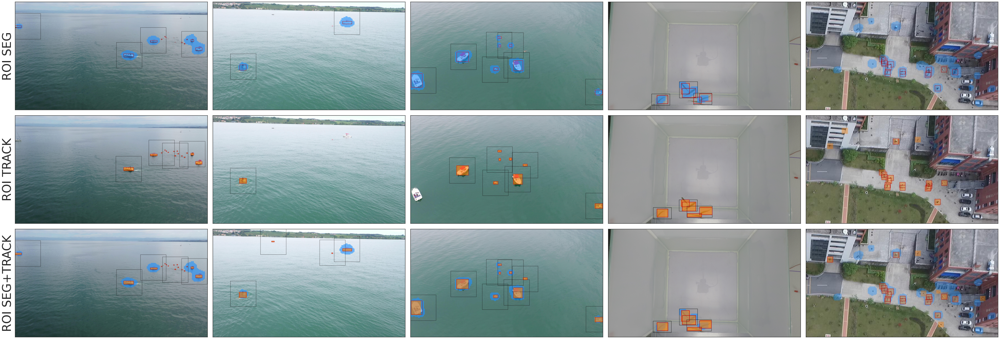

In [197]:
import seaborn as sns

H, W = cv2.imread(f'{parent_dir}/{list(subdirs.keys())[0]}/{images[0]}').shape[:2]
print(int(3*H/500), len(images)*int(W/500))
fig, axs = plt.subplots(3, len(images), figsize=(len(images)*int(W/300), int(3*H/300))) #, layout='constrained')
fig.subplots_adjust(wspace=0.025, hspace=0.05)
sns.set(style = 'white', font_scale = 3.2)


for r, (d_name, d_title) in enumerate(subdirs.items()):
    
    for c, img_name in enumerate(images):
        
        p = f'{parent_dir}/{d_name}/{img_name}'
        if not os.path.isfile(p):
            img = np.full((H,W,3), 255)
        else:
            img = cv2.imread(p)[:,:,::-1]
            img = cv2.resize(img, (W,H))
        
        if c == 0:
            axs[r,c].set_ylabel(d_title, fontsize=40)
        axs[r,c].imshow(img)
        axs[r,c].set_xticks([]); axs[r,c].set_yticks([])
        # if r==0:
        #     axs[r,c].set_title(f'{img_name}')
plt.savefig(f'../../plots/qualitative.png', bbox_inches='tight', facecolor='white', transparent=False)
plt.savefig(f'../../plots/qualitative.eps', bbox_inches='tight', facecolor='white', transparent=False)

# OBS vs NMS - Zebra

In [108]:
df = pd.read_csv('ablation/Zebra-OBS-iouths.csv')
df = df[['method', 'dataset', 'AP', 'AP50', 'TP', 'FP', 'FN', 'P', 'R', 'F1']]
df['method'] = df.apply(lambda x: x.dataset.split('-')[1], axis=1)
df['dataset'] = df.apply(lambda x: x.dataset.split('-')[-1].replace('th0', '0.'), axis=1)
df = df.rename(columns={'dataset':'iou_th'})
df = df.sort_values(by='AP', ascending=False, ignore_index=True)
df

,method,iou_th,AP,AP50,TP,FP,FN,P,R,F1
0,OBS_no_NMS_no_dil,0.5,71.591004,94.195928,15510.0,3799.0,732.0,80.325237,95.493166,87.254930
1,OBS_no_NMS_no_dil,0.6,71.557592,94.041598,15524.0,4638.0,718.0,76.996330,95.579362,85.287331
2,OBS_no_NMS_no_dil,0.4,71.519852,94.245164,15464.0,3174.0,778.0,82.970276,95.209950,88.669725
3,OBS_no_NMS_no_dil,0.3,71.248828,93.381814,15383.0,2743.0,859.0,84.867042,94.711242,89.519320
4,OBS_no_NMS_no_dil,0.7,71.157214,93.929011,15537.0,5868.0,705.0,72.585844,95.659402,82.540441
5,OBS_no_NMS_no_dil,0.2,70.346828,92.399854,15169.0,2448.0,1073.0,86.104331,93.393671,89.600992
6,OBS_no_NMS_no_dil,0.8,70.321926,92.875329,15544.0,7490.0,698.0,67.482851,95.702500,79.152663
7,OBS_no_NMS_no_dil,0.9,69.567023,91.864901,15550.0,9242.0,692.0,62.721846,95.739441,75.790808
8,OBS_no_NMS_no_dil,0.1,68.364507,89.478039,14688.0,2196.0,1554.0,86.993603,90.432213,88.679587
9,NMS_no_dil,0.9,68.353104,90.227554,15554.0,10899.0,688.0,58.798624,95.764068,72.860991


In [109]:
nms = df[df.method=='NMS_no_dil']
nms = nms.replace({'NMS_no_dil': 'NMS', 'NONE_no_dil': 'NONE'})
nms = nms[nms.iou_th.isin(['0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'])]
nms["iou_th"] = pd.to_numeric(nms["iou_th"])
nms = nms.sort_values(by=['iou_th'], ignore_index=True)
nms

,method,iou_th,AP,AP50,TP,FP,FN,P,R,F1
0,NMS,0.1,37.371401,65.631028,12334.0,3931.0,3908.0,75.831540,75.938924,75.885194
1,NMS,0.2,50.049119,84.678815,14346.0,4272.0,1896.0,77.054463,88.326561,82.306368
2,NMS,0.3,59.475237,91.316508,15169.0,5305.0,1073.0,74.089089,93.393671,82.628827
3,NMS,0.4,64.624071,91.535893,15384.0,6589.0,858.0,70.013198,94.717399,80.512888
4,NMS,0.5,67.315844,91.197454,15477.0,7877.0,765.0,66.271303,95.289989,78.174563
5,NMS,0.6,68.200035,90.534452,15531.0,8940.0,711.0,63.466961,95.622460,76.295041
6,NMS,0.7,68.247897,90.076913,15546.0,9847.0,696.0,61.221597,95.714813,74.677555
7,NMS,0.8,68.329756,89.833288,15550.0,10547.0,692.0,59.585393,95.739441,73.454734
8,NMS,0.9,68.353104,90.227554,15554.0,10899.0,688.0,58.798624,95.764068,72.860991


In [110]:
obs = df[df.method=='OBS_no_NMS_no_dil']
obs = obs.replace({'OBS_no_NMS_no_dil': 'OBS'})
obs = obs[~obs.iou_th.isin(['check'])]
obs["iou_th"] = pd.to_numeric(obs["iou_th"])
obs = obs.sort_values(by=['iou_th'], ignore_index=True)
obs

,method,iou_th,AP,AP50,TP,FP,FN,P,R,F1
0,OBS,0.1,68.364507,89.478039,14688.0,2196.0,1554.0,86.993603,90.432213,88.679587
1,OBS,0.2,70.346828,92.399854,15169.0,2448.0,1073.0,86.104331,93.393671,89.600992
2,OBS,0.3,71.248828,93.381814,15383.0,2743.0,859.0,84.867042,94.711242,89.519320
3,OBS,0.4,71.519852,94.245164,15464.0,3174.0,778.0,82.970276,95.209950,88.669725
4,OBS,0.5,71.591004,94.195928,15510.0,3799.0,732.0,80.325237,95.493166,87.254930
5,OBS,0.6,71.557592,94.041598,15524.0,4638.0,718.0,76.996330,95.579362,85.287331
6,OBS,0.7,71.157214,93.929011,15537.0,5868.0,705.0,72.585844,95.659402,82.540441
7,OBS,0.8,70.321926,92.875329,15544.0,7490.0,698.0,67.482851,95.702500,79.152663
8,OBS,0.9,69.567023,91.864901,15550.0,9242.0,692.0,62.721846,95.739441,75.790808


In [111]:
baseline = df[df.method=='NONE_no_dil']
baseline = baseline.replace({'NMS_no_dil': 'NMS', 'NONE_no_dil': 'NONE'})
baseline


df_zebra = pd.concat([baseline, nms, obs], ignore_index=True)
df_zebra['dataset'] = 'ZebraFish'
df_zebra

,method,iou_th,AP,AP50,TP,FP,FN,P,R,F1,dataset
0,NONE,NONE,68.337943,90.205468,15554.0,10954.0,688.0,58.676626,95.764068,72.767251,ZebraFish
1,NMS,0.1,37.371401,65.631028,12334.0,3931.0,3908.0,75.831540,75.938924,75.885194,ZebraFish
2,NMS,0.2,50.049119,84.678815,14346.0,4272.0,1896.0,77.054463,88.326561,82.306368,ZebraFish
3,NMS,0.3,59.475237,91.316508,15169.0,5305.0,1073.0,74.089089,93.393671,82.628827,ZebraFish
4,NMS,0.4,64.624071,91.535893,15384.0,6589.0,858.0,70.013198,94.717399,80.512888,ZebraFish
5,NMS,0.5,67.315844,91.197454,15477.0,7877.0,765.0,66.271303,95.289989,78.174563,ZebraFish
6,NMS,0.6,68.200035,90.534452,15531.0,8940.0,711.0,63.466961,95.622460,76.295041,ZebraFish
7,NMS,0.7,68.247897,90.076913,15546.0,9847.0,696.0,61.221597,95.714813,74.677555,ZebraFish
8,NMS,0.8,68.329756,89.833288,15550.0,10547.0,692.0,59.585393,95.739441,73.454734,ZebraFish
9,NMS,0.9,68.353104,90.227554,15554.0,10899.0,688.0,58.798624,95.764068,72.860991,ZebraFish


# OBS vs NMS - DroneCrowd

In [112]:
df = pd.read_csv('ablation/DC-OBS-iouths-val-conf.csv') #DC-OBS-iouths-val.csv')
df = df[['method', 'conf_th', 'iou_th', 'AP', 'AP50', 'TP', 'FP', 'FN', 'P', 'R', 'F1']]

baseline = df[df.method=='NONE']
baseline = baseline[baseline.conf_th==0.1]

df = df[df.iou_th.isin(['0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'])]
# df['method'] = df.apply(lambda x: x.dataset.split('-')[1], axis=1)
# df['dataset'] = df.apply(lambda x: x.dataset.split('-')[-1].replace('th0', '0.'), axis=1)
# df = df.rename(columns={'dataset':'iou_th'})
# df = df.sort_values(by='iou_th', ignore_index=True)


# # TODO NMS & NONE
nms = df[df.method=='NMS']
nms = nms[nms.iou_th.isin(['0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'])]
nms = nms[nms.conf_th==0.1]
nms["iou_th"] = pd.to_numeric(nms["iou_th"])
nms = nms.sort_values(by=['iou_th'], ignore_index=True)


nms_obs = df[df.method=='OBS']
nms_obs = nms_obs[~nms_obs.iou_th.isin(['check'])]
nms_obs = nms_obs[nms_obs.conf_th==0.1]
nms_obs["iou_th"] = pd.to_numeric(nms_obs["iou_th"])
nms_obs = nms_obs.sort_values(by=['iou_th'], ignore_index=True)
nms_obs.method = 'NMS+OBS'

obs = df[df.method=='OBS_no_NMS']
obs = obs[~obs.iou_th.isin(['check'])]
obs = obs[obs.conf_th==0.1]
obs["iou_th"] = pd.to_numeric(obs["iou_th"])
obs = obs.sort_values(by=['iou_th'], ignore_index=True)
obs.method = 'OBS'


df_dc = pd.concat([baseline, nms, obs, nms_obs], ignore_index=True)
df_dc['dataset'] = 'DroneCrowd'
df_dc = df_dc[['method', 'iou_th', 'AP', 'AP50', 'TP', 'FP', 'FN', 'P', 'R', 'F1', 'dataset']]
df_dc

,method,iou_th,AP,AP50,TP,FP,FN,P,R,F1,dataset
0,NONE,NONE,15.014537,34.778110,34260.0,110283.0,14792.0,23.702289,69.844247,35.393476,DroneCrowd
1,NMS,0.1,12.484437,37.746330,21570.0,15742.0,27482.0,57.809820,43.973742,49.951369,DroneCrowd
2,NMS,0.2,16.801756,48.005151,25802.0,16819.0,23250.0,60.538232,52.601321,56.291384,DroneCrowd
3,NMS,0.3,20.199635,54.198778,28683.0,18771.0,20369.0,60.443798,58.474680,59.442936,DroneCrowd
4,NMS,0.4,22.209052,57.199239,30372.0,21111.0,18680.0,58.994231,61.917965,60.420749,DroneCrowd
5,NMS,0.5,23.556620,59.001541,31578.0,24334.0,17474.0,56.478037,64.376580,60.169201,DroneCrowd
6,NMS,0.6,24.266146,59.710870,32463.0,29242.0,16589.0,52.609999,66.180788,58.620223,DroneCrowd
7,NMS,0.7,24.488316,59.099285,33105.0,36300.0,15947.0,47.698293,67.489603,55.893700,DroneCrowd
8,NMS,0.8,24.003366,57.034086,33456.0,45594.0,15596.0,42.322581,68.205170,52.233377,DroneCrowd
9,NMS,0.9,21.648267,50.672452,33428.0,60856.0,15624.0,35.454584,68.148088,46.642853,DroneCrowd


# OBS vs NMS - SeaDronesSee

## plots all_dses

In [113]:
df = pd.read_csv('ablation/SDS-OBS-iouths-val-OBS-only.csv')
df = df[['method', 'conf_th', 'iou_th', 'AP', 'AP50', 'TP', 'FP', 'FN', 'P', 'R', 'F1']]
df = df[df.conf_th==0.1]
df = df[[x for x in df.columns if x!='conf_th']]
df['dataset'] = 'SeaDronesSee'
df_sds = df

df_sds = df_sds.replace({'OBS': 'NMS+OBS'})
df_sds = df_sds.replace({'OBS_no_NMS': 'OBS'})
df_sds

,method,iou_th,AP,AP50,TP,FP,FN,P,R,F1,dataset
0,NMS,0.2,33.322785,60.142837,31817.0,12262.0,7173.0,72.181765,81.602975,76.603787,SeaDronesSee
9,NMS,0.3,34.635844,60.238715,32143.0,13343.0,6847.0,70.665699,82.439087,76.099721,SeaDronesSee
18,NMS,0.4,35.788008,60.070802,32398.0,14590.0,6592.0,68.949519,83.093101,75.363465,SeaDronesSee
27,NMS,0.5,36.274657,59.562400,32470.0,15894.0,6520.0,67.136713,83.277764,74.341186,SeaDronesSee
36,NMS,0.6,36.405002,58.945636,32553.0,17249.0,6437.0,65.364845,83.490639,73.324173,SeaDronesSee
45,NMS,0.7,36.329999,58.483262,32625.0,18636.0,6365.0,63.644876,83.675301,72.298368,SeaDronesSee
54,NMS,0.8,36.148904,57.907592,32669.0,20146.0,6321.0,61.855533,83.788151,71.170416,SeaDronesSee
63,NMS,0.9,35.689789,56.886302,32732.0,21817.0,6258.0,60.004766,83.949731,69.985781,SeaDronesSee
72,NONE,NONE,33.706392,53.327288,33193.0,24590.0,5797.0,57.444231,85.132085,68.599713,SeaDronesSee
81,NMS,0.1,31.784087,59.448716,31403.0,11198.0,7587.0,73.714232,80.541164,76.976627,SeaDronesSee


In [114]:
all_dses = pd.concat([df_zebra, df_dc, df_sds], ignore_index=True)
all_dses.to_csv('ablation/NMS-OBS-all-datasets-sds-dc-val-sds-nms-obs-nms+obs.csv', index=False)
all_dses

,method,iou_th,AP,AP50,TP,FP,FN,P,R,F1,dataset
0,NONE,NONE,68.337943,90.205468,15554.0,10954.0,688.0,58.676626,95.764068,72.767251,ZebraFish
1,NMS,0.1,37.371401,65.631028,12334.0,3931.0,3908.0,75.831540,75.938924,75.885194,ZebraFish
2,NMS,0.2,50.049119,84.678815,14346.0,4272.0,1896.0,77.054463,88.326561,82.306368,ZebraFish
3,NMS,0.3,59.475237,91.316508,15169.0,5305.0,1073.0,74.089089,93.393671,82.628827,ZebraFish
4,NMS,0.4,64.624071,91.535893,15384.0,6589.0,858.0,70.013198,94.717399,80.512888,ZebraFish
...,...,...,...,...,...,...,...,...,...,...,...
70,OBS,0.5,37.748990,60.296341,33103.0,9959.0,5887.0,76.872881,84.901257,80.687856,SeaDronesSee
71,OBS,0.6,37.732948,60.233873,33097.0,10695.0,5893.0,75.577731,84.885868,79.961827,SeaDronesSee
72,OBS,0.7,37.761847,60.253911,33115.0,11787.0,5875.0,73.749499,84.932034,78.946741,SeaDronesSee
73,OBS,0.8,37.701976,60.132030,33124.0,13547.0,5866.0,70.973410,84.955117,77.337411,SeaDronesSee


In [120]:
all_dses[all_dses.method=='NONE']

,method,iou_th,AP,AP50,TP,FP,FN,P,R,F1,dataset
0,NONE,NONE,68.337943,90.205468,15554.0,10954.0,688.0,58.676626,95.764068,72.767251,ZebraFish
19,NONE,NONE,15.014537,34.778110,34260.0,110283.0,14792.0,23.702289,69.844247,35.393476,DroneCrowd
55,NONE,NONE,33.706392,53.327288,33193.0,24590.0,5797.0,57.444231,85.132085,68.599713,SeaDronesSee


### F1(iou_th)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

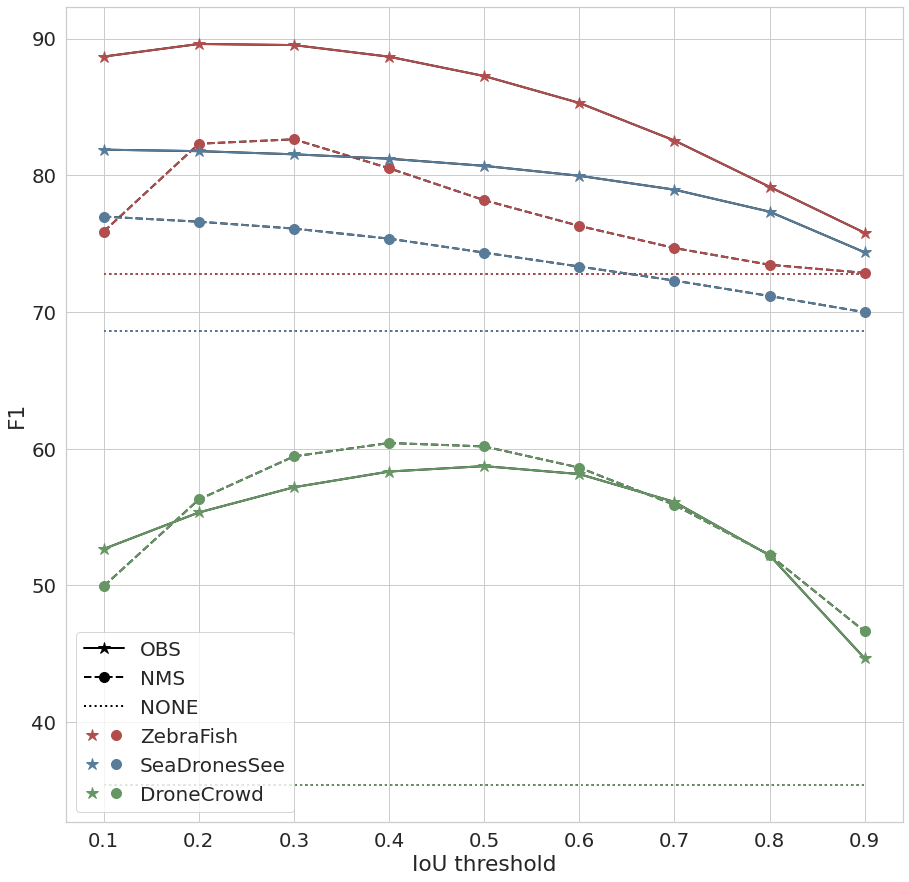

In [127]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerTuple

all_dses_ = all_dses #[all_dses.method!='NONE']
ious = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
datasets = ['ZebraFish', 'SeaDronesSee', 'DroneCrowd'] #all_dses_.dataset.unique()

plt.tight_layout()
plt.figure(figsize=(15,15))
ax  = plt.gca()

sns.set(style = 'whitegrid', font_scale = 1.8)
palette = sns.color_palette("Set1", n_colors=9, desat=0.5)

obsm, nmsm, basem, confs_ = [],[],[],[]

for i, dataset in enumerate(datasets):
    
    df = all_dses_[all_dses_.dataset==dataset]
    
    baseline_df = df[df.method=='NONE']
    
    df = df[df.method!='NONE']
    df.iou_th = df.apply(lambda x: float(x.iou_th), axis=1)
    df = df.sort_values(by='iou_th', ignore_index=True)
    
    nms_df = df[df.method=='NMS']
    obs_df = df[df.method=='OBS']
    
    # print(baseline_df)
    # nms_obs_df = df[df.method=='NMS+OBS']
    
    
    li_nms, = plt.plot(nms_df.iou_th.values, nms_df.F1.values, color='black', linestyle='--', marker='', linewidth=2, label=dataset)
    li_obs, = plt.plot(obs_df.iou_th.values, obs_df.F1.values, color='black', linestyle='-', marker='', linewidth=2)
    li_base, = plt.plot(obs_df.iou_th.values, [baseline_df.F1.values for _ in range(len(obs_df.iou_th.values))], color='black', linestyle='dotted', marker='', linewidth=2)
    # li_nms_obs, = plt.plot(nms_obs_df.iou_th.values, nms_obs_df.F1.values, color='black', linestyle='dotted', marker='', linewidth=2)
    
    
    li_nms_, = plt.plot(nms_df.iou_th.values, nms_df.F1.values, color=palette[i], linestyle='--', marker='', linewidth=2, label=dataset)
    li_obs_, = plt.plot(obs_df.iou_th.values, obs_df.F1.values, color=palette[i], linestyle='-', marker='', linewidth=2)
    li_base_, = plt.plot(obs_df.iou_th.values, [baseline_df.F1.values for _ in range(len(obs_df.iou_th.values))], color=palette[i], linestyle='dotted', marker='', linewidth=2)
    # li_nms_obs_, = plt.plot(nms_obs_df.iou_th.values, nms_obs_df.F1.values, color=palette[i], linestyle='dotted', marker='', linewidth=2)

    ma_nms, = plt.plot(nms_df.iou_th.values, nms_df.F1.values, color=palette[i], marker='o',  linestyle='', markersize=10, label='NMS' if i==0 else '')
    ma_obs, = plt.plot(obs_df.iou_th.values, obs_df.F1.values, color=palette[i], marker='*',  linestyle='', markersize=12, label='OBS' if i==0 else '')
    # ma_base, = plt.plot(obs_df.iou_th.values, [baseline_df.F1.values for _ in range(len(obs_df.iou_th.values))], color=palette[i], marker='d',  linestyle='', markersize=12, label='NONE' if i==0 else '')
    # ma_nms_obs, = plt.plot(nms_obs_df.iou_th.values, nms_obs_df.F1.values, color=palette[i], marker='d',  linestyle='', markersize=12, label='NMS+OBS' if i==0 else '')
    obsm.append(ma_obs)
    nmsm.append(ma_nms)
    # basem.append(ma_base)
    # nmsobsm.append(ma_nms_obs)
    
plt.xlabel('IoU threshold')
plt.ylabel('F1')

# labels = ['OBS', 'NMS', 'NMS+OBS']+[f'{dataset}' for dataset in datasets]

# art =  [[ma_obs, li_obs],[ma_nms, li_nms], [ma_nms_obs,li_nms_obs]]
# for obsm_, nmsm_, nmsobsm_ in zip(obsm, nmsm,nmsobsm):
#     art.append((obsm_, nmsm_, nmsobsm_))
# ax.legend(art, labels, handler_map={list: HandlerTuple(1), tuple: HandlerTuple(3)}, fontsize=20)

labels = ['OBS', 'NMS', 'NONE']+[f'{dataset}' for dataset in datasets]

# art =  [[ma_obs, li_obs],[ma_nms, li_nms],[ma_base, li_base]]
# for obsm_, nmsm_, basem_ in zip(obsm, nmsm, basem):
#     art.append((obsm_, nmsm_, basem_))
# ax.legend(art, labels, handler_map={list: HandlerTuple(1), tuple: HandlerTuple(3)}, fontsize=20)
art =  [[ma_obs, li_obs],[ma_nms, li_nms], li_base]
for obsm_, nmsm_ in zip(obsm, nmsm):
    art.append((obsm_, nmsm_))
ax.legend(art, labels, handler_map={list: HandlerTuple(1), tuple: HandlerTuple(2)}, fontsize=20)


leg = ax.get_legend()
leg.legendHandles[0].set_color('black')
leg.legendHandles[1].set_color('black')
leg.legendHandles[2].set_color('black')


plt.savefig('../../plots/OBS-vs-NMS-F1-datasets-val.png', bbox_inches='tight', pad_inches=0)
plt.savefig('../../plots/OBS-vs-NMS-F1-datasets-val.eps', bbox_inches='tight', pad_inches=0)

### bar - fixed iou_th

In [106]:
ths_obs = {"ZebraFish": 0.2, "SeaDronesSee": 0.1, "DroneCrowd": 0.5}
ths_nms = {"ZebraFish": 0.3, "SeaDronesSee": 0.1, "DroneCrowd": 0.4} 


to_concat = []
for ds, obs_th in ths_obs.items():
    
    nms_th = ths_nms[ds]
    # print(all_dses)
    df_ = all_dses_[(all_dses_.dataset==ds) & (((all_dses_.method=='NMS') & (pd.to_numeric(all_dses_.iou_th)==nms_th)) | ((all_dses_.method=='OBS') & (pd.to_numeric(all_dses_.iou_th)==obs_th)))]
    to_concat.append(df_)
    
to_concat = to_concat+[all_dses[all_dses.method=='NONE']]
all_compare = pd.concat(to_concat, ignore_index=True)
all_compare = all_compare.sort_values(by=['dataset', 'method'], ascending=False, ignore_index=True)
all_compare = all_compare[['dataset']+[x for x in all_compare.columns[:-1]]]
all_compare

# metrics_roi_track = metrics_roi_track.sort_values(by='input size', key = lambda col: [int(x.split('x')[0]) for x in col])

,dataset,method,iou_th,AP,AP50,TP,FP,FN,P,R,F1
0,ZebraFish,OBS,0.2,70.346828,92.399854,15169.0,2448.0,1073.0,86.104331,93.393671,89.600992
1,ZebraFish,NONE,NONE,68.337943,90.205468,15554.0,10954.0,688.0,58.676626,95.764068,72.767251
2,ZebraFish,NMS,0.3,59.475237,91.316508,15169.0,5305.0,1073.0,74.089089,93.393671,82.628827
3,SeaDronesSee,OBS,0.1,37.624760,60.054525,33120.0,8798.0,5870.0,79.011403,84.944858,81.870767
4,SeaDronesSee,NONE,NONE,33.706392,53.327288,33193.0,24590.0,5797.0,57.444231,85.132085,68.599713
5,SeaDronesSee,NMS,0.1,31.784087,59.448716,31403.0,11198.0,7587.0,73.714232,80.541164,76.976627
6,DroneCrowd,OBS,0.5,23.712206,57.800119,31497.0,26712.0,17555.0,54.110189,64.211449,58.729641
7,DroneCrowd,NONE,NONE,15.014537,34.778110,34260.0,110283.0,14792.0,23.702289,69.844247,35.393476
8,DroneCrowd,NMS,0.4,22.209052,57.199239,30372.0,21111.0,18680.0,58.994231,61.917965,60.420749


In [107]:
out_table = '../../tables/all-datasets-NMS-OBS-NONE-sds-dc-val.tex'

header = all_compare.columns.tolist()

rows = []
for i in range(len(all_compare)):
    row = all_compare.iloc[i].values.tolist()
    formatted_row = []
    for j,x in enumerate(row):
        if isinstance(x, str) or isinstance(x, np.int64):
            formatted_row.append(x)
            continue
        elif isinstance(x, float):
            formatted_row.append(f'{x:.1f}')
        else:
            print(type(x))

    rows.append(formatted_row)

open(out_table, 'w').write(tabulate(rows, header, tablefmt='latex_raw', stralign='center', numalign='left', floatfmt=".1f"))
print(tabulate(rows, header))

dataset       method    iou_th      AP    AP50     TP      FP     FN     P     R    F1
------------  --------  --------  ----  ------  -----  ------  -----  ----  ----  ----
ZebraFish     OBS       0.2       70.3    92.4  15169    2448   1073  86.1  93.4  89.6
ZebraFish     NONE      NONE      68.3    90.2  15554   10954    688  58.7  95.8  72.8
ZebraFish     NMS       0.3       59.5    91.3  15169    5305   1073  74.1  93.4  82.6
SeaDronesSee  OBS       0.1       37.6    60.1  33120    8798   5870  79    84.9  81.9
SeaDronesSee  NONE      NONE      33.7    53.3  33193   24590   5797  57.4  85.1  68.6
SeaDronesSee  NMS       0.1       31.8    59.4  31403   11198   7587  73.7  80.5  77
DroneCrowd    OBS       0.5       23.7    57.8  31497   26712  17555  54.1  64.2  58.7
DroneCrowd    NONE      NONE      15      34.8  34260  110283  14792  23.7  69.8  35.4
DroneCrowd    NMS       0.4       22.2    57.2  30372   21111  18680  59    61.9  60.4


/tmp/ipykernel_2294171/513016033.py:20: ResourceWarning: unclosed file <_io.TextIOWrapper name='../../tables/all-datasets-NMS-OBS-NONE-sds-dc-val.tex' mode='w' encoding='UTF-8'>
  open(out_table, 'w').write(tabulate(rows, header, tablefmt='latex_raw', stralign='center', numalign='left', floatfmt=".1f"))


## SDS - OBS, NMS, all confs and ious

### PR curves x N

In [61]:
# df = pd.read_csv('ablation/SDS-OBS-iouths.csv')
# df = pd.read_csv('ablation/SDS-OBS-iouths-val-OBS-only.csv')
df = pd.read_csv('ablation/DC-OBS-iouths-val-conf.csv')
df = df[['method', 'conf_th', 'iou_th', 'AP', 'AP50', 'TP', 'FP', 'FN', 'P', 'R', 'F1']]
df

,method,conf_th,iou_th,AP,AP50,TP,FP,FN,P,R,F1
0,NMS,0.1,0.1,12.484437,37.746330,21570.0,15742.0,27482.0,57.809820,43.973742,49.951369
1,NMS,0.2,0.1,12.484437,37.746330,19960.0,10913.0,29092.0,64.651961,40.691511,49.946825
2,NMS,0.3,0.1,12.484437,37.746330,18407.0,7976.0,30645.0,69.768411,37.525483,48.802280
3,NMS,0.4,0.1,12.484437,37.746330,16416.0,5766.0,32636.0,74.005951,33.466525,46.090350
4,NMS,0.5,0.1,12.484437,37.746330,13641.0,3838.0,35411.0,78.042222,27.809264,41.006448
...,...,...,...,...,...,...,...,...,...,...,...
256,OBS_no_NMS,0.5,0.9,21.920220,51.284986,19417.0,8911.0,29635.0,68.543491,39.584523,50.186095
257,OBS_no_NMS,0.6,0.9,21.920220,51.284986,11725.0,3239.0,37327.0,78.354718,23.903205,36.631467
258,OBS_no_NMS,0.7,0.9,21.920220,51.284986,1961.0,183.0,47091.0,91.464552,3.997798,7.660755
259,OBS_no_NMS,0.8,0.9,21.920220,51.284986,1.0,0.0,49051.0,100.000000,0.002039,0.004077


In [62]:
nms = df[df.method=='NMS']
nms = nms[nms.iou_th.isin(['0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'])]
nms["iou_th"] = pd.to_numeric(nms["iou_th"])
nms = nms.sort_values(by=['iou_th', 'conf_th'], ignore_index=True)
nms

,method,conf_th,iou_th,AP,AP50,TP,FP,FN,P,R,F1
0,NMS,0.1,0.1,12.484437,37.746330,21570.0,15742.0,27482.0,57.809820,43.973742,49.951369
1,NMS,0.2,0.1,12.484437,37.746330,19960.0,10913.0,29092.0,64.651961,40.691511,49.946825
2,NMS,0.3,0.1,12.484437,37.746330,18407.0,7976.0,30645.0,69.768411,37.525483,48.802280
3,NMS,0.4,0.1,12.484437,37.746330,16416.0,5766.0,32636.0,74.005951,33.466525,46.090350
4,NMS,0.5,0.1,12.484437,37.746330,13641.0,3838.0,35411.0,78.042222,27.809264,41.006448
...,...,...,...,...,...,...,...,...,...,...,...
76,NMS,0.5,0.9,21.648267,50.672452,19602.0,9644.0,29450.0,67.024550,39.961673,50.070244
77,NMS,0.6,0.9,21.648267,50.672452,12031.0,3550.0,37021.0,77.215840,24.527033,37.228660
78,NMS,0.7,0.9,21.648267,50.672452,2166.0,212.0,46886.0,91.084945,4.415722,8.423099
79,NMS,0.8,0.9,21.648267,50.672452,2.0,0.0,49050.0,100.000000,0.004077,0.008154


In [67]:
obs = df[df.method=='OBS_no_NMS']
obs = obs[obs.iou_th.isin(['0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'])]

obs["iou_th"] = pd.to_numeric(obs["iou_th"])
obs = obs.sort_values(by=['iou_th', 'conf_th'], ignore_index=True)
obs

,method,conf_th,iou_th,AP,AP50,TP,FP,FN,P,R,F1
0,OBS_no_NMS,0.1,0.1,18.62544,45.870516,24764.0,20217.0,24288.0,55.054356,50.485199,52.670871
1,OBS_no_NMS,0.2,0.1,18.62544,45.870516,22805.0,12031.0,26247.0,65.463888,46.491478,54.370113
2,OBS_no_NMS,0.3,0.1,18.62544,45.870516,20897.0,7977.0,28155.0,72.373069,42.601729,53.632934
3,OBS_no_NMS,0.4,0.1,18.62544,45.870516,18484.0,5180.0,30568.0,78.110210,37.682459,50.838880
4,OBS_no_NMS,0.5,0.1,18.62544,45.870516,15164.0,3019.0,33888.0,83.396579,30.914132,45.107459
...,...,...,...,...,...,...,...,...,...,...,...
76,OBS_no_NMS,0.5,0.9,21.92022,51.284986,19417.0,8911.0,29635.0,68.543491,39.584523,50.186095
77,OBS_no_NMS,0.6,0.9,21.92022,51.284986,11725.0,3239.0,37327.0,78.354718,23.903205,36.631467
78,OBS_no_NMS,0.7,0.9,21.92022,51.284986,1961.0,183.0,47091.0,91.464552,3.997798,7.660755
79,OBS_no_NMS,0.8,0.9,21.92022,51.284986,1.0,0.0,49051.0,100.000000,0.002039,0.004077


In [65]:
baseline = df[df.method=='NONE']
baseline = baseline.sort_values(by=['conf_th'], ignore_index=True)
baseline

,method,conf_th,iou_th,AP,AP50,TP,FP,FN,P,R,F1
0,NONE,0.1,NONE,15.014537,34.77811,34260.0,110283.0,14792.0,23.702289,69.844247,35.393476
1,NONE,0.2,NONE,15.014537,34.77811,31079.0,70954.0,17973.0,30.459753,63.359292,41.141080
2,NONE,0.3,NONE,15.014537,34.77811,28105.0,52756.0,20947.0,34.757176,57.296339,43.267417
3,NONE,0.4,NONE,15.014537,34.77811,24519.0,39642.0,24533.0,38.214803,49.985729,43.314814
4,NONE,0.5,NONE,15.014537,34.77811,19769.0,26812.0,29283.0,42.440051,40.302128,41.343469
5,NONE,0.6,NONE,15.014537,34.77811,12142.0,12493.0,36910.0,49.287599,24.753323,32.955610
6,NONE,0.7,NONE,15.014537,34.77811,2167.0,1155.0,46885.0,65.231788,4.417761,8.275098
7,NONE,0.8,NONE,15.014537,34.77811,2.0,0.0,49050.0,100.000000,0.004077,0.008154
8,NONE,0.9,NONE,15.014537,34.77811,0.0,0.0,49052.0,NaN,0.000000,NaN


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

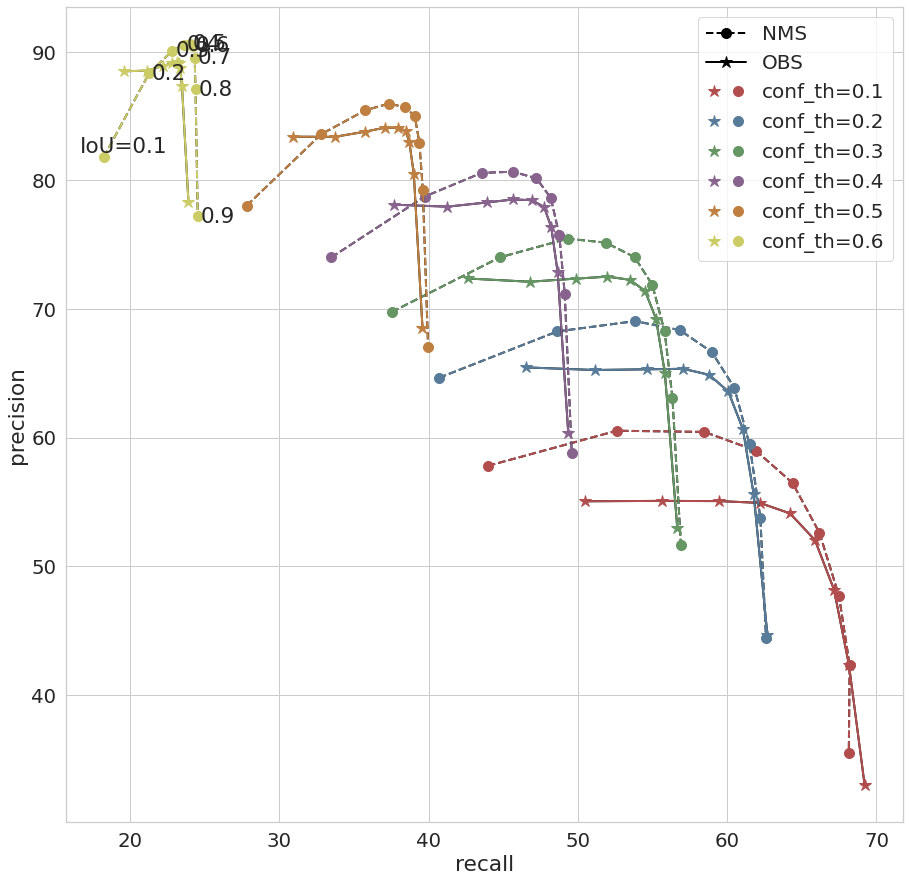

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerTuple

ious = nms.iou_th.unique()
confs = nms.conf_th.unique()
markers = ['o', 'v', '^', '*', '4', 'P', 'p', 'X', 'H']

plt.tight_layout()
plt.figure(figsize=(15,15))
ax  = plt.gca()

sns.set(style = 'whitegrid', font_scale = 1.8)
palette = sns.color_palette("Set1", n_colors=9, desat=0.5)

obsm, nmsm, confs_ = [],[],[]

for i, conf in enumerate(confs):
    if conf>0.6:
        continue
    confs_.append(conf)
    nms_ = nms[nms.conf_th==conf]
    obs_ = obs[obs.conf_th==conf]
    
    nms_ious = nms_.iou_th.values
    obs_ious = obs_.iou_th.values
    assert all([x==y for x,y in zip(nms_ious, obs_ious)])
#     print(nms_ious)
#     print(obs_ious)
    
    nms_ys = nms_.P.values
    nms_xs = nms_.R.values
    
    obs_ys = obs_.P.values
    obs_xs = obs_.R.values
    
    
    
    li_nms, = plt.plot(nms_xs, nms_ys, color='black', linestyle='--', marker='', linewidth=2, label=f'conf_th={conf}') #, label=f'NMS iou_th={iou}')
    li_obs, = plt.plot(obs_xs, obs_ys, color='black', linestyle='-', marker='', linewidth=2)
    
    li_nms_, = plt.plot(nms_xs, nms_ys, color=palette[i], linestyle='--', marker='', linewidth=2, label=f'conf_th={conf}') #, label=f'NMS iou_th={iou}')
    li_obs_, = plt.plot(obs_xs, obs_ys, color=palette[i], linestyle='-', marker='', linewidth=2) #, label=f'NMS iou_th={iou}')
    # plt.plot(nms_xs, nms_ys, color=palette[i], marker='x', linewidth=2, markersize=8, label=f'NMS conf_th={conf}')
    # plt.plot(obs_xs, obs_ys, color=palette[i], marker='o', linewidth=2, markersize=8, label=f'OBS conf_th={conf}')
    ma_nms, = plt.plot(nms_xs, nms_ys, color=palette[i], marker='o',  linestyle='', markersize=10, label='NMS' if i==0 else '') #, label=f'NMS iou_th={iou}')
    ma_obs, = plt.plot(obs_xs, obs_ys, color=palette[i], marker='*',  linestyle='', markersize=12, label='OBS' if i==0 else '') #, label=f'NMS iou_th={iou}')
    # print(ma_nms[0])
    obsm.append(ma_obs)
    nmsm.append(ma_nms)
    # break
    
    if i == 5:
        line = li_nms_
        
        for i, (x, y) in enumerate(zip(line.get_xdata()[1:-1], line.get_ydata()[1:-1])):
            label = "{:.1f}".format(nms_ious[i+1])
            ax.annotate(label,(x, y), xytext=(20, -10), textcoords="offset points", ha='center', va='bottom')  
            
        x = line.get_xdata()[-1]
        y = line.get_ydata()[-1]
        label = "{:.1f}".format(nms_ious[-1])
        ax.annotate(label,(x, y), xytext=(20, -10), textcoords="offset points", ha='center', va='bottom')  
        
        line = li_nms_
        x = line.get_xdata()[0]
        y = line.get_ydata()[0]
        label = "IoU={:.1f}".format(nms_ious[0])
        ax.annotate(label,(x, y), xytext=(20, 0), textcoords="offset points", ha='center', va='bottom')  
    
    
plt.xlabel('recall')
plt.ylabel('precision')

labels = ['NMS', 'OBS']+[f'conf_th={c:.1f}' for c in confs_]

art =  [[ma_nms, li_nms], [ma_obs, li_obs]]
for obsm_, nmsm_ in zip(obsm, nmsm):
    art.append((obsm_, nmsm_))
ax.legend(art, labels, handler_map={list: HandlerTuple(1), tuple: HandlerTuple(2)}, fontsize=20)
# ax.set_aspect('equal', adjustable='datalim', anchor='SW')

leg = ax.get_legend()
leg.legendHandles[0].set_color('black')
leg.legendHandles[1].set_color('black')

# plt.xlim([])


plt.savefig('../../plots/OBS-vs-NMS-PR-val-DC-OBS-only.png', bbox_inches='tight', pad_inches=0)
plt.savefig('../../plots/OBS-vs-NMS-PR-val-DC-OBS-only.eps', bbox_inches='tight', pad_inches=0)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

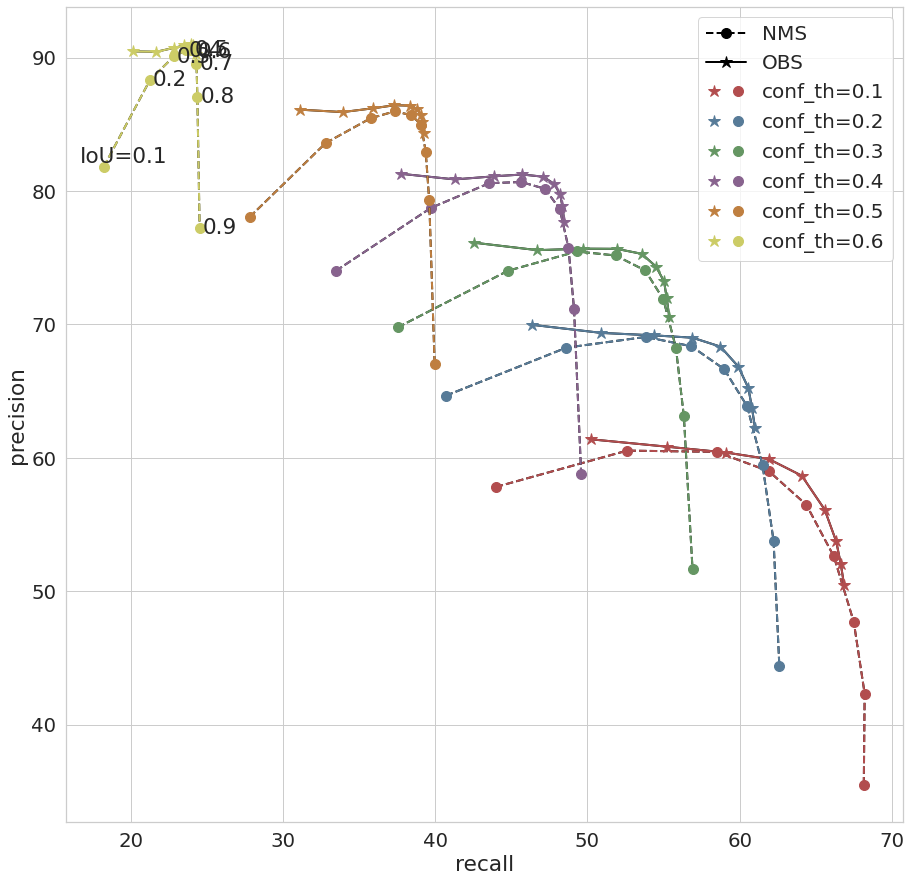

In [66]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerTuple

ious = nms.iou_th.unique()
confs = nms.conf_th.unique()
markers = ['o', 'v', '^', '*', '4', 'P', 'p', 'X', 'H']

plt.tight_layout()
plt.figure(figsize=(15,15))
ax  = plt.gca()

sns.set(style = 'whitegrid', font_scale = 1.8)
palette = sns.color_palette("Set1", n_colors=9, desat=0.5)

obsm, nmsm, confs_ = [],[],[]

for i, conf in enumerate(confs):
    if conf>0.6:
        continue
    confs_.append(conf)
    nms_ = nms[nms.conf_th==conf]
    obs_ = obs[obs.conf_th==conf]
    
    nms_ious = nms_.iou_th.values
    obs_ious = obs_.iou_th.values
    assert all([x==y for x,y in zip(nms_ious, obs_ious)])
#     print(nms_ious)
#     print(obs_ious)
    
    nms_ys = nms_.P.values
    nms_xs = nms_.R.values
    
    obs_ys = obs_.P.values
    obs_xs = obs_.R.values
    
    
    
    li_nms, = plt.plot(nms_xs, nms_ys, color='black', linestyle='--', marker='', linewidth=2, label=f'conf_th={conf}') #, label=f'NMS iou_th={iou}')
    li_obs, = plt.plot(obs_xs, obs_ys, color='black', linestyle='-', marker='', linewidth=2)
    
    li_nms_, = plt.plot(nms_xs, nms_ys, color=palette[i], linestyle='--', marker='', linewidth=2, label=f'conf_th={conf}') #, label=f'NMS iou_th={iou}')
    li_obs_, = plt.plot(obs_xs, obs_ys, color=palette[i], linestyle='-', marker='', linewidth=2) #, label=f'NMS iou_th={iou}')
    # plt.plot(nms_xs, nms_ys, color=palette[i], marker='x', linewidth=2, markersize=8, label=f'NMS conf_th={conf}')
    # plt.plot(obs_xs, obs_ys, color=palette[i], marker='o', linewidth=2, markersize=8, label=f'OBS conf_th={conf}')
    ma_nms, = plt.plot(nms_xs, nms_ys, color=palette[i], marker='o',  linestyle='', markersize=10, label='NMS' if i==0 else '') #, label=f'NMS iou_th={iou}')
    ma_obs, = plt.plot(obs_xs, obs_ys, color=palette[i], marker='*',  linestyle='', markersize=12, label='OBS' if i==0 else '') #, label=f'NMS iou_th={iou}')
    # print(ma_nms[0])
    obsm.append(ma_obs)
    nmsm.append(ma_nms)
    # break
    
    if i == 5:
        line = li_nms_
        
        for i, (x, y) in enumerate(zip(line.get_xdata()[1:-1], line.get_ydata()[1:-1])):
            label = "{:.1f}".format(nms_ious[i+1])
            ax.annotate(label,(x, y), xytext=(20, -10), textcoords="offset points", ha='center', va='bottom')  
            
        x = line.get_xdata()[-1]
        y = line.get_ydata()[-1]
        label = "{:.1f}".format(nms_ious[-1])
        ax.annotate(label,(x, y), xytext=(20, -10), textcoords="offset points", ha='center', va='bottom')  
        
        line = li_nms_
        x = line.get_xdata()[0]
        y = line.get_ydata()[0]
        label = "IoU={:.1f}".format(nms_ious[0])
        ax.annotate(label,(x, y), xytext=(20, 0), textcoords="offset points", ha='center', va='bottom')  
    
    
plt.xlabel('recall')
plt.ylabel('precision')

labels = ['NMS', 'OBS']+[f'conf_th={c:.1f}' for c in confs_]

art =  [[ma_nms, li_nms], [ma_obs, li_obs]]
for obsm_, nmsm_ in zip(obsm, nmsm):
    art.append((obsm_, nmsm_))
ax.legend(art, labels, handler_map={list: HandlerTuple(1), tuple: HandlerTuple(2)}, fontsize=20)
# ax.set_aspect('equal', adjustable='datalim', anchor='SW')

leg = ax.get_legend()
leg.legendHandles[0].set_color('black')
leg.legendHandles[1].set_color('black')

# plt.xlim([])


plt.savefig('../../plots/OBS-vs-NMS-PR-val-DC-OBS+NMS.png', bbox_inches='tight', pad_inches=0)
plt.savefig('../../plots/OBS-vs-NMS-PR-val-DC-OBS+NMS.eps', bbox_inches='tight', pad_inches=0)

## best diff FP 

In [350]:
def get_biggest_diff(pred_nms, pred_obs, gt, conf, iou_th):
    gt = json.load(open(gt))
    pred_obs = json.load(open(pred_obs))
    pred_nms = json.load(open(pred_nms))
    unique_ids = sorted(list(set([x['id'] for x in gt['images']])))
    id2img_path = {}
    for i, id in enumerate(unique_ids):
        id2img_path[i]=[x['file_name'] for x in gt['images'] if x['id']==id][0]


    gt_objects = []
    for img_id in unique_ids:
        img_annos = [x for x in gt['annotations'] if x['image_id']==img_id]

        img_bboxes = []

        for img_anno in img_annos:
            xmin,ymin,w,h = img_anno['bbox']
            xmax,ymax = xmin+w, ymin+h
            cls = img_anno['category_id']
            img_bboxes.append([xmin,ymin,xmax,ymax,cls])
        gt_objects.append(img_bboxes)

    nc = len(gt['categories'])


    pred_objects_obs = []
    for img_id in unique_ids:
        img_annos = [x for x in pred_obs if x['image_id']==img_id]

        img_bboxes = []

        for img_anno in img_annos:
            xmin,ymin,w,h = img_anno['bbox']
            xmax,ymax = xmin+w, ymin+h
            cls = img_anno['category_id']
            score = img_anno['score']
            img_bboxes.append([xmin,ymin,xmax,ymax,score,cls])
        pred_objects_obs.append(img_bboxes)

    pred_objects_nms = []
    for img_id in unique_ids:
        img_annos = [x for x in pred_nms if x['image_id']==img_id]

        img_bboxes = []

        for img_anno in img_annos:
            xmin,ymin,w,h = img_anno['bbox']
            xmax,ymax = xmin+w, ymin+h
            cls = img_anno['category_id']
            score = img_anno['score']
            img_bboxes.append([xmin,ymin,xmax,ymax,score,cls])
        pred_objects_nms.append(img_bboxes)    
    
    assert len(pred_objects_obs)==len(pred_objects_nms)==len(gt_objects)
    
    
    fps_per_img_nms = []
    for i in range(len(gt_objects)):

        img_gt = torch.tensor(gt_objects[i])
        img_pred = torch.tensor(pred_objects_nms[i])

        if img_gt.numel():
            gt_bboxes = img_gt[:, :-1]
            gt_cls = img_gt[:,-1]
        else:
            gt_bboxes = torch.empty((0,4))
            gt_cls = torch.empty((0))

        CM = metrics.ConfusionMatrix(nc, conf=conf, iou_thres=iou_th)
        CM.process_batch(img_pred, gt_bboxes, gt_cls)
        tp, fp, fn = CM.tp_fp_fn()    
        tp, fp, fn = tp.sum(), fp.sum(), fn.sum()
        fps_per_img_nms.append(fp)
        
    fps_per_img_obs = []
    for i in range(len(gt_objects)):

        img_gt = torch.tensor(gt_objects[i])
        img_pred = torch.tensor(pred_objects_obs[i])

        if img_gt.numel():
            gt_bboxes = img_gt[:, :-1]
            gt_cls = img_gt[:,-1]
        else:
            gt_bboxes = torch.empty((0,4))
            gt_cls = torch.empty((0))

        CM = metrics.ConfusionMatrix(nc, conf=conf, iou_thres=iou_th)
        CM.process_batch(img_pred, gt_bboxes, gt_cls)
        tp, fp, fn = CM.tp_fp_fn()    
        tp, fp, fn = tp.sum(), fp.sum(), fn.sum()
        fps_per_img_obs.append(fp)
        
        
    biggest_diff = 0
    biggest_diff_id = None

    for i, (fp_nms, fp_obs) in enumerate(zip(fps_per_img_nms, fps_per_img_obs)):
        diff = fp_nms - fp_obs
        # print(diff)
        if diff < 0:
            # print('FP obs > FP nms')
            continue

        if diff > biggest_diff:
            biggest_diff = diff
            biggest_diff_id = i

    print(biggest_diff_id, id2img_path[biggest_diff_id], biggest_diff)

In [351]:
import ultralytics.utils.metrics as metrics
import torch
import json
import warnings
warnings.filterwarnings(action='ignore')

sds_res_obs = 'ablation/OBS-iou/SDS-OBS-th01/results-test_dev.json'
sds_res_nms = 'ablation/OBS-iou/SDS-NMS-th02/results-test_dev.json'
sds_gt = 'data/SeaDronesSee/test_dev.json'

zebra_res_obs = 'ablation/OBS-iou/Zebra-OBS-th01/results-val.json'
zebra_res_nms = 'ablation/OBS-iou/Zebra-NMS-th03/results-val.json'
zebra_gt = 'data/3DZeF20/val.json'

dc_res_obs = 'ablation/OBS-iou/DC-OBS-th05/results-test_minus_val.json'
dc_res_nms = 'ablation/OBS-iou/DC-NMS-th05/results-test_minus_val.json'
dc_gt = 'data/DroneCrowd/test_minus_val.json'

In [ ]:
# get_biggest_diff(zebra_res_nms, zebra_res_obs, zebra_gt, conf=0.1, iou_th=0.5)
# get_biggest_diff(sds_res_nms, sds_res_obs, sds_gt, conf=0.1, iou_th=0.5)
get_biggest_diff(dc_res_nms, dc_res_obs, dc_gt, conf=0.1, iou_th=0.5)

### SDS - vis

In [2]:
def plot_one_box(bbox, img, color, label=None, lw=2, draw_label=True):
    
    xmin,ymin,xmax,ymax = list(map(int, bbox))
    img = cv2.rectangle(img, (xmin,ymin), (xmax,ymax), color, lw)

    if draw_label:
        ((text_width, text_height), _) = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.45, 1)
        img = cv2.rectangle(img, (xmin, ymin - int(1.3 * text_height)), (xmin + text_width, ymin), color, -1)
        
        img = cv2.putText(
            img,
            text=label,
            org=(xmin, ymin - int(0.3 * text_height)),
            fontFace=cv2.FONT_HERSHEY_SIMPLEX,
            fontScale=0.45,
            color=(0, 0, 0),
            lineType=cv2.LINE_AA,
    )
    return img

In [368]:
img_path = 'data/SeaDronesSee/images/val/31139.jpg'


nms_win =  [[2354,  462, 2866,  974],
 [2044,  561, 2556, 1073],
 [1906 , 300, 2418,  812],
 [1654 , 303 ,2166 , 815],
 [2854 , 105 ,3366 , 617],
 [1964 ,   0, 2476 , 512],
 [1246 ,   0, 1758 , 512]]
nms_dets = [[1.4379e+03, 6.8090e+01, 1.5584e+03, 2.3760e+02, 9.1548e-01, 2.0000e+00],
        [2.9912e+03, 2.9333e+02, 3.2183e+03, 4.2939e+02, 9.0321e-01, 2.0000e+00],
        [2.7887e+03, 6.1691e+02, 2.8533e+03, 6.5850e+02, 7.8378e-01, 0.0000e+00],
        [2.1231e+03, 5.2193e+02, 2.1844e+03, 5.8442e+02, 7.7553e-01, 0.0000e+00],
        [2.1909e+03, 1.4827e+02, 2.2518e+03, 1.8866e+02, 7.7118e-01, 1.0000e+00],
        [2.4104e+03, 6.4063e+02, 2.4828e+03, 6.9921e+02, 7.5546e-01, 0.0000e+00],
        [2.2631e+03, 7.8499e+02, 2.3294e+03, 8.3096e+02, 7.4553e-01, 1.0000e+00],
        [1.8924e+03, 5.2368e+02, 1.9664e+03, 5.8903e+02, 7.3163e-01, 0.0000e+00],
        [1.8924e+03, 5.2368e+02, 1.9664e+03, 5.8903e+02, 7.0775e-01, 1.0000e+00],
        [2.5717e+03, 7.0202e+02, 2.6438e+03, 7.4496e+02, 6.2089e-01, 0.0000e+00],
        [2.4104e+03, 6.4063e+02, 2.4828e+03, 6.9921e+02, 5.5092e-01, 1.0000e+00],
        [2.1231e+03, 5.2193e+02, 2.1844e+03, 5.8442e+02, 2.9526e-01, 1.0000e+00],
        [2.4066e+03, 6.3560e+02, 2.4182e+03, 6.7907e+02, 2.1013e-01, 1.0000e+00],
        [2.5717e+03, 7.0202e+02, 2.6438e+03, 7.4496e+02, 1.6059e-01, 1.0000e+00],
        [2.4066e+03, 6.3560e+02, 2.4182e+03, 6.7907e+02, 3.8439e-02, 0.0000e+00],
        [3.3228e+03, 3.9749e+02, 3.3519e+03, 4.1843e+02, 1.6386e-02, 0.0000e+00],
        [3.0161e+03, 4.4392e+02, 3.0334e+03, 4.6334e+02, 1.3456e-02, 0.0000e+00]]


obs_win = nms_win

obs_dets = [[2.7887e+03, 6.1691e+02, 2.8533e+03, 6.5850e+02, 7.8378e-01, 0.0000e+00],
        [2.5722e+03, 7.0208e+02, 2.6438e+03, 7.4489e+02, 6.2089e-01, 0.0000e+00],
        [2.5700e+03, 7.0179e+02, 2.6438e+03, 7.4523e+02, 1.6059e-01, 1.0000e+00],
        [2.4043e+03, 6.3717e+02, 2.4827e+03, 7.0063e+02, 7.5546e-01, 0.0000e+00],
        [2.2635e+03, 7.8440e+02, 2.3306e+03, 8.4502e+02, 7.4553e-01, 1.0000e+00],
        [2.1234e+03, 5.2221e+02, 2.2004e+03, 5.8404e+02, 7.7553e-01, 0.0000e+00],
        [1.8839e+03, 5.1959e+02, 1.9665e+03, 5.8936e+02, 7.0775e-01, 1.0000e+00],
        [2.9912e+03, 2.9333e+02, 3.2183e+03, 4.2939e+02, 9.0321e-01, 2.0000e+00],
        [3.3228e+03, 3.9749e+02, 3.3519e+03, 4.1843e+02, 1.6386e-02, 0.0000e+00],
        [3.0161e+03, 4.4392e+02, 3.0334e+03, 4.6334e+02, 1.3456e-02, 0.0000e+00],
        [2.1909e+03, 1.4827e+02, 2.2518e+03, 1.8866e+02, 7.7118e-01, 1.0000e+00],
        [1.4379e+03, 6.8090e+01, 1.5584e+03, 2.3760e+02, 9.1548e-01, 2.0000e+00]],

# nms_win = [[2339,  455, 2851,  967],
#  [2031,  520, 2543, 1032],                                                                                                                            
#  [1909,  305, 2421,  817],                                                                                                                            
#  [1708,  259, 2220,  771],                                                                                                                            
#  [2854,  163, 3366,  675],                                                                                                                            
#  [2034,    0, 2546,  512],                                                                                                                            
#  [1341,    0, 1853,  512]]
# nms_dets = [[1.5316e+03, 7.2745e+01, 1.6505e+03, 2.2315e+02, 9.1278e-01, 2.0000e+00],                                                                 
#         [2.9978e+03, 3.5560e+02, 3.2151e+03, 4.8566e+02, 9.1055e-01, 2.0000e+00],                                                                 
#         [1.9327e+03, 4.8521e+02, 2.0027e+03, 5.4239e+02, 8.1602e-01, 0.0000e+00],                                                                 
#         [2.2518e+03, 1.7246e+02, 2.3070e+03, 2.1928e+02, 7.9107e-01, 1.0000e+00],                                                                 
#         [2.1336e+03, 5.0242e+02, 2.2187e+03, 5.6120e+02, 7.3500e-01, 0.0000e+00],                                                                 
#         [2.1281e+03, 5.1978e+02, 2.2260e+03, 5.6031e+02, 7.3282e-01, 0.0000e+00],                                                                 
#         [2.2352e+03, 7.3928e+02, 2.3207e+03, 8.0487e+02, 7.1521e-01, 1.0000e+00],                                                                 
#         [2.7755e+03, 6.2796e+02, 2.8261e+03, 6.6749e+02, 6.4002e-01, 0.0000e+00],                                                                 
#         [2.5639e+03, 6.8728e+02, 2.6234e+03, 7.3132e+02, 5.9365e-01, 0.0000e+00],                                                                 
#         [2.3996e+03, 6.1786e+02, 2.4728e+03, 6.8019e+02, 5.7950e-01, 0.0000e+00],                                                                 
#         [2.3996e+03, 6.1786e+02, 2.4728e+03, 6.8019e+02, 4.7934e-01, 1.0000e+00],                                                                 
#         [2.4256e+03, 6.3730e+02, 2.4714e+03, 6.7888e+02, 4.7509e-01, 0.0000e+00],                                                                 
#         [2.3995e+03, 6.1443e+02, 2.4212e+03, 6.8082e+02, 2.5725e-01, 0.0000e+00],                                                                 
#         [2.1674e+03, 5.0448e+02, 2.2137e+03, 5.5696e+02, 2.2533e-01, 0.0000e+00],                                                                 
#         [1.9327e+03, 4.8521e+02, 2.0027e+03, 5.4239e+02, 1.8329e-01, 1.0000e+00],                                                                 
#         [2.5639e+03, 6.8728e+02, 2.6234e+03, 7.3132e+02, 1.4527e-01, 1.0000e+00],
#         [2.3995e+03, 6.1443e+02, 2.4212e+03, 6.8082e+02, 1.0834e-01, 1.0000e+00],
#         [2.4256e+03, 6.3730e+02, 2.4714e+03, 6.7888e+02, 1.0479e-01, 1.0000e+00],
#         [2.1336e+03, 5.0242e+02, 2.2187e+03, 5.6120e+02, 9.5531e-02, 1.0000e+00],
#         [2.3992e+03, 5.8431e+02, 2.4206e+03, 6.5492e+02, 1.7868e-02, 1.0000e+00],
#         [2.3992e+03, 5.8431e+02, 2.4206e+03, 6.5492e+02, 1.4156e-02, 0.0000e+00]]


# obs_win = [[2339,  455, 2851,  967],                                                                             
#  [2031,  520, 2543, 1032],
#  [1909,  305, 2421,  817],
#  [1708,  259, 2220,  771],
#  [2854,  163, 3366,  675],
#  [2034,    0, 2546,  512],
#  [1341,    0, 1853,  512]]
# obs_dets = [[2.7755e+03, 6.2796e+02, 2.8261e+03, 6.6749e+02, 6.4002e-01, 0.0000e+00],
#         [2.5638e+03, 6.8744e+02, 2.6232e+03, 7.3121e+02, 5.9365e-01, 0.0000e+00],
#         [2.3955e+03, 6.1589e+02, 2.4721e+03, 6.7956e+02, 4.7934e-01, 1.0000e+00],
#         [2.5643e+03, 6.8662e+02, 2.6243e+03, 7.3176e+02, 1.4527e-01, 1.0000e+00],
#         [1.9325e+03, 4.8544e+02, 2.0035e+03, 5.4181e+02, 8.1602e-01, 0.0000e+00],
#         [2.1368e+03, 5.0267e+02, 2.2202e+03, 5.6224e+02, 7.3500e-01, 0.0000e+00],
#         [2.2353e+03, 7.3913e+02, 2.3211e+03, 8.0590e+02, 6.9899e-01, 1.0000e+00],
#         [2.9978e+03, 3.5560e+02, 3.2151e+03, 4.8566e+02, 9.1055e-01, 2.0000e+00],
#         [2.2518e+03, 1.7246e+02, 2.3070e+03, 2.1928e+02, 7.9107e-01, 1.0000e+00],
#         [1.5316e+03, 7.2745e+01, 1.6505e+03, 2.2315e+02, 9.1278e-01, 2.0000e+00]]

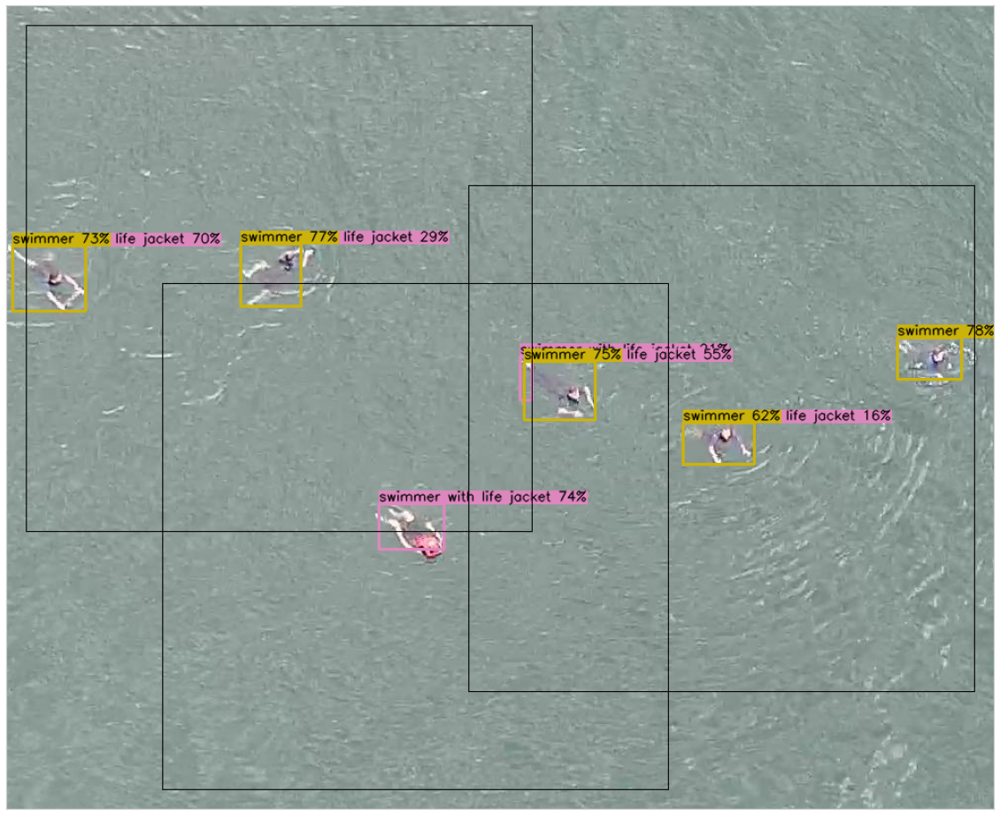

In [369]:
import cv2
import matplotlib.pyplot as plt
import numpy as np


classes = ['swimmer', 'swimmer with life jacket', 'boat', 'life jacket']
colors = [(203, 179, 11), (222, 135, 191), (40, 195, 132), (75, 140, 112)]
show_label = True

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_nms = img.copy()
img_obs = img.copy()

nms_dets = np.array(nms_dets)
nms_dets = nms_dets[nms_dets[:, -2] >= 0.1]
nms_dets = nms_dets[nms_dets[:, -2].argsort()]
for det in nms_dets.tolist():
    xmin,ymin,xmax,ymax,conf,cls = det
    if int(conf*100) == 18:
        print('del')
        continue
    img_nms = plot_one_box(
        list(map(int, [xmin,ymin,xmax,ymax])), 
        img_nms, 
        color=colors[int(cls)], 
        label=f'{classes[int(cls)]} {int(conf*100)}%' if show_label else ''
    ) 
nms_win = [x for i,x in enumerate(nms_win) if i==0 or i==1 or i==2] # or i==3]


for i,det in enumerate(nms_win):
    xmin,ymin,xmax,ymax = map(int, det)
    img_nms = cv2.rectangle(img_nms, (xmin, ymin), (xmax,ymax), (0,0,0), 1)

xmin = min([x[0]-20 for x in nms_win])
ymin = min([x[1]-20 for x in nms_win])
xmax = max([x[2]+20 for x in nms_win])
ymax = max([x[3]+20 for x in nms_win])
img_nms = img_nms[ymin:ymax, xmin:xmax,:]

    
plt.figure(figsize=(20,20))
plt.xticks([]);plt.yticks([])
plt.imshow(img_nms)
plt.savefig('../../plots/nms-vs-obs/SDS-NMS-new.png', bbox_inches='tight', pad_inches=0)

In [ ]:
obs_dets = np.array(obs_dets)
obs_dets = obs_dets[obs_dets[:, -2] >= 0.1]
obs_dets = obs_dets[obs_dets[:, -2].argsort()]
for det in obs_dets.tolist():
    xmin,ymin,xmax,ymax,conf,cls = det
    img_obs = plot_one_box(
        list(map(int, [xmin,ymin,xmax,ymax])), 
        img_obs, 
        color=colors[int(cls)], 
        label=f'{classes[int(cls)]} {int(conf*100)}%' if show_label else ''
    ) 
obs_win = [x for i,x in enumerate(obs_win) if i==0 or i==1 or i==2]# or i==3]


for i,det in enumerate(obs_win):
    # if i!=0 and i!=1 and i!=2:
    #     continue
    xmin,ymin,xmax,ymax = map(int, det)
    img_obs = cv2.rectangle(img_obs, (xmin, ymin), (xmax,ymax), (0,0,0), 1)

xmin = min([x[0]-20 for x in obs_win])
ymin = min([x[1]-20 for x in obs_win])
xmax = max([x[2]+20 for x in obs_win])
ymax = max([x[3]+20 for x in obs_win])
img_obs = img_obs[ymin:ymax, xmin:xmax,:]

    
plt.figure(figsize=(20,20))
plt.xticks([]);plt.yticks([])
plt.imshow(img_obs)
plt.savefig('../../plots/nms-vs-obs/SDS-OBS-new.png', bbox_inches='tight', pad_inches=0)

### Zebra vis

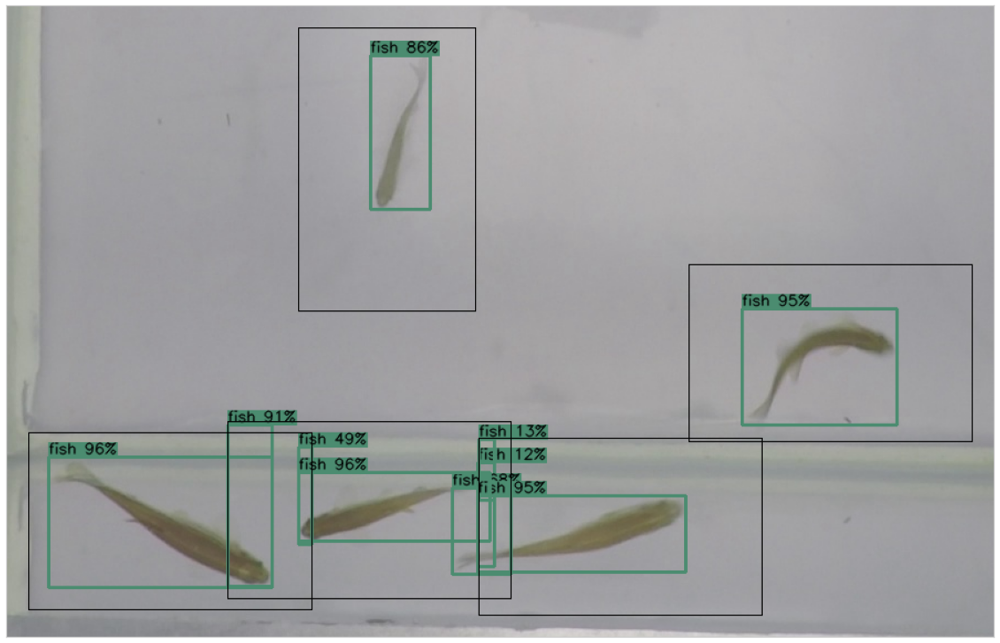

In [26]:
# img_path = 'data/3DZeF20/train/ZebraFish-03/imgT/000686.jpg'
img_path = 'data/3DZeF20/train/ZebraFish-04/imgT/000789.jpg'

classes = ['fish']
colors = [(75, 140, 112)]
show_label = True

# wins = [
#     [1514, 1193, 1770, 1353],
#     [1435, 1111, 1595, 1367]
# ]

# nms_dets = [[1.4995e+03, 1.1657e+03, 1.5769e+03, 1.2846e+03, 9.4336e-01, 0.0000e+00],
#         [1.5331e+03, 1.2492e+03, 1.6901e+03, 1.2833e+03, 9.1863e-01, 0.0000e+00],
#         [1.4974e+03, 1.2968e+03, 1.5463e+03, 1.3661e+03, 8.4597e-01, 0.0000e+00],
#         [1.5140e+03, 1.1950e+03, 1.5568e+03, 1.3527e+03, 7.4120e-01, 0.0000e+00],
#         [1.5139e+03, 1.1928e+03, 1.5647e+03, 1.2932e+03, 5.7003e-01, 0.0000e+00],
#         [1.5330e+03, 1.3095e+03, 1.5948e+03, 1.3419e+03, 5.0821e-01, 0.0000e+00],
#         [1.5317e+03, 1.2480e+03, 1.5953e+03, 1.2839e+03, 4.7999e-01, 0.0000e+00],
#         [1.5337e+03, 1.3122e+03, 1.5949e+03, 1.3592e+03, 2.2997e-01, 0.0000e+00],
#         [1.5311e+03, 1.2509e+03, 1.5949e+03, 1.3210e+03, 3.6527e-02, 0.0000e+00],
#         [1.5344e+03, 1.3096e+03, 1.6903e+03, 1.3364e+03, 1.4462e-02, 0.0000e+00]
#            ]

# obs_dets = [[1.5331e+03, 1.2492e+03, 1.6901e+03, 1.2833e+03, 9.1863e-01, 0.0000e+00],
#         [1.5344e+03, 1.3096e+03, 1.6903e+03, 1.3364e+03, 1.4462e-02, 0.0000e+00],
#         [1.4995e+03, 1.1657e+03, 1.5769e+03, 1.2846e+03, 9.4336e-01, 0.0000e+00],
#         [1.4977e+03, 1.2967e+03, 1.5452e+03, 1.3662e+03, 8.4597e-01, 0.0000e+00]]

wins = [[1234, 1283, 1490, 1443],
 [ 827, 1278, 1083, 1438],
 [1007, 1268, 1263, 1428],
 [1424, 1126, 1680, 1286],
 [1071, 912, 1231, 1168]]
nms_dets = [[8.4533e+02, 1.3004e+03, 1.0478e+03, 1.4182e+03, 9.6791e-01, 0.0000e+00],
        [1.0710e+03, 1.3141e+03, 1.2447e+03, 1.3768e+03, 9.6191e-01, 0.0000e+00],
        [1.4727e+03, 1.1668e+03, 1.6122e+03, 1.2715e+03, 9.5812e-01, 0.0000e+00],
        [1.2336e+03, 1.3359e+03, 1.4217e+03, 1.4041e+03, 9.5148e-01, 0.0000e+00],
        [1.0070e+03, 1.2718e+03, 1.0471e+03, 1.4173e+03, 9.1737e-01, 0.0000e+00],
        [1.1367e+03, 9.3735e+02, 1.1904e+03, 1.0766e+03, 8.6191e-01, 0.0000e+00],
        [1.2100e+03, 1.3284e+03, 1.2630e+03, 1.4062e+03, 6.8019e-01, 0.0000e+00],
        [1.0711e+03, 1.2911e+03, 1.0830e+03, 1.3790e+03, 4.9626e-01, 0.0000e+00],
        [1.2340e+03, 1.2842e+03, 1.2486e+03, 1.3397e+03, 1.3572e-01, 0.0000e+00],
        [1.2339e+03, 1.3054e+03, 1.2486e+03, 1.3995e+03, 1.2694e-01, 0.0000e+00],
        [1.5631e+03, 1.2625e+03, 1.5721e+03, 1.2707e+03, 6.7853e-02, 0.0000e+00],
        [1.0641e+03, 1.3509e+03, 1.0830e+03, 1.4382e+03, 3.7957e-02, 0.0000e+00]]

obs_dets = [[1.2336e+03, 1.3359e+03, 1.4217e+03, 1.4041e+03, 9.5148e-01, 0.0000e+00],
        [8.4533e+02, 1.3004e+03, 1.0478e+03, 1.4182e+03, 9.6791e-01, 0.0000e+00],
        [1.0710e+03, 1.3141e+03, 1.2447e+03, 1.3768e+03, 9.6191e-01, 0.0000e+00],
        [1.4727e+03, 1.1668e+03, 1.6122e+03, 1.2715e+03, 9.5812e-01, 0.0000e+00],
        [1.5631e+03, 1.2625e+03, 1.5721e+03, 1.2707e+03, 6.7853e-02, 0.0000e+00],
        [1.1367e+03, 9.3735e+02, 1.1904e+03, 1.0766e+03, 8.6191e-01, 0.0000e+00]]


img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_nms = img.copy()
img_obs = img.copy()

nms_dets = np.array(nms_dets)
nms_dets = nms_dets[nms_dets[:, -2] >= 0.1]
nms_dets = nms_dets[nms_dets[:, -2].argsort()]
for det in nms_dets.tolist():
    xmin,ymin,xmax,ymax,conf,cls = det
    img_nms = plot_one_box(
        list(map(int, [xmin,ymin,xmax,ymax])), 
        img_nms, 
        color=colors[int(cls)], 
        label=f'{classes[int(cls)]} {int(conf*100)}%' if show_label else ''
    ) 

for i,det in enumerate(wins):
    xmin,ymin,xmax,ymax = map(int, det)
    img_nms = cv2.rectangle(img_nms, (xmin, ymin), (xmax,ymax), (0,0,0), 1)

xmin = min([x[0]-20 for x in wins])
ymin = min([x[1]-20 for x in wins])
xmax = max([x[2]+20 for x in wins])
ymax = max([x[3]+20 for x in wins])
img_nms = img_nms[ymin:ymax, xmin:xmax,:]

    
plt.figure(figsize=(20,20))
plt.xticks([]);plt.yticks([])
plt.imshow(img_nms)
plt.savefig('../../plots/nms-vs-obs/Zebra-NMS-new.png', bbox_inches='tight', pad_inches=0)

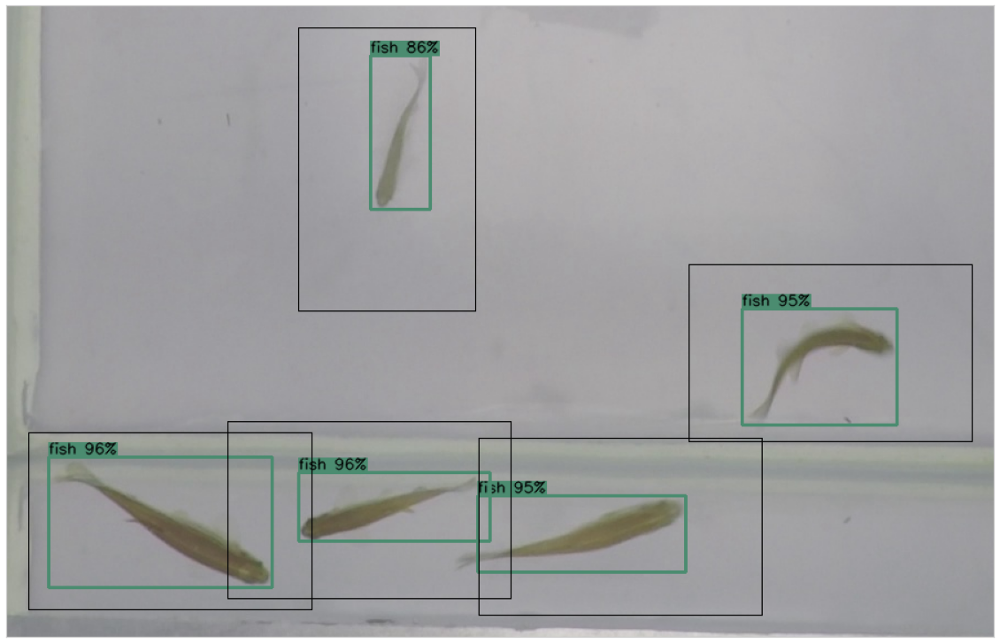

In [27]:
obs_dets = np.array(obs_dets)
obs_dets = obs_dets[obs_dets[:, -2] >= 0.1]
obs_dets = obs_dets[obs_dets[:, -2].argsort()]
for det in obs_dets.tolist():
    xmin,ymin,xmax,ymax,conf,cls = det
    img_obs = plot_one_box(
        list(map(int, [xmin,ymin,xmax,ymax])), 
        img_obs, 
        color=colors[int(cls)], 
        label=f'{classes[int(cls)]} {int(conf*100)}%' if show_label else ''
    ) 


for i,det in enumerate(wins):
    xmin,ymin,xmax,ymax = map(int, det)
    img_obs = cv2.rectangle(img_obs, (xmin, ymin), (xmax,ymax), (0,0,0), 1)

xmin = min([x[0]-20 for x in wins])
ymin = min([x[1]-20 for x in wins])
xmax = max([x[2]+20 for x in wins])
ymax = max([x[3]+20 for x in wins])
img_obs = img_obs[ymin:ymax, xmin:xmax,:]

    
plt.figure(figsize=(20,20))
plt.xticks([]);plt.yticks([])
plt.imshow(img_obs)
plt.savefig('../../plots/nms-vs-obs/Zebra-OBS-new.png', bbox_inches='tight', pad_inches=0)

### DC vis

In [5]:
def isInsidePoint(bbox, point):
    # print(bbox)
    # print(point)
    xmin, ymin, xmax, ymax = bbox
    x, y = point
    if xmin<=x<=xmax and ymin<=y<=ymax:
        return True
    
def isInsideBbox(inner_bbox, outer_bbox):
    xmin,ymin,xmax,ymax = inner_bbox
    p1, p2, p3, p4 = (xmin,ymin), (xmax,ymin), (xmax, ymax), (xmin, ymax)
    return all([isInsidePoint(outer_bbox, point) for point in [p1,p2,p3,p4]])

987 460 1499 972


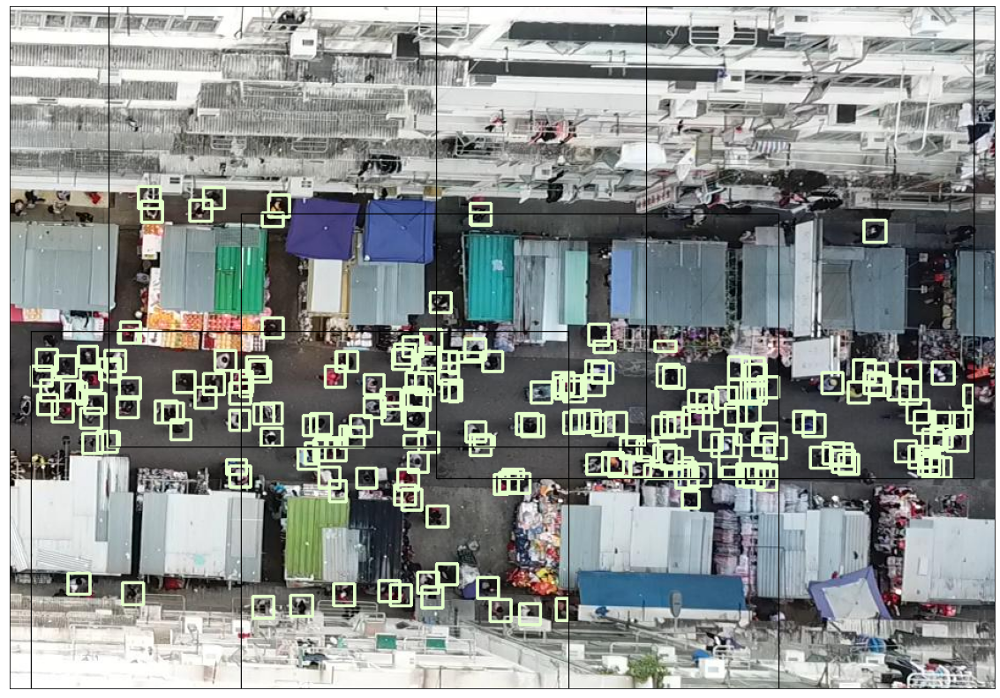

In [40]:
img_path = 'data/DroneCrowd/test_data/images/img111174.jpg'

wins = [[182, 414, 694, 926], [0, 275, 512, 787], [1187, 348, 1699, 860], [747, 85, 1259, 597], [0, 38, 512, 550], [0, 608, 512, 1080], [425, 449, 937, 961], [420, 199, 932, 711], [1373, 88, 1885, 600], [1061, 58, 1573, 570], [1433, 470, 1920, 982], [776, 443, 1288, 955], [987, 460, 1499, 972], [1607, 117, 1920, 629], [533, 797, 1045, 1080], [1635, 777, 1920, 1080], [93, 196, 605, 708], [1386, 480, 1898, 630], [1878, 480, 1920, 630], [540, 438, 1052, 618], [1032, 438, 1440, 618]]

nms_dets = [[1162.475341796875, 478.18719482421875, 1182.0721435546875, 497.74481201171875, 0.7616767883300781, 0.0], [996.7750244140625, 506.68463134765625, 1016.2350463867188, 526.1414184570312, 0.7379308342933655, 0.0], [1401.574951171875, 546.67578125, 1420.638916015625, 565.633544921875, 0.735413670539856, 0.0], [735.0222778320312, 543.9801635742188, 754.5360717773438, 563.4197387695312, 0.7342697978019714, 0.0], [1534.4703369140625, 537.8828125, 1554.7025146484375, 558.0843505859375, 0.7341803312301636, 0.0], [271.53179931640625, 473.635498046875, 292.5215759277344, 494.49261474609375, 0.7293924689292908, 0.0], [426.9144287109375, 535.016357421875, 447.20587158203125, 555.252197265625, 0.7235925793647766, 0.0], [1513.607421875, 501.96246337890625, 1533.6015625, 521.8829956054688, 0.7175322771072388, 0.0], [945.6293334960938, 464.9483947753906, 965.3074951171875, 484.53143310546875, 0.7166405320167542, 0.0], [342.4867858886719, 531.9046630859375, 363.1678771972656, 552.4354248046875, 0.7108825445175171, 0.0], [1176.380126953125, 535.01806640625, 1195.9739990234375, 554.5715942382812, 0.7105855345726013, 0.0], [543.2406616210938, 525.462890625, 564.051025390625, 546.1795654296875, 0.7074288129806519, 0.0], [389.71435546875, 517.9638671875, 410.5105285644531, 538.7235107421875, 0.7067844271659851, 0.0], [1304.755859375, 501.0475769042969, 1323.9423828125, 520.23046875, 0.7043315172195435, 0.0], [205.75347900390625, 479.6468505859375, 227.4552459716797, 501.2489929199219, 0.7038046717643738, 0.0], [295.717529296875, 521.8060913085938, 316.6748352050781, 542.6266479492188, 0.7026833295822144, 0.0], [1685.8321533203125, 561.2891235351562, 1706.562255859375, 581.9514770507812, 0.701981782913208, 0.0], [671.9545288085938, 536.2096557617188, 691.6615600585938, 556.04638671875, 0.6993345618247986, 0.0], [683.635009765625, 518.6928100585938, 703.5473022460938, 538.565673828125, 0.6971975564956665, 0.0], [889.0634155273438, 478.0343017578125, 908.674560546875, 497.6235046386719, 0.6965831518173218, 0.0], [657.684814453125, 550.5924682617188, 677.7733764648438, 570.6129150390625, 0.695111095905304, 0.0], [506.2357482910156, 530.7013549804688, 526.414306640625, 550.8714599609375, 0.6901606321334839, 0.0], [233.15475463867188, 332.80291748046875, 254.88832092285156, 354.4813537597656, 0.6868898868560791, 0.0], [944.6381225585938, 553.0672607421875, 964.046142578125, 572.3533935546875, 0.6857472062110901, 0.0], [120.10948944091797, 466.18890380859375, 141.57110595703125, 487.5025939941406, 0.6853969693183899, 0.0], [915.7919921875, 483.5232238769531, 935.4857177734375, 503.11981201171875, 0.6850106716156006, 0.0], [1346.093017578125, 575.6386108398438, 1365.0614013671875, 594.51171875, 0.6837565302848816, 0.0], [826.1651000976562, 479.02996826171875, 845.6101684570312, 498.3597106933594, 0.6829096674919128, 0.0], [81.05644989013672, 415.0103759765625, 102.37667083740234, 436.1328430175781, 0.6822516918182373, 0.0], [1034.415771484375, 496.5998229980469, 1054.3607177734375, 516.4395751953125, 0.6821883916854858, 0.0], [285.24945068359375, 460.892578125, 306.5328369140625, 482.12750244140625, 0.6773287653923035, 0.0], [581.23193359375, 530.748291015625, 601.045654296875, 550.51904296875, 0.6770807504653931, 0.0], [901.8597412109375, 539.550537109375, 921.8524780273438, 559.4759521484375, 0.6760700345039368, 0.0], [57.86576843261719, 257.99981689453125, 79.9072494506836, 279.9032897949219, 0.6710901260375977, 0.0], [528.4300537109375, 489.5023193359375, 548.5702514648438, 509.5339660644531, 0.6702596545219421, 0.0], [1405.046875, 558.9681396484375, 1425.1832275390625, 578.9913330078125, 0.66863614320755, 0.0], [62.465187072753906, 295.7696228027344, 84.69942474365234, 317.8521728515625, 0.6669656038284302, 0.0], [778.9501953125, 501.18560791015625, 798.5089111328125, 520.7312622070312, 0.6658172011375427, 0.0], [1587.9752197265625, 571.5971069335938, 1607.9322509765625, 591.4201049804688, 0.6648138165473938, 0.0], [857.1866455078125, 520.7921142578125, 877.1551513671875, 540.643310546875, 0.6624813675880432, 0.0], [1613.917724609375, 586.95361328125, 1634.330078125, 607.2577514648438, 0.6613045334815979, 0.0], [432.80999755859375, 489.52923583984375, 453.6351623535156, 510.226806640625, 0.6604815721511841, 0.0], [224.33961486816406, 400.4117431640625, 245.7015838623047, 421.7132263183594, 0.6599867343902588, 0.0], [916.1444702148438, 540.3282470703125, 935.83984375, 559.9853515625, 0.6599617600440979, 0.0], [1092.6295166015625, 336.0045471191406, 1112.8465576171875, 356.179443359375, 0.659919798374176, 0.0], [928.7612915039062, 505.5776672363281, 948.06103515625, 524.8005981445312, 0.6593683362007141, 0.0], [1052.2431640625, 486.0814514160156, 1072.593994140625, 506.42462158203125, 0.6549197435379028, 0.0], [198.9617156982422, 671.4568481445312, 220.6839599609375, 693.0350952148438, 0.6544764637947083, 0.0], [1071.1707763671875, 504.6745300292969, 1091.1173095703125, 524.5172119140625, 0.6541445255279541, 0.0], [1343.97265625, 533.7947387695312, 1364.1708984375, 553.8917846679688, 0.6541153192520142, 0.0], [340.3778381347656, 518.5025024414062, 361.25555419921875, 539.312744140625, 0.6523656249046326, 0.0], [1679.5364990234375, 503.08837890625, 1699.79931640625, 523.2720947265625, 0.651095449924469, 0.0], [1320.1478271484375, 515.2620239257812, 1339.7730712890625, 534.7628784179688, 0.6498321890830994, 0.0], [302.81341552734375, 485.363525390625, 324.19873046875, 506.67022705078125, 0.649361789226532, 0.0], [794.2402954101562, 526.9896240234375, 814.0553588867188, 546.7483520507812, 0.648786187171936, 0.0], [949.3778076171875, 519.0121459960938, 969.1096801757812, 538.6057739257812, 0.6475998163223267, 0.0], [1032.0098876953125, 474.33526611328125, 1050.9632568359375, 493.72735595703125, 0.6467142105102539, 0.0], [837.1923828125, 526.2301025390625, 856.6201782226562, 545.6171875, 0.6463035941123962, 0.0], [1206.606689453125, 552.9000244140625, 1226.0716552734375, 569.880615234375, 0.6457506418228149, 0.0], [487.2691345214844, 518.4677124023438, 508.0340576171875, 539.184814453125, 0.6440513134002686, 0.0], [1038.7532958984375, 519.045654296875, 1058.7657470703125, 538.923828125, 0.6432219743728638, 0.0], [1557.6904296875, 579.0155029296875, 1577.8858642578125, 599.1458129882812, 0.6423643827438354, 0.0], [16.45650291442871, 288.852294921875, 39.004417419433594, 311.304443359375, 0.642230212688446, 0.0], [479.89422607421875, 539.8009643554688, 500.43121337890625, 560.254150390625, 0.6416342258453369, 0.0], [451.7970886230469, 499.1410217285156, 472.280029296875, 519.5684814453125, 0.6411579251289368, 0.0], [192.22093200683594, 603.5950927734375, 213.8020477294922, 625.0283203125, 0.6407018303871155, 0.0], [1112.4287109375, 528.0348510742188, 1132.3154296875, 547.796630859375, 0.6406729817390442, 0.0], [414.3238830566406, 548.71875, 435.257568359375, 569.489013671875, 0.6405174136161804, 0.0], [622.816650390625, 487.0792541503906, 642.251220703125, 506.4056396484375, 0.6391251683235168, 0.0], [972.712646484375, 523.7656860351562, 992.2861328125, 543.35400390625, 0.6385189294815063, 0.0], [1756.1444091796875, 577.5209350585938, 1775.561279296875, 596.888916015625, 0.6368886232376099, 0.0], [992.5377197265625, 477.5914001464844, 1012.198974609375, 497.26568603515625, 0.636715292930603, 0.0], [142.7889404296875, 629.7978515625, 164.07675170898438, 650.9931640625, 0.6364617347717285, 0.0], [1765.217529296875, 508.0533447265625, 1785.7425537109375, 528.4705200195312, 0.6358552575111389, 0.0], [222.653076171875, 537.98681640625, 243.8563232421875, 559.0162353515625, 0.635100781917572, 0.0], [1267.4102783203125, 493.805908203125, 1286.910888671875, 513.2523803710938, 0.6344810724258423, 0.0], [1454.93896484375, 540.5987548828125, 1475.023193359375, 560.5834350585938, 0.6340401768684387, 0.0], [83.23231506347656, 431.66925048828125, 104.95730590820312, 453.1894836425781, 0.6339349150657654, 0.0], [1321.2464599609375, 528.9367065429688, 1340.4420166015625, 548.1158447265625, 0.6336862444877625, 0.0], [1304.9970703125, 523.1646728515625, 1324.383544921875, 542.444091796875, 0.6328027844429016, 0.0], [1010.9801025390625, 483.5645446777344, 1030.867431640625, 503.4732360839844, 0.6320093274116516, 0.0], [121.03192901611328, 440.4166564941406, 142.8716278076172, 462.1182556152344, 0.6315703392028809, 0.0], [456.1028747558594, 532.5108032226562, 476.9903259277344, 553.2725219726562, 0.6310443878173828, 0.0], [1253.259521484375, 538.8810424804688, 1273.108642578125, 558.62158203125, 0.6299300789833069, 0.0], [1417.3050537109375, 479.1012878417969, 1436.223388671875, 498.04461669921875, 0.6297855973243713, 0.0], [1356.2578125, 556.6189575195312, 1375.51708984375, 575.8057861328125, 0.629768967628479, 0.0], [256.1172790527344, 439.46380615234375, 277.1687316894531, 460.4241943359375, 0.6261730790138245, 0.0], [1007.872802734375, 526.8175048828125, 1027.436279296875, 546.337158203125, 0.6257027983665466, 0.0], [1642.5272216796875, 558.964111328125, 1663.10986328125, 579.4498291015625, 0.6251626014709473, 0.0], [215.09176635742188, 684.3665771484375, 236.6001739501953, 705.610595703125, 0.6241002082824707, 0.0], [804.659912109375, 540.772216796875, 824.24462890625, 560.2437744140625, 0.6228651404380798, 0.0], [624.68115234375, 529.230712890625, 644.6085205078125, 549.0494384765625, 0.6227409839630127, 0.0], [431.1402587890625, 571.2894287109375, 452.1838073730469, 592.292236328125, 0.6189798712730408, 0.0], [1178.368408203125, 498.5729064941406, 1198.1407470703125, 518.3551025390625, 0.6187164783477783, 0.0], [996.151611328125, 458.3290100097656, 1015.304443359375, 477.374755859375, 0.618094801902771, 0.0], [987.3480224609375, 493.1398620605469, 1007.1824951171875, 512.8329467773438, 0.6174984574317932, 0.0], [507.1318664550781, 439.7569274902344, 526.7547607421875, 459.2408142089844, 0.6166877150535583, 0.0], [1353.1658935546875, 500.8736572265625, 1372.6551513671875, 520.2156982421875, 0.6128227710723877, 0.0], [1516.9012451171875, 577.100341796875, 1537.0335693359375, 596.966064453125, 0.6124942302703857, 0.0], [855.8692016601562, 537.431640625, 876.110107421875, 557.6231689453125, 0.6117010712623596, 0.0], [1278.3009033203125, 479.1097106933594, 1298.107421875, 498.8950500488281, 0.6101820468902588, 0.0], [1589.5194091796875, 494.15814208984375, 1609.93994140625, 514.4691772460938, 0.609372615814209, 0.0], [1378.0040283203125, 506.9729309082031, 1397.9044189453125, 526.68603515625, 0.6089690923690796, 0.0], [178.782958984375, 317.9250793457031, 200.8880615234375, 339.9971618652344, 0.6084510087966919, 0.0], [1358.7784423828125, 458.10162353515625, 1378.087646484375, 477.31878662109375, 0.6066418886184692, 0.0], [950.4302978515625, 482.5124816894531, 970.3681030273438, 502.436767578125, 0.6056929230690002, 0.0], [782.1866455078125, 486.6595153808594, 801.6134033203125, 505.980712890625, 0.6056387424468994, 0.0], [1564.4139404296875, 564.01025390625, 1584.4874267578125, 583.9536743164062, 0.6041527390480042, 0.0], [670.8803100585938, 430.8755798339844, 690.5087280273438, 450.44732666015625, 0.6034582853317261, 0.0], [1346.9696044921875, 515.55224609375, 1367.216064453125, 535.8074951171875, 0.6033336520195007, 0.0], [24.391460418701172, 277.45159912109375, 47.176658630371094, 300.11090087890625, 0.6026439070701599, 0.0], [1241.6036376953125, 571.44873046875, 1261.732666015625, 591.4722900390625, 0.600579559803009, 0.0], [1740.10546875, 499.9091491699219, 1760.2672119140625, 519.950439453125, 0.5990720987319946, 0.0], [1123.599853515625, 498.57080078125, 1143.795654296875, 518.652099609375, 0.5973130464553833, 0.0], [1748.9041748046875, 567.8877563476562, 1769.706298828125, 588.5133056640625, 0.5970851182937622, 0.0], [188.45550537109375, 361.1912536621094, 210.22769165039062, 382.8744812011719, 0.596932590007782, 0.0], [1375.03125, 490.8368225097656, 1394.3421630859375, 510.46807861328125, 0.5967772006988525, 0.0], [1621.4342041015625, 517.133056640625, 1641.9979248046875, 537.6921997070312, 0.5956645607948303, 0.0], [68.09458923339844, 688.3582153320312, 89.71292114257812, 709.8246459960938, 0.5940848588943481, 0.0], [661.3135986328125, 504.61602783203125, 681.42041015625, 524.6675415039062, 0.5940437316894531, 0.0], [414.8232421875, 690.5699462890625, 434.80316162109375, 707.8895263671875, 0.5932343006134033, 0.0], [821.0352783203125, 511.9972229003906, 840.632568359375, 531.520751953125, 0.5931752324104309, 0.0], [625.7169189453125, 699.514404296875, 646.7489013671875, 720.4916381835938, 0.5928624272346497, 0.0], [947.1058349609375, 501.053955078125, 966.8391723632812, 520.7149047851562, 0.5925825238227844, 0.0], [1614.66845703125, 530.986083984375, 1635.02978515625, 551.3336181640625, 0.5912572145462036, 0.0], [1143.655517578125, 513.4200439453125, 1163.97314453125, 533.6212768554688, 0.5905950665473938, 0.0], [1069.412353515625, 522.2550048828125, 1089.3922119140625, 542.1277465820312, 0.5899111032485962, 0.0], [820.41943359375, 529.4810791015625, 839.7760009765625, 548.7720947265625, 0.5890087485313416, 0.0], [1017.2172241210938, 507.0506591796875, 1036.494140625, 526.347412109375, 0.5866298079490662, 0.0], [82.63331604003906, 586.680908203125, 104.28858947753906, 608.2315673828125, 0.5858849287033081, 0.0], [1151.2689208984375, 500.7712097167969, 1171.5313720703125, 520.945068359375, 0.5847510099411011, 0.0], [698.4432373046875, 540.9955444335938, 719.1480712890625, 561.6245727539062, 0.5841250419616699, 0.0], [118.0614013671875, 275.53240966796875, 139.93226623535156, 295.3009948730469, 0.5765017867088318, 0.0], [194.60540771484375, 442.5630187988281, 216.07615661621094, 463.9246826171875, 0.5757420063018799, 0.0], [888.5159301757812, 499.6796875, 908.3103637695312, 519.4448852539062, 0.5747658014297485, 0.0], [491.14373779296875, 486.1299743652344, 511.21856689453125, 506.1565246582031, 0.5741873383522034, 0.0], [1267.3026123046875, 563.91455078125, 1287.3388671875, 583.8374633789062, 0.5717299580574036, 0.0], [77.04389190673828, 475.7243347167969, 99.05113983154297, 497.6091003417969, 0.5683315992355347, 0.0], [325.32611083984375, 534.240478515625, 346.33624267578125, 555.2244873046875, 0.5674922466278076, 0.0], [322.4822692871094, 483.01763916015625, 343.5545959472656, 503.95458984375, 0.5659826993942261, 0.0], [197.6846923828125, 345.65875244140625, 219.40403747558594, 367.294189453125, 0.5651587247848511, 0.0], [670.7178955078125, 696.22802734375, 690.9700927734375, 716.696044921875, 0.56467604637146, 0.0], [1509.818359375, 535.5737915039062, 1529.7783203125, 555.4522094726562, 0.5639562010765076, 0.0], [1256.4696044921875, 563.9676513671875, 1276.4295654296875, 583.7688598632812, 0.5634464025497437, 0.0], [658.4911499023438, 451.3106689453125, 678.2877197265625, 471.0296936035156, 0.562403678894043, 0.0], [1138.9102783203125, 335.8013916015625, 1159.0289306640625, 355.8551940917969, 0.5612636804580688, 0.0], [637.6112670898438, 499.476806640625, 657.615234375, 519.3453979492188, 0.5594591498374939, 0.0], [232.80455017089844, 601.4093017578125, 254.09091186523438, 622.589111328125, 0.558957040309906, 0.0], [1677.140380859375, 547.2086181640625, 1698.2525634765625, 568.2129516601562, 0.5580406188964844, 0.0], [794.271484375, 707.0369873046875, 814.6995849609375, 727.4000244140625, 0.5567619204521179, 0.0], [1859.6029052734375, 554.4451293945312, 1879.9061279296875, 574.775390625, 0.556652307510376, 0.0], [844.7952880859375, 504.5832824707031, 864.9632568359375, 524.6279296875, 0.5559682250022888, 0.0], [1356.1622314453125, 481.41009521484375, 1375.27001953125, 500.49420166015625, 0.5543762445449829, 0.0], [1291.9444580078125, 540.1425170898438, 1311.9002685546875, 560.0577392578125, 0.5540861487388611, 0.0], [92.48634338378906, 430.9908447265625, 108.33821105957031, 452.71746826171875, 0.5515882968902588, 0.0], [1452.64111328125, 719.663818359375, 1472.931640625, 739.7562255859375, 0.5514483451843262, 0.0], [1522.221923828125, 539.542236328125, 1542.4659423828125, 559.85400390625, 0.5468845963478088, 0.0], [92.65681457519531, 414.8166809082031, 104.53926086425781, 436.4276123046875, 0.5447430610656738, 0.0], [145.19595336914062, 464.5052795410156, 166.87159729003906, 486.00140380859375, 0.5433526635169983, 0.0], [189.0616455078125, 392.8639831542969, 210.67489624023438, 414.369384765625, 0.5430081486701965, 0.0], [260.080322265625, 428.1230163574219, 281.5702209472656, 449.5932312011719, 0.5377959609031677, 0.0], [1034.56298828125, 533.2642211914062, 1054.2386474609375, 552.9492797851562, 0.5377328395843506, 0.0], [1424.25830078125, 715.9701538085938, 1444.5643310546875, 736.1801147460938, 0.5374085903167725, 0.0], [596.2817993164062, 494.35235595703125, 616.0126342773438, 514.027587890625, 0.5373822450637817, 0.0], [1833.333740234375, 569.7553100585938, 1852.741455078125, 589.1077880859375, 0.5365474820137024, 0.0], [334.0073547363281, 495.69525146484375, 354.9247131347656, 516.4825439453125, 0.5307146906852722, 0.0], [1206.12548828125, 528.2723388671875, 1226.1337890625, 548.1748046875, 0.5254393219947815, 0.0], [1336.9163818359375, 591.4126586914062, 1356.84765625, 611.2701416015625, 0.5215539336204529, 0.0], [1648.22900390625, 529.153564453125, 1668.26953125, 549.2286376953125, 0.5206232070922852, 0.0], [1843.248046875, 580.4630126953125, 1863.84814453125, 599.408447265625, 0.5204200148582458, 0.0], [1355.24560546875, 689.183349609375, 1375.247802734375, 709.1915283203125, 0.5174968242645264, 0.0], [72.47361755371094, 317.3465881347656, 95.0499267578125, 339.9139099121094, 0.5159444808959961, 0.0], [1192.9444580078125, 484.0991516113281, 1212.703857421875, 503.7826232910156, 0.5151872634887695, 0.0], [804.3717041015625, 503.9002990722656, 824.4696655273438, 523.9072875976562, 0.5143057703971863, 0.0], [297.34478759765625, 674.863037109375, 318.6080322265625, 695.968017578125, 0.5142989754676819, 0.0], [615.6288452148438, 511.78009033203125, 635.1815795898438, 531.227783203125, 0.5141459703445435, 0.0], [1120.051513671875, 544.3096313476562, 1139.4061279296875, 563.53076171875, 0.513507604598999, 0.0], [1660.279296875, 529.715087890625, 1681.1549072265625, 550.5072021484375, 0.5123944878578186, 0.0], [1072.260498046875, 451.92095947265625, 1091.723876953125, 471.3189697265625, 0.5116543173789978, 0.0], [1810.080810546875, 564.3917846679688, 1830.3778076171875, 584.7152099609375, 0.5105454325675964, 0.0], [60.995849609375, 338.9887390136719, 82.73035430908203, 360.558837890625, 0.5098841786384583, 0.0], [1050.0869140625, 555.8829345703125, 1069.848388671875, 575.475830078125, 0.5092788934707642, 0.0], [322.5502624511719, 545.8666381835938, 343.6288146972656, 566.8165283203125, 0.5088204741477966, 0.0], [135.2356719970703, 525.5924072265625, 156.8563232421875, 546.9013671875, 0.5082329511642456, 0.0], [1821.3245849609375, 525.931884765625, 1842.564208984375, 547.068115234375, 0.5023756623268127, 0.0], [1862.15966796875, 537.738525390625, 1882.0994873046875, 557.732177734375, 0.5022304654121399, 0.0], [1780.5679931640625, 354.432373046875, 1801.853759765625, 375.62359619140625, 0.4990854859352112, 0.0], [1246.052001953125, 540.4324951171875, 1259.1253662109375, 559.8445434570312, 0.4965738356113434, 0.0], [1659.2550048828125, 548.1519775390625, 1679.7666015625, 568.669189453125, 0.49640798568725586, 0.0], [172.79251098632812, 379.912353515625, 194.45147705078125, 401.4619140625, 0.4939543902873993, 0.0], [1781.4912109375, 490.52001953125, 1802.12841796875, 511.08685302734375, 0.4915746748447418, 0.0], [793.1830444335938, 506.1930847167969, 813.6322021484375, 526.5181884765625, 0.49048155546188354, 0.0], [588.9972534179688, 511.0711364746094, 609.0669555664062, 531.07177734375, 0.48987868428230286, 0.0], [857.1619262695312, 489.3267517089844, 877.0572509765625, 509.1420593261719, 0.48927563428878784, 0.0], [72.8775634765625, 572.0423583984375, 94.26316833496094, 593.274169921875, 0.4890969395637512, 0.0], [1814.36474609375, 509.8114013671875, 1834.1572265625, 529.508056640625, 0.4874017834663391, 0.0], [1057.97119140625, 478.6583557128906, 1077.9476318359375, 498.6051330566406, 0.4870237410068512, 0.0], [888.8389892578125, 560.8763427734375, 907.9293212890625, 579.7008056640625, 0.48454606533050537, 0.0], [762.5653076171875, 540.6219482421875, 782.4370727539062, 560.4049072265625, 0.4807460904121399, 0.0], [358.99114990234375, 492.99725341796875, 379.7183532714844, 513.5740966796875, 0.48024123907089233, 0.0], [1207.7955322265625, 447.221435546875, 1227.1585693359375, 466.5724182128906, 0.47878795862197876, 0.0], [1785.79296875, 502.30487060546875, 1805.47509765625, 521.9735107421875, 0.47826677560806274, 0.0], [337.618896484375, 693.2010498046875, 358.5193176269531, 714.010498046875, 0.47505834698677063, 0.0], [252.6608123779297, 578.766357421875, 274.28466796875, 600.3035888671875, 0.47483187913894653, 0.0], [233.50852966308594, 560.1773071289062, 255.17446899414062, 581.6588134765625, 0.47420066595077515, 0.0], [1367.7523193359375, 423.2042541503906, 1387.4197998046875, 442.7830810546875, 0.4734255373477936, 0.0], [607.1863403320312, 502.2846984863281, 627.1837158203125, 522.23095703125, 0.4715455174446106, 0.0], [1583.53125, 491.5298156738281, 1604.2274169921875, 512.2208251953125, 0.4661518633365631, 0.0], [1285.0050048828125, 551.3009033203125, 1304.65771484375, 570.8262939453125, 0.4630935490131378, 0.0], [1674.6043701171875, 557.7928466796875, 1695.477294921875, 578.6907958984375, 0.46256566047668457, 0.0], [1186.8646240234375, 503.54229736328125, 1197.8612060546875, 522.9437255859375, 0.4600251317024231, 0.0], [1593.3314208984375, 539.8031005859375, 1614.26220703125, 560.6346435546875, 0.4590648114681244, 0.0], [88.39341735839844, 692.6810302734375, 110.47689056396484, 714.766357421875, 0.4579465389251709, 0.0], [-0.24927368760108948, 514.0385131835938, 12.883810997009277, 535.5994873046875, 0.45787087082862854, 0.0], [827.4649658203125, 496.9001770019531, 847.5701904296875, 516.9827880859375, 0.4570670425891876, 0.0], [1667.7454833984375, 510.00201416015625, 1687.741943359375, 529.9722900390625, 0.45624569058418274, 0.0], [275.02655029296875, 445.9465637207031, 296.1295166015625, 466.9610595703125, 0.44984036684036255, 0.0], [1449.642822265625, 538.007568359375, 1470.0965576171875, 558.379638671875, 0.44893965125083923, 0.0], [1176.3804931640625, 509.4635009765625, 1196.43505859375, 529.4541015625, 0.4446883499622345, 0.0], [1773.3919677734375, 588.8358154296875, 1793.556884765625, 609.0360107421875, 0.4443533420562744, 0.0], [627.18701171875, 698.618896484375, 647.2313842773438, 711.34912109375, 0.442853718996048, 0.0], [868.1649169921875, 483.5527038574219, 887.6134033203125, 502.926513671875, 0.4425486922264099, 0.0], [1722.4937744140625, 539.925537109375, 1743.398193359375, 560.7991333007812, 0.44039592146873474, 0.0], [92.93378448486328, 624.311279296875, 112.8511962890625, 646.2595825195312, 0.4387580454349518, 0.0], [595.2191162109375, 455.3338317871094, 615.2335815429688, 475.25341796875, 0.43772730231285095, 0.0], [82.70832824707031, 626.33056640625, 104.31761169433594, 647.8619995117188, 0.43673378229141235, 0.0], [1639.11279296875, 513.162841796875, 1659.2586669921875, 533.2032470703125, 0.430665522813797, 0.0], [946.708984375, 536.3594970703125, 966.0834350585938, 555.6810302734375, 0.4299241602420807, 0.0], [855.096923828125, 751.817138671875, 876.0760498046875, 772.7393188476562, 0.4295940697193146, 0.0], [856.2776489257812, 730.1092529296875, 877.5003662109375, 751.33935546875, 0.4278894364833832, 0.0], [507.3074035644531, 482.61761474609375, 527.63330078125, 502.8468322753906, 0.4267847537994385, 0.0], [1186.782470703125, 535.1944580078125, 1195.9625244140625, 554.226806640625, 0.4247010350227356, 0.0], [1234.7728271484375, 711.41748046875, 1255.16650390625, 731.7470092773438, 0.42088720202445984, 0.0], [1770.753173828125, 487.58953857421875, 1791.357666015625, 508.0905456542969, 0.4208730161190033, 0.0], [1331.090087890625, 477.3249816894531, 1350.803955078125, 496.982421875, 0.41988542675971985, 0.0], [639.4954223632812, 563.5147705078125, 659.6973876953125, 583.62060546875, 0.4173610508441925, 0.0], [965.708251953125, 330.5256652832031, 986.1912841796875, 350.9230651855469, 0.41430240869522095, 0.0], [33.49054718017578, 377.73114013671875, 55.88672637939453, 400.0085754394531, 0.41281673312187195, 0.0], [1803.7496337890625, 505.27069091796875, 1824.3720703125, 525.897216796875, 0.41087621450424194, 0.0], [1364.4298095703125, 626.3482666015625, 1384.3609619140625, 646.2615356445312, 0.4078584909439087, 0.0], [1442.6357421875, 595.0738525390625, 1462.4332275390625, 614.7276611328125, 0.40669184923171997, 0.0], [349.47003173828125, 502.19537353515625, 370.46429443359375, 523.1316528320312, 0.40217626094818115, 0.0], [376.21612548828125, 513.588623046875, 396.58416748046875, 533.9285888671875, 0.40162208676338196, 0.0], [812.875732421875, 471.5060729980469, 832.7200927734375, 491.23138427734375, 0.39830538630485535, 0.0], [1151.267578125, 323.3316955566406, 1171.790283203125, 343.7420349121094, 0.3945562243461609, 0.0], [1651.066650390625, 484.8415222167969, 1671.5728759765625, 505.3528747558594, 0.3944474160671234, 0.0], [1579.792724609375, 541.3562622070312, 1600.0626220703125, 561.6348876953125, 0.39438682794570923, 0.0], [1587.1011962890625, 537.5333251953125, 1607.61279296875, 558.0261840820312, 0.3941919803619385, 0.0], [269.36700439453125, 684.7584838867188, 291.0958557128906, 706.392333984375, 0.39271795749664307, 0.0], [1548.824462890625, 561.5721435546875, 1568.84130859375, 581.6024169921875, 0.3900095522403717, 0.0], [308.65838623046875, 500.006591796875, 330.0052795410156, 521.2940063476562, 0.3890014588832855, 0.0], [539.7542114257812, 490.51092529296875, 549.21630859375, 509.8524169921875, 0.3889566659927368, 0.0], [1531.495849609375, 575.5938720703125, 1551.78076171875, 595.8598022460938, 0.38636618852615356, 0.0], [1845.2152099609375, 489.1163635253906, 1866.330810546875, 510.0960693359375, 0.38626235723495483, 0.0], [1836.45556640625, 579.720703125, 1856.56640625, 599.8065185546875, 0.3852187991142273, 0.0], [250.3479766845703, 409.77947998046875, 271.97308349609375, 431.22991943359375, 0.384901225566864, 0.0], [1824.758056640625, 612.8685302734375, 1844.333984375, 627.9603881835938, 0.3842373788356781, 0.0], [501.41827392578125, 564.5743408203125, 512.046630859375, 585.0957641601562, 0.38367050886154175, 0.0], [1823.7535400390625, 569.8491821289062, 1844.116455078125, 590.21728515625, 0.38236838579177856, 0.0], [1060.47314453125, 556.4627685546875, 1071.36962890625, 570.39306640625, 0.37988436222076416, 0.0], [672.0697021484375, 632.6890258789062, 692.0828247070312, 652.6976318359375, 0.37155818939208984, 0.0], [1875.45166015625, 532.1260375976562, 1894.9112548828125, 551.6715087890625, 0.370358943939209, 0.0], [22.61711883544922, 381.82794189453125, 44.55341339111328, 403.6337890625, 0.3692208230495453, 0.0], [853.8148803710938, 702.7230224609375, 874.196533203125, 723.092041015625, 0.365141898393631, 0.0], [717.6192626953125, 699.5457763671875, 738.498779296875, 720.369873046875, 0.36441323161125183, 0.0], [651.5031127929688, 489.57122802734375, 671.349609375, 509.29595947265625, 0.36002659797668457, 0.0], [181.8147430419922, 616.3896484375, 197.16781616210938, 637.187255859375, 0.35926198959350586, 0.0], [1031.356689453125, 342.5617980957031, 1051.1981201171875, 362.2812194824219, 0.3588874638080597, 0.0], [1248.057861328125, 566.8703002929688, 1259.215087890625, 586.4459838867188, 0.3585241138935089, 0.0], [1713.279296875, 536.47314453125, 1733.2347412109375, 556.4019775390625, 0.35761988162994385, 0.0], [1405.40380859375, 338.2427062988281, 1425.4769287109375, 358.23681640625, 0.3541216254234314, 0.0], [683.9342041015625, 517.0819091796875, 693.9998779296875, 536.9688110351562, 0.3533165156841278, 0.0], [1836.7730712890625, 553.2786865234375, 1856.93603515625, 573.45703125, 0.3532325327396393, 0.0], [930.0333251953125, 528.8090209960938, 949.9816284179688, 548.7149047851562, 0.35047999024391174, 0.0], [870.4762573242188, 499.1298828125, 890.5283203125, 519.17626953125, 0.3481217920780182, 0.0], [739.2166748046875, 489.61883544921875, 759.2470703125, 509.62799072265625, 0.3462229073047638, 0.0], [1374.9434814453125, 479.7396240234375, 1393.918212890625, 498.60638427734375, 0.34411105513572693, 0.0], [965.783203125, 532.6370849609375, 985.677978515625, 552.385009765625, 0.34275051951408386, 0.0], [240.73074340820312, 539.53515625, 262.1734619140625, 560.872314453125, 0.3424081802368164, 0.0], [1635.3372802734375, 558.375, 1656.2119140625, 579.2388305664062, 0.3399467170238495, 0.0], [1667.0989990234375, 491.9664611816406, 1687.5965576171875, 512.6025390625, 0.33902981877326965, 0.0], [258.2388916015625, 692.519775390625, 279.54156494140625, 708.147216796875, 0.33750200271606445, 0.0], [1340.21142578125, 610.7642822265625, 1359.8896484375, 630.4510498046875, 0.33699145913124084, 0.0], [1741.140869140625, 566.1888427734375, 1761.5037841796875, 586.5442504882812, 0.3353770077228546, 0.0], [251.68202209472656, 660.9892578125, 272.6905517578125, 681.9124755859375, 0.3329877257347107, 0.0], [1195.80126953125, 488.9918212890625, 1215.4202880859375, 508.6264343261719, 0.33146241307258606, 0.0], [501.9862976074219, 565.0232543945312, 521.8492431640625, 584.8277587890625, 0.3303740322589874, 0.0], [1677.819091796875, 587.637451171875, 1697.97900390625, 600.36083984375, 0.32789885997772217, 0.0], [98.1377182006836, 567.1415405273438, 120.15180969238281, 589.0506591796875, 0.32736995816230774, 0.0], [631.23291015625, 520.83740234375, 651.3789672851562, 540.8995361328125, 0.32586750388145447, 0.0], [714.763427734375, 708.6732177734375, 735.9254150390625, 729.8346557617188, 0.32483941316604614, 0.0], [918.3614501953125, 559.0892333984375, 938.3544311523438, 579.052734375, 0.32453981041908264, 0.0], [286.5041809082031, 678.5055541992188, 307.7371826171875, 699.6524658203125, 0.32204169034957886, 0.0], [562.64501953125, 547.843017578125, 582.6201782226562, 567.7509765625, 0.32053762674331665, 0.0], [1850.250732421875, 612.0330200195312, 1869.8675537109375, 628.1983642578125, 0.32023248076438904, 0.0], [1613.5362548828125, 516.5679931640625, 1633.7200927734375, 536.8014526367188, 0.319957971572876, 0.0], [322.669921875, 503.09979248046875, 343.8794860839844, 524.18603515625, 0.3192196488380432, 0.0], [1406.288330078125, 347.67303466796875, 1425.5235595703125, 359.5677490234375, 0.3191334009170532, 0.0], [1729.1082763671875, 570.5814208984375, 1749.3533935546875, 590.89404296875, 0.31794655323028564, 0.0], [1600.04296875, 584.6145629882812, 1620.33447265625, 600.2108764648438, 0.3158341348171234, 0.0], [1277.7867431640625, 479.4177551269531, 1288.04736328125, 498.9231262207031, 0.3156653940677643, 0.0], [1089.8951416015625, 322.9732666015625, 1110.194580078125, 343.2506103515625, 0.31157755851745605, 0.0], [1515.205810546875, 488.4263000488281, 1535.375732421875, 508.6529846191406, 0.3101608455181122, 0.0], [993.8012084960938, 520.2589111328125, 1012.7681884765625, 539.070068359375, 0.3097160756587982, 0.0], [758.848388671875, 496.4486083984375, 778.6329345703125, 516.118896484375, 0.30925223231315613, 0.0], [1271.7772216796875, 602.5352172851562, 1287.85888671875, 622.5093994140625, 0.3092265725135803, 0.0], [79.6175765991211, 382.2989807128906, 102.0177993774414, 404.5550842285156, 0.30896514654159546, 0.0], [151.77137756347656, 521.367431640625, 174.13427734375, 543.5953369140625, 0.30749937891960144, 0.0], [786.741943359375, 502.6220703125, 806.43603515625, 522.1854858398438, 0.3023194372653961, 0.0], [596.1588134765625, 494.3585510253906, 605.0145874023438, 514.7755126953125, 0.30088549852371216, 0.0], [102.88609313964844, 390.13800048828125, 124.95954132080078, 412.0596923828125, 0.29647526144981384, 0.0], [1491.719482421875, 502.4031677246094, 1511.974853515625, 522.694091796875, 0.29576408863067627, 0.0], [1105.836181640625, 526.8757934570312, 1126.0548095703125, 547.0234375, 0.2953657805919647, 0.0], [201.6199493408203, 440.9140930175781, 223.28509521484375, 462.4173889160156, 0.29359593987464905, 0.0], [1484.754150390625, 499.315185546875, 1504.8621826171875, 519.369873046875, 0.2932412326335907, 0.0], [142.625, 522.6455078125, 164.89678955078125, 544.7640380859375, 0.2904033064842224, 0.0], [240.36468505859375, 539.2440185546875, 261.5481262207031, 550.0840454101562, 0.28653109073638916, 0.0], [746.7559204101562, 544.610595703125, 755.5714721679688, 564.0884399414062, 0.2863267958164215, 0.0], [92.69874572753906, 586.7360229492188, 106.04680633544922, 608.683837890625, 0.2863059341907501, 0.0], [492.70458984375, 477.3814697265625, 511.8266906738281, 497.36773681640625, 0.28570082783699036, 0.0], [1297.36474609375, 590.919921875, 1316.372802734375, 609.834716796875, 0.28451454639434814, 0.0], [1845.6083984375, 537.6270141601562, 1866.22314453125, 558.1190185546875, 0.28325900435447693, 0.0], [1608.15869140625, 532.5475463867188, 1627.2623291015625, 552.624755859375, 0.2807588279247284, 0.0], [1357.4195556640625, 475.5919494628906, 1377.205078125, 495.401123046875, 0.27700313925743103, 0.0], [650.4771728515625, 514.05859375, 670.8655395507812, 534.4163818359375, 0.2740570306777954, 0.0], [911.4633178710938, 683.7323608398438, 931.898681640625, 704.199462890625, 0.27337926626205444, 0.0], [728.4075927734375, 474.3578186035156, 748.1870727539062, 494.0270080566406, 0.2702333629131317, 0.0], [1665.021484375, 588.4501342773438, 1685.388671875, 608.7830200195312, 0.2681500315666199, 0.0], [71.65542602539062, 381.6688537597656, 93.90067291259766, 403.755859375, 0.268100768327713, 0.0], [815.3294067382812, 491.0008544921875, 835.5031127929688, 511.19940185546875, 0.26762524247169495, 0.0], [1074.138427734375, 699.6220703125, 1094.796630859375, 720.292236328125, 0.26615792512893677, 0.0], [1537.99560546875, 578.38916015625, 1558.4835205078125, 598.6168823242188, 0.26553866267204285, 0.0], [852.1458740234375, 557.0355834960938, 871.2337036132812, 575.9717407226562, 0.26467007398605347, 0.0], [1777.49365234375, 588.865478515625, 1797.835693359375, 600.0919189453125, 0.26383790373802185, 0.0], [1060.764892578125, 488.9806823730469, 1070.4656982421875, 508.6036071777344, 0.2567501962184906, 0.0], [221.60015869140625, 539.3089599609375, 242.5943145751953, 550.1192626953125, 0.25595173239707947, 0.0], [163.9552001953125, 377.75897216796875, 185.5923309326172, 399.39031982421875, 0.2551526725292206, 0.0], [250.53424072265625, 340.846435546875, 272.1526184082031, 362.4736022949219, 0.2520238757133484, 0.0], [1501.0084228515625, 535.74755859375, 1521.4842529296875, 556.1522216796875, 0.2500155568122864, 0.0], [637.5202026367188, 530.342041015625, 658.0848388671875, 550.80908203125, 0.2489265650510788, 0.0], [1269.1085205078125, 561.3624267578125, 1288.8021240234375, 570.1882934570312, 0.24867655336856842, 0.0], [925.820068359375, 560.029541015625, 945.5398559570312, 579.5361328125, 0.2480914443731308, 0.0], [1624.8731689453125, 553.4183349609375, 1645.146728515625, 573.6104125976562, 0.2454291731119156, 0.0], [1664.9923095703125, 485.0820007324219, 1685.519287109375, 505.5570983886719, 0.24378617107868195, 0.0], [1607.3604736328125, 612.68310546875, 1623.9608154296875, 628.0303955078125, 0.24358558654785156, 0.0], [878.5935668945312, 511.22796630859375, 897.96728515625, 530.5474243164062, 0.24130608141422272, 0.0], [1213.3642578125, 330.91302490234375, 1233.8450927734375, 351.36346435546875, 0.23965606093406677, 0.0], [862.399658203125, 715.0853271484375, 883.5787353515625, 736.20556640625, 0.23525768518447876, 0.0], [424.7780456542969, 547.945068359375, 435.2203674316406, 568.4063720703125, 0.23414558172225952, 0.0], [1207.21630859375, 347.860107421875, 1227.263671875, 360.90032958984375, 0.23084616661071777, 0.0], [565.3182373046875, 444.26739501953125, 584.9613647460938, 463.7908020019531, 0.22890233993530273, 0.0], [1436.524169921875, 591.4710083007812, 1456.5960693359375, 600.114501953125, 0.22843384742736816, 0.0], [923.6759033203125, 521.1461181640625, 932.1222534179688, 541.3988037109375, 0.22425705194473267, 0.0], [1807.1177978515625, 604.4784545898438, 1826.4195556640625, 623.6469116210938, 0.22231876850128174, 0.0], [816.2052612304688, 456.9368896484375, 835.2645874023438, 476.0640869140625, 0.2211240530014038, 0.0], [1580.6075439453125, 568.832275390625, 1601.0328369140625, 589.2457885742188, 0.21948210895061493, 0.0], [224.28594970703125, 413.96636962890625, 245.32127380371094, 424.8504638671875, 0.21883228421211243, 0.0], [265.2006530761719, 399.4563293457031, 286.10723876953125, 420.3083190917969, 0.2186836302280426, 0.0], [478.4960632324219, 538.1387939453125, 498.7767028808594, 550.1624755859375, 0.2164008617401123, 0.0], [92.6026611328125, 386.55322265625, 105.142578125, 408.2439270019531, 0.21445675194263458, 0.0], [1428.845458984375, 596.9100341796875, 1441.1500244140625, 615.2965698242188, 0.21416866779327393, 0.0], [162.68113708496094, 625.6539306640625, 184.36798095703125, 647.2471923828125, 0.21118661761283875, 0.0], [1385.7989501953125, 480.79290771484375, 1394.95703125, 500.08038330078125, 0.21116794645786285, 0.0], [1022.7584228515625, 690.0195922851562, 1043.650390625, 710.748046875, 0.2110661268234253, 0.0], [1875.49658203125, 511.0269470214844, 1884.976318359375, 531.3129272460938, 0.21007698774337769, 0.0], [1651.53662109375, 506.1481628417969, 1671.4415283203125, 526.00830078125, 0.2080843597650528, 0.0], [1036.423828125, 557.5731811523438, 1055.76953125, 576.7688598632812, 0.20808064937591553, 0.0], [1814.559814453125, 489.1309814453125, 1834.3046875, 508.78106689453125, 0.20578397810459137, 0.0], [1663.815185546875, 506.17681884765625, 1683.8504638671875, 526.0968017578125, 0.20535442233085632, 0.0], [90.09546661376953, 699.0238037109375, 112.1419906616211, 721.0770263671875, 0.20528647303581238, 0.0], [563.6763305664062, 696.9932250976562, 583.3679809570312, 711.0204467773438, 0.20174634456634521, 0.0], [46.572662353515625, 378.31036376953125, 68.30291748046875, 399.9129333496094, 0.2011703997850418, 0.0], [1344.864990234375, 499.5414733886719, 1363.85986328125, 518.4882202148438, 0.19975042343139648, 0.0], [1678.296142578125, 590.8085327148438, 1697.905029296875, 611.4747314453125, 0.19890852272510529, 0.0], [925.326904296875, 519.10107421875, 937.067138671875, 539.4271240234375, 0.19759821891784668, 0.0], [92.83728790283203, 474.4442443847656, 103.54470825195312, 496.8666076660156, 0.1968604177236557, 0.0], [662.81396484375, 309.2390441894531, 683.1837768554688, 329.48779296875, 0.1965217888355255, 0.0], [1070.38671875, 459.9642639160156, 1089.8623046875, 471.46527099609375, 0.1950819492340088, 0.0], [263.3299865722656, 688.14111328125, 285.2110595703125, 707.8824462890625, 0.1948082447052002, 0.0], [1486.9398193359375, 504.303466796875, 1499.0328369140625, 524.0032958984375, 0.19436244666576385, 0.0], [1199.5694580078125, 529.1685791015625, 1218.993408203125, 548.5507202148438, 0.19411534070968628, 0.0], [1494.913330078125, 507.6755676269531, 1515.094482421875, 527.9047241210938, 0.1936342567205429, 0.0], [93.0539779663086, 689.813232421875, 110.19692993164062, 708.2874755859375, 0.18815168738365173, 0.0], [1877.308837890625, 532.4700927734375, 1884.995361328125, 553.22802734375, 0.18693441152572632, 0.0], [1463.4737548828125, 508.897705078125, 1483.2681884765625, 528.5278930664062, 0.18482092022895813, 0.0], [1571.66357421875, 587.2557373046875, 1591.6728515625, 600.0789794921875, 0.18468663096427917, 0.0], [1433.7752685546875, 594.027587890625, 1451.6754150390625, 613.5950317382812, 0.18422353267669678, 0.0], [256.75347900390625, 348.8116455078125, 278.1513977050781, 370.20379638671875, 0.18307402729988098, 0.0], [330.455322265625, 548.2802734375, 351.906005859375, 569.5656127929688, 0.1821669042110443, 0.0], [225.30258178710938, 560.572021484375, 246.70416259765625, 581.762939453125, 0.18178777396678925, 0.0], [1281.0810546875, 550.7403564453125, 1288.014892578125, 571.0863647460938, 0.17997370660305023, 0.0], [1031.8642578125, 509.6743469238281, 1040.0899658203125, 529.4364013671875, 0.17976254224777222, 0.0], [1607.091552734375, 580.91064453125, 1617.59228515625, 600.822021484375, 0.17960049211978912, 0.0], [654.9851684570312, 510.5982666015625, 674.8272705078125, 530.4198608398438, 0.17805896699428558, 0.0], [1581.467529296875, 469.1445617675781, 1601.725341796875, 479.4486389160156, 0.17800022661685944, 0.0], [1642.860595703125, 579.353759765625, 1662.6468505859375, 599.2413330078125, 0.17414803802967072, 0.0], [1173.491943359375, 582.7481079101562, 1192.8892822265625, 596.911865234375, 0.17392687499523163, 0.0], [1261.4090576171875, 589.302734375, 1281.6976318359375, 609.5169067382812, 0.17365862429141998, 0.0], [293.311767578125, 482.0533447265625, 314.62554931640625, 503.2669677734375, 0.17358757555484772, 0.0], [1871.216552734375, 356.00079345703125, 1884.8387451171875, 376.7767028808594, 0.172343447804451, 0.0], [1670.9761962890625, 586.9168701171875, 1691.30322265625, 600.55908203125, 0.1707182377576828, 0.0], [721.786376953125, 701.2525024414062, 741.6597290039062, 711.2363891601562, 0.16978494822978973, 0.0], [365.1783447265625, 491.5306396484375, 385.84466552734375, 512.0123291015625, 0.166749507188797, 0.0], [775.6950073242188, 542.2078857421875, 785.6292724609375, 561.7943115234375, 0.16662093997001648, 0.0], [101.14798736572266, 328.16253662109375, 122.5831527709961, 349.6171875, 0.1633099764585495, 0.0], [66.34346771240234, 274.8836364746094, 88.0102767944336, 284.52947998046875, 0.1632939875125885, 0.0], [1359.322509765625, 703.12060546875, 1379.461669921875, 723.1513671875, 0.16273978352546692, 0.0], [1768.81884765625, 613.0731201171875, 1788.3721923828125, 628.050537109375, 0.16214139759540558, 0.0], [355.0537109375, 497.3607177734375, 375.75701904296875, 517.96728515625, 0.16172635555267334, 0.0], [900.6952514648438, 686.1825561523438, 921.678466796875, 707.14990234375, 0.1613764762878418, 0.0], [1198.0601806640625, 712.7158203125, 1218.647216796875, 733.231201171875, 0.16135789453983307, 0.0], [577.229736328125, 707.3035888671875, 598.1580200195312, 728.2080078125, 0.15962089598178864, 0.0], [926.527099609375, 523.4785766601562, 945.760986328125, 542.745361328125, 0.15913724899291992, 0.0], [1659.368408203125, 586.9732666015625, 1679.4652099609375, 607.0307006835938, 0.15896284580230713, 0.0], [1342.367431640625, 513.5501708984375, 1361.74072265625, 532.9955444335938, 0.15776601433753967, 0.0], [502.70245361328125, 493.0740966796875, 512.045166015625, 513.5354614257812, 0.15560519695281982, 0.0], [402.142578125, 432.2364807128906, 422.2723083496094, 452.2930603027344, 0.15327954292297363, 0.0], [1186.6787109375, 497.5495910644531, 1195.74755859375, 517.090087890625, 0.15034599602222443, 0.0], [1487.68994140625, 714.9458618164062, 1498.9320068359375, 735.3191528320312, 0.14620621502399445, 0.0], [170.63027954101562, 615.61181640625, 192.3029327392578, 637.2816162109375, 0.14609608054161072, 0.0], [256.96087646484375, 411.7366638183594, 278.51531982421875, 433.19256591796875, 0.14595966041088104, 0.0], [1394.9771728515625, 480.18511962890625, 1415.894775390625, 489.35943603515625, 0.14562343060970306, 0.0], [1592.7806396484375, 588.8815307617188, 1613.2210693359375, 600.0681762695312, 0.14483705163002014, 0.0], [1176.5159912109375, 588.4598999023438, 1196.493408203125, 608.420166015625, 0.1422574669122696, 0.0], [1857.8126220703125, 614.69384765625, 1877.4423828125, 628.17626953125, 0.14053970575332642, 0.0], [1038.5745849609375, 322.94879150390625, 1058.482666015625, 342.75018310546875, 0.13998821377754211, 0.0], [853.9844360351562, 698.6682739257812, 874.075439453125, 711.3958129882812, 0.13911233842372894, 0.0], [1757.2646484375, 615.1907348632812, 1777.1572265625, 628.128173828125, 0.1390075832605362, 0.0], [1750.8714599609375, 573.91259765625, 1771.170654296875, 594.2603759765625, 0.13827604055404663, 0.0], [593.1033325195312, 513.8585205078125, 605.052490234375, 534.8585205078125, 0.13686375319957733, 0.0], [1786.0543212890625, 611.2764892578125, 1805.0806884765625, 628.77880859375, 0.13606257736682892, 0.0], [1780.2559814453125, 499.4407043457031, 1799.8663330078125, 519.0170288085938, 0.13547839224338531, 0.0], [840.4967651367188, 478.3448791503906, 859.9609985351562, 497.7095642089844, 0.13424062728881836, 0.0], [1412.04541015625, 694.0126342773438, 1432.332763671875, 714.3221435546875, 0.13359971344470978, 0.0], [348.21026611328125, 551.20556640625, 368.7928466796875, 571.6448364257812, 0.13325832784175873, 0.0], [757.4801025390625, 543.4362182617188, 777.8800659179688, 563.741455078125, 0.1329491138458252, 0.0], [1645.4439697265625, 589.4904174804688, 1665.35302734375, 600.2313232421875, 0.13213171064853668, 0.0], [1518.0018310546875, 453.8276672363281, 1537.8974609375, 473.7514343261719, 0.13193069398403168, 0.0], [1889.8980712890625, 510.67535400390625, 1898.049072265625, 530.5208740234375, 0.13085903227329254, 0.0], [286.86114501953125, 480.3518371582031, 308.34405517578125, 501.7857360839844, 0.12973220646381378, 0.0], [634.4298706054688, 699.7264404296875, 654.4567260742188, 711.2908935546875, 0.1293197125196457, 0.0], [1275.03662109375, 700.966796875, 1295.129150390625, 721.0164794921875, 0.1286405771970749, 0.0], [606.2034912109375, 495.4374084472656, 626.08642578125, 515.328857421875, 0.12849663197994232, 0.0], [1341.492431640625, 465.1568603515625, 1360.576416015625, 484.1276550292969, 0.12646649777889252, 0.0], [1409.5679931640625, 560.4332885742188, 1428.503662109375, 570.1458740234375, 0.126119464635849, 0.0], [1554.848388671875, 560.942138671875, 1572.1182861328125, 569.953369140625, 0.123411625623703, 0.0], [79.11902618408203, 716.088134765625, 100.79002380371094, 737.704345703125, 0.12322203069925308, 0.0], [1385.7313232421875, 507.38604736328125, 1394.811767578125, 527.4149169921875, 0.12163481116294861, 0.0], [1258.041259765625, 561.76416015625, 1278.365966796875, 570.0673828125, 0.1198241114616394, 0.0], [-0.2109779417514801, 583.3729858398438, 10.013360977172852, 605.1038208007812, 0.11943350732326508, 0.0], [825.2083740234375, 503.68084716796875, 845.2927856445312, 523.854248046875, 0.11835429817438126, 0.0], [606.4168701171875, 432.9358215332031, 625.8568115234375, 452.26629638671875, 0.11691071093082428, 0.0], [1400.6583251953125, 467.658935546875, 1420.32177734375, 487.16455078125, 0.11663410067558289, 0.0], [1329.307373046875, 701.2437744140625, 1349.2613525390625, 721.232177734375, 0.11584987491369247, 0.0], [92.73064422607422, 343.16619873046875, 103.97454833984375, 364.9019775390625, 0.11566118896007538, 0.0], [1828.03173828125, 536.9931030273438, 1848.29345703125, 557.247314453125, 0.11565979570150375, 0.0], [1523.609619140625, 469.1064147949219, 1543.6988525390625, 480.1332092285156, 0.1156068667769432, 0.0], [1373.17529296875, 681.421875, 1393.1531982421875, 701.366943359375, 0.11543238162994385, 0.0], [237.53167724609375, 607.7889404296875, 258.5839538574219, 624.1237182617188, 0.11535607278347015, 0.0], [1333.999267578125, 606.117919921875, 1353.664306640625, 625.7113037109375, 0.11522919684648514, 0.0], [-0.17457520961761475, 525.9381103515625, 11.203145027160645, 546.9131469726562, 0.11460641026496887, 0.0], [1333.8929443359375, 472.7109375, 1353.120849609375, 491.9510192871094, 0.11265818774700165, 0.0], [1342.0341796875, 559.7161865234375, 1362.2763671875, 570.0951538085938, 0.11227613687515259, 0.0], [820.8584594726562, 493.2583923339844, 840.5240478515625, 512.8369140625, 0.11203053593635559, 0.0], [1775.7105712890625, 616.5286865234375, 1795.4688720703125, 628.089599609375, 0.11185957491397858, 0.0], [242.5077362060547, 559.6988525390625, 264.49432373046875, 581.6751708984375, 0.11172091960906982, 0.0], [1617.638916015625, 347.95257568359375, 1637.5709228515625, 359.9972229003906, 0.11124327778816223, 0.0], [1521.67333984375, 490.285888671875, 1541.2567138671875, 509.8519287109375, 0.11122217774391174, 0.0], [1601.8397216796875, 589.3336791992188, 1622.0771484375, 609.6129150390625, 0.11077143996953964, 0.0], [922.684326171875, 514.451904296875, 931.8595581054688, 534.5115966796875, 0.11017746478319168, 0.0], [583.761474609375, 553.4017944335938, 604.2645263671875, 573.8075561523438, 0.1085641086101532, 0.0], [871.5769653320312, 507.0329284667969, 891.1162719726562, 526.552978515625, 0.10777086019515991, 0.0], [1832.4207763671875, 576.398193359375, 1852.185302734375, 596.074462890625, 0.10766835510730743, 0.0], [1494.0938720703125, 537.2142333984375, 1514.40087890625, 557.4429931640625, 0.10493789613246918, 0.0], [1844.6748046875, 550.088134765625, 1864.855224609375, 570.23974609375, 0.10376933217048645, 0.0], [775.9657592773438, 491.2674560546875, 784.5545654296875, 511.1019592285156, 0.10237402468919754, 0.0], [340.0000915527344, 502.09002685546875, 361.1654052734375, 523.1347045898438, 0.10118088871240616, 0.0], [1875.1319580078125, 487.6766052246094, 1885.0135498046875, 508.5946350097656, 0.10049150884151459, 0.0], [618.8992919921875, 701.6239013671875, 638.970703125, 710.999755859375, 0.10043149441480637, 0.0], [1318.7679443359375, 697.8170776367188, 1338.6468505859375, 717.607666015625, 0.10029974579811096, 0.0], [928.9483642578125, 508.6998596191406, 936.8759765625, 529.261474609375, 0.09966108947992325, 0.0], [367.9329833984375, 507.2771301269531, 388.55047607421875, 527.7902221679688, 0.0992184653878212, 0.0], [1373.1427001953125, 427.7030029296875, 1391.0086669921875, 447.3650817871094, 0.09816324710845947, 0.0], [1186.8446044921875, 588.6898803710938, 1196.239990234375, 608.4139404296875, 0.0978127270936966, 0.0], [1854.62451171875, 487.6223449707031, 1875.4951171875, 508.4062194824219, 0.09559076279401779, 0.0], [1011.88525390625, 555.4758911132812, 1030.510498046875, 574.0648193359375, 0.09541335701942444, 0.0], [1281.428466796875, 537.247314453125, 1287.95458984375, 557.4697875976562, 0.09468182921409607, 0.0], [1570.8856201171875, 544.1818237304688, 1590.655029296875, 563.9415893554688, 0.09449420124292374, 0.0], [1695.7789306640625, 348.95025634765625, 1716.7403564453125, 369.8655090332031, 0.09419677406549454, 0.0], [85.20874786376953, 474.7291259765625, 107.25077819824219, 496.628173828125, 0.09398078173398972, 0.0], [929.591552734375, 525.823486328125, 937.004638671875, 546.817626953125, 0.09275428205728531, 0.0], [1363.773193359375, 492.4487609863281, 1382.712890625, 511.3151550292969, 0.09217455983161926, 0.0], [96.55180358886719, 387.30645751953125, 118.51022338867188, 409.1690368652344, 0.09115549176931381, 0.0], [1143.6851806640625, 324.013671875, 1163.9361572265625, 344.1982421875, 0.08956039696931839, 0.0], [1592.46142578125, 468.982666015625, 1612.5633544921875, 478.0479431152344, 0.08952274918556213, 0.0], [200.18667602539062, 414.05938720703125, 221.60089111328125, 423.8883972167969, 0.08950386196374893, 0.0], [977.5264892578125, 320.673583984375, 998.1610717773438, 341.30877685546875, 0.08944250643253326, 0.0], [1530.896728515625, 561.9346923828125, 1551.4688720703125, 570.2406616210938, 0.0892954096198082, 0.0], [545.663818359375, 568.323974609375, 565.630126953125, 588.3306884765625, 0.08909762650728226, 0.0], [647.5280151367188, 493.0358581542969, 667.311767578125, 512.8252563476562, 0.08841078728437424, 0.0]]
obs_dets = [[271.53179931640625, 473.635498046875, 292.5215759277344, 494.49261474609375, 0.7293924689292908, 0.0], [295.717529296875, 521.8060913085938, 316.6748352050781, 542.6266479492188, 0.7026833295822144, 0.0], [657.684814453125, 550.5924682617188, 677.7733764648438, 570.6129150390625, 0.695111095905304, 0.0], [340.3778381347656, 518.5025024414062, 361.25555419921875, 539.312744140625, 0.6523656249046326, 0.0], [302.81341552734375, 485.363525390625, 324.19873046875, 506.67022705078125, 0.649361789226532, 0.0], [222.653076171875, 537.98681640625, 243.8563232421875, 559.0162353515625, 0.635100781917572, 0.0], [624.68115234375, 529.230712890625, 644.6085205078125, 549.0494384765625, 0.6227409839630127, 0.0], [334.0073547363281, 495.69525146484375, 354.9247131347656, 516.4825439453125, 0.5307146906852722, 0.0], [588.9199829101562, 510.6691589355469, 609.2523193359375, 530.919189453125, 0.4884320795536041, 0.0], [233.50852966308594, 560.1773071289062, 255.17446899414062, 581.6588134765625, 0.47420066595077515, 0.0], [275.02655029296875, 445.9465637207031, 296.1295166015625, 466.9610595703125, 0.44984036684036255, 0.0], [595.2191162109375, 455.3338317871094, 615.2335815429688, 475.25341796875, 0.43772730231285095, 0.0], [349.47003173828125, 502.19537353515625, 370.46429443359375, 523.1316528320312, 0.40217626094818115, 0.0], [286.5041809082031, 678.5055541992188, 307.7371826171875, 699.6524658203125, 0.32204169034957886, 0.0], [562.64501953125, 547.843017578125, 582.6201782226562, 567.7509765625, 0.32053762674331665, 0.0], [201.6199493408203, 440.9140930175781, 223.28509521484375, 462.4173889160156, 0.29359593987464905, 0.0], [577.229736328125, 707.3035888671875, 598.1580200195312, 728.2080078125, 0.15962089598178864, 0.0], [606.2034912109375, 495.4374084472656, 626.08642578125, 515.328857421875, 0.12849663197994232, 0.0], [606.4168701171875, 432.9358215332031, 625.8568115234375, 452.26629638671875, 0.11691071093082428, 0.0], [367.9329833984375, 507.2771301269531, 388.55047607421875, 527.7902221679688, 0.0992184653878212, 0.0], [586.328125, 553.1464233398438, 606.8053588867188, 573.5421142578125, 0.06887379288673401, 0.0], [514.264892578125, 442.8103332519531, 534.1744995117188, 462.63494873046875, 0.05897587910294533, 0.0], [444.53314208984375, 490.2447204589844, 465.0325012207031, 510.5904541015625, 0.05641932040452957, 0.0], [277.444580078125, 414.03912353515625, 299.24774169921875, 422.9919738769531, 0.05147416889667511, 0.0], [595.3434448242188, 512.1136474609375, 615.2811889648438, 532.0596923828125, 0.039512693881988525, 0.0], [181.94712829589844, 629.8548583984375, 190.9002685546875, 650.985595703125, 0.03650699928402901, 0.0], [644.2154541015625, 511.5510559082031, 663.8067626953125, 531.1448974609375, 0.03299153968691826, 0.0], [686.9767456054688, 542.2228393554688, 694.1898193359375, 562.8314208984375, 0.01885431446135044, 0.0], [181.8262481689453, 466.2383728027344, 187.55397033691406, 487.38824462890625, 0.01739564724266529, 0.0], [686.0440673828125, 423.45745849609375, 694.189208984375, 444.0799560546875, 0.016433140262961388, 0.0], [181.88035583496094, 635.158935546875, 188.81396484375, 656.380126953125, 0.016169872134923935, 0.0], [304.1133117675781, 413.9711608886719, 324.9526062011719, 422.27490234375, 0.015682915225625038, 0.0], [228.87176513671875, 683.7000732421875, 250.2370147705078, 704.8759155273438, 0.01562666706740856, 0.0], [684.82861328125, 451.0225830078125, 693.94873046875, 471.05267333984375, 0.015134225599467754, 0.0], [320.0151062011719, 428.9239196777344, 340.75848388671875, 449.4767761230469, 0.01275036670267582, 0.0], [439.1976623535156, 484.63836669921875, 459.5002136230469, 504.94903564453125, 0.012350237928330898, 0.0], [311.1263427734375, 667.7637939453125, 331.9345397949219, 688.4718017578125, 0.01123926043510437, 0.0], [335.18603515625, 424.94598388671875, 355.75396728515625, 445.33184814453125, 0.010871426202356815, 0.0], [120.10948944091797, 466.18890380859375, 141.57110595703125, 487.5025939941406, 0.6853969693183899, 0.0], [81.05644989013672, 415.0103759765625, 102.37667083740234, 436.1328430175781, 0.6822516918182373, 0.0], [479.89422607421875, 539.8009643554688, 500.43121337890625, 560.254150390625, 0.6416342258453369, 0.0], [192.22093200683594, 603.5950927734375, 213.8020477294922, 625.0283203125, 0.6407018303871155, 0.0], [414.3238830566406, 548.71875, 435.257568359375, 569.489013671875, 0.6405174136161804, 0.0], [62.93038558959961, 296.1942138671875, 84.63999938964844, 317.8143310546875, 0.6367204785346985, 0.0], [451.12139892578125, 499.3046569824219, 471.9345703125, 520.0902709960938, 0.6352089047431946, 0.0], [256.1172790527344, 439.46380615234375, 277.1687316894531, 460.4241943359375, 0.6261730790138245, 0.0], [215.10150146484375, 684.2817993164062, 236.77401733398438, 705.8511962890625, 0.6203155517578125, 0.0], [142.8558807373047, 628.953857421875, 164.45545959472656, 650.4424438476562, 0.6196333169937134, 0.0], [17.689666748046875, 288.85546875, 39.79033279418945, 310.90087890625, 0.5973773002624512, 0.0], [82.63331604003906, 586.680908203125, 104.28858947753906, 608.2315673828125, 0.5858849287033081, 0.0], [77.04389190673828, 475.7243347167969, 99.05113983154297, 497.6091003417969, 0.5683315992355347, 0.0], [322.4822692871094, 483.01763916015625, 343.5545959472656, 503.95458984375, 0.5659826993942261, 0.0], [297.34478759765625, 674.863037109375, 318.6080322265625, 695.968017578125, 0.5142989754676819, 0.0], [60.995849609375, 338.9887390136719, 82.73035430908203, 360.558837890625, 0.5098841786384583, 0.0], [322.5502624511719, 545.8666381835938, 343.6288146972656, 566.8165283203125, 0.5088204741477966, 0.0], [67.27079772949219, 688.1109008789062, 88.87818908691406, 709.6417236328125, 0.49984872341156006, 0.0], [135.8849639892578, 525.6251831054688, 157.63832092285156, 547.2540283203125, 0.49155935645103455, 0.0], [72.8775634765625, 572.0423583984375, 94.26316833496094, 593.274169921875, 0.4890969395637512, 0.0], [26.78127098083496, 277.8847961425781, 48.741573333740234, 299.67279052734375, 0.4812365174293518, 0.0], [337.618896484375, 693.2010498046875, 358.5193176269531, 714.010498046875, 0.47505834698677063, 0.0], [72.88655853271484, 317.6170654296875, 94.98644256591797, 339.7486267089844, 0.4727305769920349, 0.0], [-0.24927368760108948, 514.0385131835938, 12.883810997009277, 535.5994873046875, 0.45787087082862854, 0.0], [376.21612548828125, 513.588623046875, 396.58416748046875, 533.9285888671875, 0.40162208676338196, 0.0], [269.36700439453125, 684.7584838867188, 291.0958557128906, 706.392333984375, 0.39271795749664307, 0.0], [308.65838623046875, 500.006591796875, 330.0052795410156, 521.2940063476562, 0.3890014588832855, 0.0], [22.61711883544922, 381.82794189453125, 44.55341339111328, 403.6337890625, 0.3692208230495453, 0.0], [85.02700805664062, 624.7586669921875, 106.93177032470703, 646.565673828125, 0.36876803636550903, 0.0], [33.0361328125, 377.7297058105469, 54.9928092956543, 399.5934143066406, 0.3601280450820923, 0.0], [151.77137756347656, 521.367431640625, 174.13427734375, 543.5953369140625, 0.30749937891960144, 0.0], [78.016357421875, 381.97674560546875, 100.29434967041016, 404.0906982421875, 0.29194876551628113, 0.0], [492.70458984375, 477.3814697265625, 511.8266906738281, 497.36773681640625, 0.28570082783699036, 0.0], [71.65542602539062, 381.6688537597656, 93.90067291259766, 403.755859375, 0.268100768327713, 0.0], [257.5051574707031, 691.88720703125, 279.1686706542969, 713.4775390625, 0.24714729189872742, 0.0], [162.68113708496094, 625.6539306640625, 184.36798095703125, 647.2471923828125, 0.21118661761283875, 0.0], [173.32513427734375, 615.0843505859375, 195.08407592773438, 636.8052978515625, 0.2074829488992691, 0.0], [90.09546661376953, 699.0238037109375, 112.1419906616211, 721.0770263671875, 0.20528647303581238, 0.0], [46.572662353515625, 378.31036376953125, 68.30291748046875, 399.9129333496094, 0.2011703997850418, 0.0], [78.12503814697266, 475.15606689453125, 100.32148742675781, 497.1536560058594, 0.19905124604701996, 0.0], [256.75347900390625, 348.8116455078125, 278.1513977050781, 370.20379638671875, 0.18307402729988098, 0.0], [225.30258178710938, 560.572021484375, 246.70416259765625, 581.762939453125, 0.18178777396678925, 0.0], [66.34346771240234, 274.8836364746094, 88.0102767944336, 284.52947998046875, 0.1632939875125885, 0.0], [81.22599029541016, 383.21197509765625, 103.38300323486328, 405.23223876953125, 0.15927833318710327, 0.0], [502.70245361328125, 493.0740966796875, 512.045166015625, 513.5354614257812, 0.15560519695281982, 0.0], [79.11902618408203, 716.088134765625, 100.79002380371094, 737.704345703125, 0.12322203069925308, 0.0], [68.65994262695312, 381.31787109375, 90.9298095703125, 403.4413146972656, 0.12129728496074677, 0.0], [345.6495666503906, 549.9761962890625, 366.51165771484375, 570.8070068359375, 0.12046068161725998, 0.0], [-0.2109779417514801, 583.3729858398438, 10.013360977172852, 605.1038208007812, 0.11943350732326508, 0.0], [71.78624725341797, 274.9151611328125, 93.99925994873047, 284.9526672363281, 0.11545445024967194, 0.0], [336.57501220703125, 547.7437744140625, 357.843505859375, 568.8265380859375, 0.1102108508348465, 0.0], [-0.10132400691509247, 586.094482421875, 9.145415306091309, 608.0753173828125, 0.10940192639827728, 0.0], [85.20874786376953, 474.7291259765625, 107.25077819824219, 496.628173828125, 0.09398078173398972, 0.0], [34.335601806640625, 376.50628662109375, 56.15384292602539, 398.24993896484375, 0.09354667365550995, 0.0], [71.36663818359375, 339.236572265625, 93.6681137084961, 361.5902099609375, 0.08717223256826401, 0.0], [-0.12668152153491974, 513.9601440429688, 17.52246856689453, 535.663818359375, 0.0854751318693161, 0.0], [92.64350891113281, 700.7235717773438, 114.6362075805664, 722.6771850585938, 0.08278825134038925, 0.0], [33.066925048828125, 383.5919494628906, 54.84090805053711, 405.38140869140625, 0.08199559897184372, 0.0], [200.06878662109375, 391.95428466796875, 221.8516387939453, 413.6710205078125, 0.08102826774120331, 0.0], [199.80467224121094, 362.96600341796875, 221.61744689941406, 384.7307434082031, 0.07944447547197342, 0.0], [-0.2284015268087387, 524.0438232421875, 9.77452278137207, 545.641845703125, 0.07911287993192673, 0.0], [204.5593719482422, 668.857421875, 226.6117706298828, 690.8931884765625, 0.07740282267332077, 0.0], [30.954742431640625, 282.6461486816406, 53.10783386230469, 304.8128662109375, 0.07259532809257507, 0.0], [20.152334213256836, 382.232177734375, 41.97234344482422, 404.0302734375, 0.06966574490070343, 0.0], [125.50109100341797, 276.1764221191406, 147.5741424560547, 296.4670104980469, 0.06725156307220459, 0.0], [78.12785339355469, 475.63336181640625, 100.35952758789062, 497.6681823730469, 0.06594634056091309, 0.0], [-0.2890663146972656, 582.0175170898438, 14.207508087158203, 603.9583129882812, 0.0648948922753334, 0.0], [79.49530792236328, 274.96356201171875, 101.77599334716797, 284.4042663574219, 0.06353933364152908, 0.0], [82.42472839355469, 715.804443359375, 104.0716781616211, 737.409912109375, 0.06289105862379074, 0.0], [24.847232818603516, 280.35546875, 47.17194366455078, 302.65289306640625, 0.0606774240732193, 0.0], [279.13922119140625, 681.7908935546875, 300.8907165527344, 703.3070068359375, 0.059809938073158264, 0.0], [407.6554870605469, 699.408203125, 428.10711669921875, 719.8013916015625, 0.0559161938726902, 0.0], [76.54739379882812, 340.0107116699219, 98.72563934326172, 362.2153625488281, 0.054066501557826996, 0.0], [168.6142578125, 618.798828125, 190.2895965576172, 640.407958984375, 0.053278014063835144, 0.0], [86.66978454589844, 585.9766845703125, 108.53067779541016, 607.7076416015625, 0.051458340138196945, 0.0], [72.13955688476562, 337.7410583496094, 94.33050537109375, 359.92315673828125, 0.05064445361495018, 0.0], [81.22993469238281, 713.3167724609375, 102.8152084350586, 734.798828125, 0.04602783918380737, 0.0], [42.52916717529297, 377.9029541015625, 64.19146728515625, 399.4586181640625, 0.045988503843545914, 0.0], [19.85213851928711, 289.57562255859375, 42.08818054199219, 311.739501953125, 0.04358489438891411, 0.0], [52.703182220458984, 380.50567626953125, 74.4636001586914, 402.267333984375, 0.0419643260538578, 0.0], [79.17042541503906, 381.5531005859375, 101.38648986816406, 403.62042236328125, 0.04011954367160797, 0.0], [82.44727325439453, 341.4669494628906, 104.45220947265625, 363.42388916015625, 0.03968667984008789, 0.0], [25.992094039916992, 380.69818115234375, 48.05064010620117, 402.57135009765625, 0.038618091493844986, 0.0], [23.08041763305664, 711.0107421875, 45.021018981933594, 732.8021850585938, 0.03830760344862938, 0.0], [128.4752655029297, 275.33526611328125, 150.54351806640625, 287.33837890625, 0.03768492490053177, 0.0], [75.57424926757812, 475.85150146484375, 97.3659896850586, 497.59405517578125, 0.03740288317203522, 0.0], [65.06855010986328, 383.9965515136719, 87.4061508178711, 406.1041259765625, 0.03714508190751076, 0.0], [73.90906524658203, 382.6467590332031, 96.128173828125, 404.7062072753906, 0.036898575723171234, 0.0], [63.360252380371094, 275.1829528808594, 83.54800415039062, 283.8102722167969, 0.036832522600889206, 0.0], [4.900017738342285, 715.577392578125, 26.770612716674805, 737.2957153320312, 0.036246705800294876, 0.0], [103.22074890136719, 702.326904296875, 125.07744598388672, 724.0841674804688, 0.035648368299007416, 0.0], [-0.8388780951499939, 522.351806640625, 16.541595458984375, 544.15673828125, 0.03452247381210327, 0.0], [17.679218292236328, 289.22021484375, 39.74528121948242, 311.19305419921875, 0.03009181097149849, 0.0], [-0.2731782793998718, 587.4149169921875, 13.046521186828613, 609.361572265625, 0.02966456301510334, 0.0], [-0.2156730443239212, 527.891845703125, 6.90747594833374, 549.565673828125, 0.029358211904764175, 0.0], [47.44691467285156, 379.24700927734375, 69.4626235961914, 401.11376953125, 0.02933635748922825, 0.0], [18.9659481048584, 711.962890625, 40.99055480957031, 733.8829345703125, 0.02799190580844879, 0.0], [265.401123046875, 332.8057556152344, 286.95526123046875, 354.330078125, 0.02648984082043171, 0.0], [88.8074951171875, 695.8306884765625, 110.93087768554688, 717.9822998046875, 0.02540929615497589, 0.0], [-0.24372875690460205, 593.0076904296875, 6.358475685119629, 614.8948974609375, 0.02488039620220661, 0.0], [96.58430480957031, 702.9937744140625, 118.40850067138672, 724.774169921875, 0.023959621787071228, 0.0], [69.04849243164062, 687.7330322265625, 91.10736083984375, 709.6820068359375, 0.023853598162531853, 0.0], [440.2380676269531, 606.24462890625, 460.23480224609375, 626.1072998046875, 0.023151231929659843, 0.0], [416.21051025390625, 697.7522583007812, 436.462646484375, 718.096435546875, 0.02300911583006382, 0.0], [36.00513458251953, 385.20404052734375, 57.68975067138672, 406.95703125, 0.02158866636455059, 0.0], [63.465721130371094, 337.1552429199219, 85.58138275146484, 359.040283203125, 0.021282296627759933, 0.0], [134.10609436035156, 276.1294860839844, 155.90419006347656, 294.9768981933594, 0.020816218107938766, 0.0], [198.5142059326172, 402.71343994140625, 220.2742156982422, 424.46466064453125, 0.02014549821615219, 0.0], [80.76065063476562, 342.5896911621094, 102.7230453491211, 364.491943359375, 0.019526978954672813, 0.0], [205.5613555908203, 346.1528015136719, 227.6061248779297, 368.1187744140625, 0.019219396635890007, 0.0], [59.86574935913086, 339.0245056152344, 81.31739807128906, 360.3124084472656, 0.018929731100797653, 0.0], [104.01785278320312, 702.9532470703125, 125.84746551513672, 724.6575927734375, 0.01861383020877838, 0.0], [31.64455223083496, 286.3844909667969, 53.82408142089844, 308.53399658203125, 0.017606765031814575, 0.0], [109.28975677490234, 700.88330078125, 130.5640411376953, 722.072021484375, 0.017297469079494476, 0.0], [502.3551330566406, 542.057861328125, 511.9172668457031, 562.2515258789062, 0.016666071489453316, 0.0], [75.58678436279297, 316.7124938964844, 97.74320983886719, 338.9663391113281, 0.016620567068457603, 0.0], [73.68521881103516, 340.6971435546875, 95.90526580810547, 362.90521240234375, 0.01618850603699684, 0.0], [134.88075256347656, 275.21697998046875, 156.8143310546875, 285.5736389160156, 0.016118625178933144, 0.0], [7.0262675285339355, 714.4097900390625, 29.197534561157227, 736.2725830078125, 0.016065392643213272, 0.0], [129.4200439453125, 594.6075439453125, 150.8506317138672, 616.0438232421875, 0.015223902650177479, 0.0], [58.80025863647461, 709.235107421875, 80.75183868408203, 731.1209716796875, 0.014925912022590637, 0.0], [76.21297454833984, 301.41461181640625, 98.15608215332031, 323.3657531738281, 0.014693185687065125, 0.0], [58.93693542480469, 385.50537109375, 80.88426208496094, 407.3985595703125, 0.014457550831139088, 0.0], [90.76422119140625, 335.68084716796875, 112.51163482666016, 357.14276123046875, 0.014274632558226585, 0.0], [503.49761962890625, 425.9082336425781, 511.8938293457031, 446.08740234375, 0.014271525666117668, 0.0], [153.07977294921875, 633.8486328125, 174.4972686767578, 655.24267578125, 0.013938365504145622, 0.0], [447.0108947753906, 597.7550048828125, 467.3092041015625, 618.0078125, 0.01362624391913414, 0.0], [78.52839660644531, 308.03216552734375, 100.66968536376953, 330.2978515625, 0.013448485173285007, 0.0], [500.254150390625, 605.00390625, 511.50555419921875, 624.99609375, 0.011873177252709866, 0.0], [95.29800415039062, 581.4990234375, 117.17120361328125, 603.2850341796875, 0.011462284252047539, 0.0], [57.22216033935547, 710.00244140625, 79.14326477050781, 731.85009765625, 0.01054452732205391, 0.0], [98.44306945800781, 418.44732666015625, 120.29579162597656, 440.2999572753906, 0.010359862819314003, 0.0], [72.63848876953125, 319.8138427734375, 94.76648712158203, 341.9034118652344, 0.010241750627756119, 0.0], [471.93243408203125, 460.65185546875, 491.34893798828125, 480.0657958984375, 0.010070373304188251, 0.0], [1513.607421875, 501.96246337890625, 1533.6015625, 521.8829956054688, 0.7175322771072388, 0.0], [1405.046875, 558.9681396484375, 1425.1832275390625, 578.9913330078125, 0.66863614320755, 0.0], [1613.917724609375, 586.95361328125, 1634.330078125, 607.2577514648438, 0.6613045334815979, 0.0], [1345.421875, 575.0718994140625, 1365.260498046875, 594.8087158203125, 0.6558870673179626, 0.0], [1343.97265625, 533.7947387695312, 1364.1708984375, 553.8917846679688, 0.6541153192520142, 0.0], [1557.6904296875, 579.0155029296875, 1577.8858642578125, 599.1458129882812, 0.6423643827438354, 0.0], [1206.3358154296875, 554.139892578125, 1226.166748046875, 573.861328125, 0.6395941972732544, 0.0], [1642.5272216796875, 558.964111328125, 1663.10986328125, 579.4498291015625, 0.6251626014709473, 0.0], [1353.1658935546875, 500.8736572265625, 1372.6551513671875, 520.2156982421875, 0.6128227710723877, 0.0], [1589.5194091796875, 494.15814208984375, 1609.93994140625, 514.4691772460938, 0.609372615814209, 0.0], [1354.475830078125, 556.7100219726562, 1374.3565673828125, 576.49560546875, 0.5916174054145813, 0.0], [1614.66845703125, 530.986083984375, 1635.02978515625, 551.3336181640625, 0.5912572145462036, 0.0], [1267.3026123046875, 563.91455078125, 1287.3388671875, 583.8374633789062, 0.5717299580574036, 0.0], [1256.4696044921875, 563.9676513671875, 1276.4295654296875, 583.7688598632812, 0.5634464025497437, 0.0], [1452.64111328125, 719.663818359375, 1472.931640625, 739.7562255859375, 0.5514483451843262, 0.0], [1356.432373046875, 480.6160888671875, 1376.028564453125, 500.1566162109375, 0.5450721383094788, 0.0], [1336.9163818359375, 591.4126586914062, 1356.84765625, 611.2701416015625, 0.5215539336204529, 0.0], [1355.24560546875, 689.183349609375, 1375.247802734375, 709.1915283203125, 0.5174968242645264, 0.0], [1367.7523193359375, 423.2042541503906, 1387.4197998046875, 442.7830810546875, 0.4734255373477936, 0.0], [1282.88623046875, 551.2672119140625, 1302.7896728515625, 571.07666015625, 0.4606534540653229, 0.0], [1234.7728271484375, 711.41748046875, 1255.16650390625, 731.7470092773438, 0.42088720202445984, 0.0], [1364.4298095703125, 626.3482666015625, 1384.3609619140625, 646.2615356445312, 0.4078584909439087, 0.0], [1442.6357421875, 595.0738525390625, 1462.4332275390625, 614.7276611328125, 0.40669184923171997, 0.0], [1340.21142578125, 610.7642822265625, 1359.8896484375, 630.4510498046875, 0.33699145913124084, 0.0], [1665.021484375, 588.4501342773438, 1685.388671875, 608.7830200195312, 0.2681500315666199, 0.0], [1272.2958984375, 601.8896484375, 1292.0657958984375, 621.6192626953125, 0.2509597837924957, 0.0], [1199.5694580078125, 529.1685791015625, 1218.993408203125, 548.5507202148438, 0.19411534070968628, 0.0], [1359.322509765625, 703.12060546875, 1379.461669921875, 723.1513671875, 0.16273978352546692, 0.0], [1198.0601806640625, 712.7158203125, 1218.647216796875, 733.231201171875, 0.16135789453983307, 0.0], [1275.03662109375, 700.966796875, 1295.129150390625, 721.0164794921875, 0.1286405771970749, 0.0], [1400.6583251953125, 467.658935546875, 1420.32177734375, 487.16455078125, 0.11663410067558289, 0.0], [1373.17529296875, 681.421875, 1393.1531982421875, 701.366943359375, 0.11543238162994385, 0.0], [1333.999267578125, 606.117919921875, 1353.664306640625, 625.7113037109375, 0.11522919684648514, 0.0], [1333.8929443359375, 472.7109375, 1353.120849609375, 491.9510192871094, 0.11265818774700165, 0.0], [1318.7679443359375, 697.8170776367188, 1338.6468505859375, 717.607666015625, 0.10029974579811096, 0.0], [1202.2779541015625, 430.76776123046875, 1221.4986572265625, 450.035888671875, 0.08317916095256805, 0.0], [1488.591796875, 716.49853515625, 1508.872314453125, 736.7911376953125, 0.07753871381282806, 0.0], [1573.08154296875, 588.9097290039062, 1593.603515625, 609.400390625, 0.07431138306856155, 0.0], [1365.546142578125, 370.31109619140625, 1384.97412109375, 389.7468566894531, 0.06856147944927216, 0.0], [1186.78076171875, 600.5579833984375, 1198.2735595703125, 619.729248046875, 0.05528578162193298, 0.0], [1608.732421875, 590.1002197265625, 1629.1484375, 610.393310546875, 0.04853847622871399, 0.0], [1325.1243896484375, 602.93603515625, 1344.80029296875, 622.5390014648438, 0.046742524951696396, 0.0], [1372.5567626953125, 429.6097106933594, 1392.12841796875, 449.2518310546875, 0.04598308727145195, 0.0], [1353.635498046875, 471.7004089355469, 1372.9384765625, 491.05645751953125, 0.045398373156785965, 0.0], [1599.512451171875, 582.2135620117188, 1619.734130859375, 602.3762817382812, 0.04525144025683403, 0.0], [1193.131103515625, 597.0936279296875, 1212.62353515625, 616.6405639648438, 0.04365968331694603, 0.0], [1186.89501953125, 489.2211608886719, 1197.0267333984375, 508.89300537109375, 0.028440697118639946, 0.0], [1338.8861083984375, 618.1124267578125, 1358.3116455078125, 637.5979614257812, 0.0281923096626997, 0.0], [1349.66748046875, 462.6249694824219, 1368.9578857421875, 481.8165283203125, 0.02560708485543728, 0.0], [1335.044189453125, 687.9678955078125, 1354.32958984375, 707.27783203125, 0.019820770248770714, 0.0], [1661.210205078125, 592.7083740234375, 1681.3668212890625, 612.8749389648438, 0.018087182193994522, 0.0], [1312.08740234375, 697.9391479492188, 1331.9578857421875, 717.6488037109375, 0.016429418697953224, 0.0], [1468.5335693359375, 705.7613525390625, 1488.7242431640625, 725.945556640625, 0.016032066196203232, 0.0], [1332.7452392578125, 693.3646240234375, 1352.2789306640625, 712.9677734375, 0.014849628321826458, 0.0], [1403.5487060546875, 703.1373291015625, 1423.4027099609375, 722.89990234375, 0.014825464226305485, 0.0], [1606.2098388671875, 347.85009765625, 1626.4364013671875, 358.7220764160156, 0.014518560841679573, 0.0], [1681.2862548828125, 721.1865234375, 1699.425537109375, 743.177490234375, 0.013594262301921844, 0.0], [1336.8350830078125, 662.2207641601562, 1356.103515625, 681.5567016601562, 0.01314542442560196, 0.0], [1208.777587890625, 597.9595336914062, 1228.012451171875, 617.21337890625, 0.011390484869480133, 0.0], [996.7750244140625, 506.68463134765625, 1016.2350463867188, 526.1414184570312, 0.7379308342933655, 0.0], [915.7919921875, 483.5232238769531, 935.4857177734375, 503.11981201171875, 0.6850106716156006, 0.0], [1034.415771484375, 496.5998229980469, 1054.3607177734375, 516.4395751953125, 0.6821883916854858, 0.0], [916.1444702148438, 540.3282470703125, 935.83984375, 559.9853515625, 0.6599617600440979, 0.0], [1092.6295166015625, 336.0045471191406, 1112.8465576171875, 356.179443359375, 0.659919798374176, 0.0], [1052.2431640625, 486.0814514160156, 1072.593994140625, 506.42462158203125, 0.6549197435379028, 0.0], [794.2402954101562, 526.9896240234375, 814.0553588867188, 546.7483520507812, 0.648786187171936, 0.0], [949.3778076171875, 519.0121459960938, 969.1096801757812, 538.6057739257812, 0.6475998163223267, 0.0], [928.2536010742188, 505.841552734375, 948.2060546875, 525.720458984375, 0.6467534899711609, 0.0], [1038.7532958984375, 519.045654296875, 1058.7657470703125, 538.923828125, 0.6432219743728638, 0.0], [1112.4287109375, 528.0348510742188, 1132.3154296875, 547.796630859375, 0.6406729817390442, 0.0], [972.712646484375, 523.7656860351562, 992.2861328125, 543.35400390625, 0.6385189294815063, 0.0], [1007.872802734375, 526.8175048828125, 1027.436279296875, 546.337158203125, 0.6257027983665466, 0.0], [804.659912109375, 540.772216796875, 824.24462890625, 560.2437744140625, 0.6228651404380798, 0.0], [987.3480224609375, 493.1398620605469, 1007.1824951171875, 512.8329467773438, 0.6174984574317932, 0.0], [950.4302978515625, 482.5124816894531, 970.3681030273438, 502.436767578125, 0.6056929230690002, 0.0], [1069.412353515625, 522.2550048828125, 1089.3922119140625, 542.1277465820312, 0.5899111032485962, 0.0], [821.2234497070312, 512.0908203125, 840.9249267578125, 531.6940307617188, 0.5881736874580383, 0.0], [948.5601196289062, 502.555908203125, 968.82958984375, 522.6962890625, 0.5762642621994019, 0.0], [1138.9102783203125, 335.8013916015625, 1159.0289306640625, 355.8551940917969, 0.5612636804580688, 0.0], [1118.6490478515625, 543.635009765625, 1138.4271240234375, 563.28125, 0.49314653873443604, 0.0], [1207.7955322265625, 447.221435546875, 1227.1585693359375, 466.5724182128906, 0.47878795862197876, 0.0], [946.708984375, 536.3594970703125, 966.0834350585938, 555.6810302734375, 0.4299241602420807, 0.0], [965.708251953125, 330.5256652832031, 986.1912841796875, 350.9230651855469, 0.41430240869522095, 0.0], [1031.356689453125, 342.5617980957031, 1051.1981201171875, 362.2812194824219, 0.3588874638080597, 0.0], [1089.8951416015625, 322.9732666015625, 1110.194580078125, 343.2506103515625, 0.31157755851745605, 0.0], [925.820068359375, 560.029541015625, 945.5398559570312, 579.5361328125, 0.2480914443731308, 0.0], [1213.3642578125, 330.91302490234375, 1233.8450927734375, 351.36346435546875, 0.23965606093406677, 0.0], [1038.5745849609375, 322.94879150390625, 1058.482666015625, 342.75018310546875, 0.13998821377754211, 0.0], [1143.6851806640625, 324.013671875, 1163.9361572265625, 344.1982421875, 0.08956039696931839, 0.0], [977.5264892578125, 320.673583984375, 998.1610717773438, 341.30877685546875, 0.08944250643253326, 0.0], [1029.9720458984375, 342.31585693359375, 1049.7659912109375, 361.99365234375, 0.07957916706800461, 0.0], [960.8787231445312, 331.92486572265625, 980.9517822265625, 351.7882385253906, 0.06865262240171432, 0.0], [754.7274169921875, 441.92327880859375, 773.9009399414062, 460.9712219238281, 0.06642279028892517, 0.0], [979.35546875, 322.29205322265625, 1000.2239990234375, 343.0998840332031, 0.04976081848144531, 0.0], [1140.40185546875, 586.5882568359375, 1160.0069580078125, 596.94384765625, 0.049020569771528244, 0.0], [972.6166381835938, 326.3895568847656, 993.2781982421875, 346.97100830078125, 0.044129759073257446, 0.0], [997.389892578125, 333.2224426269531, 1017.534912109375, 353.19793701171875, 0.039438050240278244, 0.0], [1025.667724609375, 556.4446411132812, 1044.9561767578125, 575.6064453125, 0.03681201487779617, 0.0], [1252.96435546875, 494.38336181640625, 1259.0, 514.552001953125, 0.03041437640786171, 0.0], [1004.23193359375, 332.2767333984375, 1024.247802734375, 352.1725158691406, 0.028859665617346764, 0.0], [1040.0322265625, 324.3255310058594, 1059.9013671875, 344.0828552246094, 0.025031285360455513, 0.0], [1012.0498046875, 323.5257568359375, 1031.6649169921875, 343.0837707519531, 0.020342832431197166, 0.0], [1215.93212890625, 340.9375, 1236.5174560546875, 361.5179443359375, 0.01867162622511387, 0.0], [768.62109375, 585.9379272460938, 788.1790771484375, 597.2103881835938, 0.016211029142141342, 0.0], [982.881103515625, 324.8912658691406, 1003.693603515625, 345.6316833496094, 0.015916673466563225, 0.0], [758.7020874023438, 578.137939453125, 778.04638671875, 595.752197265625, 0.01443524844944477, 0.0], [996.6893920898438, 333.4281311035156, 1016.8124389648438, 353.4239807128906, 0.014392418786883354, 0.0], [746.9916381835938, 436.0864562988281, 755.0054931640625, 455.0649108886719, 0.014191552065312862, 0.0], [1007.1064453125, 332.67462158203125, 1026.9642333984375, 352.45831298828125, 0.01409248448908329, 0.0], [1038.96484375, 322.25067138671875, 1058.760498046875, 342.0546569824219, 0.012296616099774837, 0.0], [968.4288940429688, 332.85595703125, 988.83447265625, 353.33575439453125, 0.011616069823503494, 0.0], [1081.6126708984375, 587.4351806640625, 1101.158447265625, 596.9202880859375, 0.010449502617120743, 0.0], [233.15475463867188, 332.80291748046875, 254.88832092285156, 354.4813537597656, 0.6868898868560791, 0.0], [80.01776885986328, 415.0140686035156, 101.44834899902344, 436.3138427734375, 0.6736366748809814, 0.0], [57.86576843261719, 257.99981689453125, 79.9072494506836, 279.9032897949219, 0.6710901260375977, 0.0], [62.465187072753906, 295.7696228027344, 84.69942474365234, 317.8521728515625, 0.6669656038284302, 0.0], [224.33961486816406, 400.4117431640625, 245.7015838623047, 421.7132263183594, 0.6599867343902588, 0.0], [432.16229248046875, 489.29718017578125, 453.26458740234375, 510.3419189453125, 0.6582981944084167, 0.0], [16.45650291442871, 288.852294921875, 39.004417419433594, 311.304443359375, 0.642230212688446, 0.0], [83.23231506347656, 431.66925048828125, 104.95730590820312, 453.1894836425781, 0.6339349150657654, 0.0], [121.03192901611328, 440.4166564941406, 142.8716278076172, 462.1182556152344, 0.6315703392028809, 0.0], [178.782958984375, 317.9250793457031, 200.8880615234375, 339.9971618652344, 0.6084510087966919, 0.0], [24.391460418701172, 277.45159912109375, 47.176658630371094, 300.11090087890625, 0.6026439070701599, 0.0], [194.60540771484375, 442.5630187988281, 216.07615661621094, 463.9246826171875, 0.5757420063018799, 0.0], [490.2632751464844, 485.10552978515625, 510.5691223144531, 505.7086486816406, 0.5741187930107117, 0.0], [117.39915466308594, 273.46148681640625, 139.691650390625, 295.62249755859375, 0.5592690706253052, 0.0], [145.19595336914062, 464.5052795410156, 166.87159729003906, 486.00140380859375, 0.5433526635169983, 0.0], [189.0616455078125, 392.8639831542969, 210.67489624023438, 414.369384765625, 0.5430081486701965, 0.0], [72.47361755371094, 317.3465881347656, 95.0499267578125, 339.9139099121094, 0.5159444808959961, 0.0], [78.6646957397461, 475.75030517578125, 100.5726318359375, 497.5332946777344, 0.4924408495426178, 0.0], [59.779151916503906, 339.4233093261719, 81.72065734863281, 361.2879943847656, 0.48816147446632385, 0.0], [33.49054718017578, 377.73114013671875, 55.88672637939453, 400.0085754394531, 0.41281673312187195, 0.0], [250.3479766845703, 409.77947998046875, 271.97308349609375, 431.22991943359375, 0.384901225566864, 0.0], [-0.5051895380020142, 513.3881225585938, 12.149768829345703, 535.0379638671875, 0.36138033866882324, 0.0], [19.752344131469727, 382.5776672363281, 42.00152587890625, 404.656982421875, 0.321512371301651, 0.0], [322.9669189453125, 502.16851806640625, 344.2734680175781, 523.383544921875, 0.31606149673461914, 0.0], [79.6175765991211, 382.2989807128906, 102.0177993774414, 404.5550842285156, 0.30896514654159546, 0.0], [163.9552001953125, 377.75897216796875, 185.5923309326172, 399.39031982421875, 0.2551526725292206, 0.0], [72.27681732177734, 381.4294128417969, 94.66001892089844, 403.6334228515625, 0.24557864665985107, 0.0], [76.50987243652344, 476.19873046875, 98.32796478271484, 497.9302673339844, 0.2426338642835617, 0.0], [67.26590728759766, 380.95574951171875, 89.63228607177734, 403.1592102050781, 0.22192206978797913, 0.0], [265.2006530761719, 399.4563293457031, 286.10723876953125, 420.3083190917969, 0.2186836302280426, 0.0], [47.23509979248047, 378.34735107421875, 69.38580322265625, 400.34161376953125, 0.1966681331396103, 0.0], [-0.3876149654388428, 513.3196411132812, 15.990523338317871, 535.0806884765625, 0.1875927448272705, 0.0], [26.7337589263916, 381.5229187011719, 49.09571075439453, 403.75445556640625, 0.15990854799747467, 0.0], [402.142578125, 432.2364807128906, 422.2723083496094, 452.2930603027344, 0.15327954292297363, 0.0], [84.74000549316406, 384.7393493652344, 106.85418701171875, 406.77557373046875, 0.13750894367694855, 0.0], [100.64620971679688, 327.026611328125, 122.64354705810547, 348.9872131347656, 0.12935595214366913, 0.0], [23.136127471923828, 277.9738464355469, 45.9820671081543, 300.68463134765625, 0.12556880712509155, 0.0], [-0.17457520961761475, 525.9381103515625, 11.203145027160645, 546.9131469726562, 0.11460641026496887, 0.0], [340.0000915527344, 502.09002685546875, 361.1654052734375, 523.1347045898438, 0.10118088871240616, 0.0], [44.943115234375, 378.0606384277344, 67.09598541259766, 400.0627136230469, 0.09960945695638657, 0.0], [-0.44228485226631165, 525.436279296875, 13.61172866821289, 546.512451171875, 0.0903787910938263, 0.0], [80.59817504882812, 474.4070739746094, 102.47360229492188, 496.21258544921875, 0.08369895815849304, 0.0], [27.25213050842285, 278.0113525390625, 49.96140670776367, 300.6999206542969, 0.05693551525473595, 0.0], [32.28055191040039, 381.4464416503906, 54.60493850708008, 403.684326171875, 0.05658135563135147, 0.0], [74.1027603149414, 341.5031433105469, 96.74299621582031, 364.09600830078125, 0.05031536519527435, 0.0], [63.67117691040039, 259.5902099609375, 86.16690826416016, 281.9820556640625, 0.04985425993800163, 0.0], [0.011810993775725365, 515.282470703125, 19.47172737121582, 536.91650390625, 0.04914500564336777, 0.0], [30.68623924255371, 378.8542175292969, 53.191925048828125, 401.2303771972656, 0.0479561872780323, 0.0], [79.65184020996094, 340.4391784667969, 102.20323181152344, 362.9132385253906, 0.04245080426335335, 0.0], [71.75668334960938, 339.83892822265625, 94.38960266113281, 362.4324035644531, 0.04150116443634033, 0.0], [64.07958984375, 296.44305419921875, 86.43680572509766, 318.6628112792969, 0.040362756699323654, 0.0], [19.059953689575195, 382.6819763183594, 41.22484588623047, 404.69366455078125, 0.037182051688432693, 0.0], [255.54942321777344, 541.5748291015625, 276.9909362792969, 550.12451171875, 0.03675118088722229, 0.0], [354.7272033691406, 541.1935424804688, 376.00341796875, 550.2000732421875, 0.027522459626197815, 0.0], [68.47394561767578, 260.7198486328125, 91.14398956298828, 283.3239440917969, 0.02661258541047573, 0.0], [70.20883178710938, 337.071533203125, 92.80810546875, 359.71331787109375, 0.02628641203045845, 0.0], [60.893184661865234, 383.0255432128906, 82.83348846435547, 404.83782958984375, 0.025875452905893326, 0.0], [62.95993423461914, 340.515625, 85.42147064208984, 362.8520202636719, 0.023286499083042145, 0.0], [77.85206604003906, 312.88531494140625, 100.41857147216797, 335.5476379394531, 0.021431278437376022, 0.0], [64.55339050292969, 385.6942138671875, 86.54088592529297, 407.5650939941406, 0.019738301634788513, 0.0], [72.6856689453125, 479.9858093261719, 94.32657623291016, 501.5344543457031, 0.01716105081140995, 0.0], [441.745849609375, 537.8204345703125, 462.5027160644531, 550.3385620117188, 0.013810742646455765, 0.0], [192.80918884277344, 404.79058837890625, 214.37501525878906, 426.4356994628906, 0.01332470215857029, 0.0], [42.56163024902344, 380.87677001953125, 64.60553741455078, 402.862060546875, 0.012612223625183105, 0.0], [73.1911849975586, 385.4312744140625, 95.14078521728516, 407.36932373046875, 0.012378565035760403, 0.0], [81.83964538574219, 341.8460693359375, 104.41424560546875, 364.3336181640625, 0.012281157076358795, 0.0], [71.45022583007812, 478.488525390625, 93.0094223022461, 499.9498596191406, 0.0116857485845685, 0.0], [464.5235595703125, 435.2485656738281, 484.4894104003906, 454.97869873046875, 0.010380350984632969, 0.0], [68.09458923339844, 688.3582153320312, 89.71292114257812, 709.8246459960938, 0.5940848588943481, 0.0], [415.0483093261719, 689.557861328125, 435.7468566894531, 710.1344604492188, 0.5257180333137512, 0.0], [88.39341735839844, 692.6810302734375, 110.47689056396484, 714.766357421875, 0.4579465389251709, 0.0], [82.70832824707031, 626.33056640625, 104.31761169433594, 647.8619995117188, 0.43673378229141235, 0.0], [263.5415344238281, 690.1564331054688, 285.3238220214844, 711.85986328125, 0.1522730141878128, 0.0], [90.212890625, 702.2300415039062, 112.20299530029297, 724.2247924804688, 0.06815847009420395, 0.0], [25.19003677368164, 711.19580078125, 47.11431121826172, 733.0477905273438, 0.0662698894739151, 0.0], [89.94802856445312, 695.5457763671875, 112.13292694091797, 717.7860717773438, 0.06161124259233475, 0.0], [80.6099624633789, 716.2041015625, 102.31317138671875, 737.844482421875, 0.058282580226659775, 0.0], [95.85491180419922, 702.9774780273438, 117.81298065185547, 724.9921875, 0.04951805621385574, 0.0], [85.90182495117188, 690.70703125, 107.7918701171875, 712.525634765625, 0.04873007908463478, 0.0], [199.29037475585938, 608.0271606445312, 220.88502502441406, 627.1337890625, 0.046110812574625015, 0.0], [103.64768981933594, 702.7080078125, 125.62645721435547, 724.6240844726562, 0.03711565583944321, 0.0], [5.119747161865234, 715.5164794921875, 26.77280616760254, 737.1336669921875, 0.036744169890880585, 0.0], [86.76342010498047, 713.9814453125, 108.33294677734375, 735.6568603515625, 0.03629286587238312, 0.0], [96.06359100341797, 700.6729736328125, 118.13951873779297, 722.7765502929688, 0.027771124616265297, 0.0], [19.286195755004883, 712.5567626953125, 41.38621139526367, 734.6201782226562, 0.018400367349386215, 0.0], [3.907843589782715, 716.2537841796875, 25.348297119140625, 737.6400146484375, 0.017314312979578972, 0.0], [106.40904998779297, 703.9549560546875, 128.1764678955078, 725.6639404296875, 0.015580437146127224, 0.0], [76.35157775878906, 715.6705322265625, 98.08939361572266, 737.352294921875, 0.015301581472158432, 0.0], [246.29017639160156, 607.7913208007812, 267.989990234375, 617.7875366210938, 0.015093822032213211, 0.0], [59.554954528808594, 711.26318359375, 81.36176300048828, 732.9730834960938, 0.013358831405639648, 0.0], [58.47714614868164, 710.0663452148438, 80.29077911376953, 731.764404296875, 0.012496805749833584, 0.0], [506.2357482910156, 530.7013549804688, 526.414306640625, 550.8714599609375, 0.6901606321334839, 0.0], [857.01708984375, 520.7078857421875, 877.1431884765625, 540.7324829101562, 0.6561983823776245, 0.0], [625.7169189453125, 699.514404296875, 646.7489013671875, 720.4916381835938, 0.5928624272346497, 0.0], [698.4432373046875, 540.9955444335938, 719.1480712890625, 561.6245727539062, 0.5841250419616699, 0.0], [819.7930908203125, 528.37060546875, 839.9520263671875, 548.4511108398438, 0.5781782865524292, 0.0], [888.83447265625, 499.6228942871094, 908.8631591796875, 519.5985107421875, 0.5730845928192139, 0.0], [637.6112670898438, 499.476806640625, 657.615234375, 519.3453979492188, 0.5594591498374939, 0.0], [793.8864135742188, 706.4030151367188, 814.9586791992188, 727.4014892578125, 0.5322824716567993, 0.0], [793.1830444335938, 506.1930847167969, 813.6322021484375, 526.5181884765625, 0.49048155546188354, 0.0], [761.3211669921875, 540.751953125, 781.854736328125, 561.2511596679688, 0.45823150873184204, 0.0], [855.096923828125, 751.817138671875, 876.0760498046875, 772.7393188476562, 0.4295940697193146, 0.0], [856.2776489257812, 730.1092529296875, 877.5003662109375, 751.33935546875, 0.4278894364833832, 0.0], [717.6192626953125, 699.5457763671875, 738.498779296875, 720.369873046875, 0.36441323161125183, 0.0], [651.5031127929688, 489.57122802734375, 671.349609375, 509.29595947265625, 0.36002659797668457, 0.0], [739.2166748046875, 489.61883544921875, 759.2470703125, 509.62799072265625, 0.3462229073047638, 0.0], [852.958251953125, 701.71630859375, 874.0640869140625, 722.8047485351562, 0.3376900255680084, 0.0], [631.23291015625, 520.83740234375, 651.3789672851562, 540.8995361328125, 0.32586750388145447, 0.0], [714.763427734375, 708.6732177734375, 735.9254150390625, 729.8346557617188, 0.32483941316604614, 0.0], [650.4771728515625, 514.05859375, 670.8655395507812, 534.4163818359375, 0.2740570306777954, 0.0], [911.4633178710938, 683.7323608398438, 931.898681640625, 704.199462890625, 0.27337926626205444, 0.0], [815.3294067382812, 491.0008544921875, 835.5031127929688, 511.19940185546875, 0.26762524247169495, 0.0], [637.5202026367188, 530.342041015625, 658.0848388671875, 550.80908203125, 0.2489265650510788, 0.0], [862.399658203125, 715.0853271484375, 883.5787353515625, 736.20556640625, 0.23525768518447876, 0.0], [900.6952514648438, 686.1825561523438, 921.678466796875, 707.14990234375, 0.1613764762878418, 0.0], [562.8002319335938, 696.632080078125, 583.8402099609375, 717.7647705078125, 0.1509254425764084, 0.0], [924.6017456054688, 514.2606201171875, 936.9921875, 534.5842895507812, 0.13805270195007324, 0.0], [718.650634765625, 705.670654296875, 739.64208984375, 726.9107055664062, 0.10080114752054214, 0.0], [647.5280151367188, 493.0358581542969, 667.311767578125, 512.8252563476562, 0.08841078728437424, 0.0], [614.2947998046875, 499.85198974609375, 634.12109375, 519.75732421875, 0.08200037479400635, 0.0], [840.8077392578125, 692.1875, 861.9439697265625, 713.3782958984375, 0.052456989884376526, 0.0], [593.6868896484375, 467.8649597167969, 613.4130859375, 487.6521301269531, 0.035353899002075195, 0.0], [796.227783203125, 543.2415771484375, 816.3709716796875, 563.386474609375, 0.03341537341475487, 0.0], [568.3251953125, 693.5030517578125, 589.18408203125, 714.4142456054688, 0.031946469098329544, 0.0], [801.6130981445312, 449.14276123046875, 821.94580078125, 459.3850402832031, 0.0304286889731884, 0.0], [734.614501953125, 475.4753112792969, 754.2626953125, 495.1264953613281, 0.025366678833961487, 0.0], [424.8711853027344, 626.822021484375, 438.8473205566406, 646.6242065429688, 0.021697690710425377, 0.0], [678.4581298828125, 696.5139770507812, 699.548583984375, 717.6689453125, 0.02071712724864483, 0.0], [768.3311767578125, 492.35809326171875, 788.211181640625, 512.2198486328125, 0.02068953402340412, 0.0], [849.1968383789062, 693.3434448242188, 870.2628173828125, 714.3890380859375, 0.020644571632146835, 0.0], [794.8634033203125, 448.7501220703125, 815.265380859375, 461.8685302734375, 0.020457344129681587, 0.0], [714.1536865234375, 707.71826171875, 735.1744995117188, 728.79150390625, 0.019601335749030113, 0.0], [771.764404296875, 449.0776672363281, 791.5753173828125, 457.8160400390625, 0.018210839480161667, 0.0], [895.8737182617188, 689.871826171875, 916.6578369140625, 710.6732177734375, 0.017175467684864998, 0.0], [692.9993896484375, 514.3323974609375, 713.6826782226562, 534.8704833984375, 0.016801204532384872, 0.0], [835.0166015625, 480.2010803222656, 855.3536376953125, 500.2513427734375, 0.01351365726441145, 0.0], [848.5546875, 482.09906005859375, 868.7918701171875, 502.42578125, 0.013081597164273262, 0.0], [424.8308410644531, 632.3529052734375, 431.4075927734375, 652.43505859375, 0.010778036899864674, 0.0], [734.638427734375, 543.867919921875, 754.6840209960938, 563.7960205078125, 0.7332395315170288, 0.0], [683.635009765625, 518.6928100585938, 703.5473022460938, 538.565673828125, 0.6971975564956665, 0.0], [672.7822265625, 536.427490234375, 692.9619750976562, 556.50048828125, 0.6832560896873474, 0.0], [901.8597412109375, 539.550537109375, 921.8524780273438, 559.4759521484375, 0.6760700345039368, 0.0], [528.4300537109375, 489.5023193359375, 548.5702514648438, 509.5339660644531, 0.6702596545219421, 0.0], [855.8692016601562, 537.431640625, 876.110107421875, 557.6231689453125, 0.6117010712623596, 0.0], [836.0653076171875, 525.5807495117188, 856.095703125, 545.5736694335938, 0.6094620823860168, 0.0], [782.2138671875, 486.6688232421875, 802.0234375, 506.3858337402344, 0.6037927269935608, 0.0], [670.8803100585938, 430.8755798339844, 690.5087280273438, 450.44732666015625, 0.6034582853317261, 0.0], [661.3135986328125, 504.61602783203125, 681.42041015625, 524.6675415039062, 0.5940437316894531, 0.0], [658.4911499023438, 451.3106689453125, 678.2877197265625, 471.0296936035156, 0.562403678894043, 0.0], [844.7952880859375, 504.5832824707031, 864.9632568359375, 524.6279296875, 0.5559682250022888, 0.0], [804.3717041015625, 503.9002990722656, 824.4696655273438, 523.9072875976562, 0.5143057703971863, 0.0], [857.1619262695312, 489.3267517089844, 877.0572509765625, 509.1420593261719, 0.48927563428878784, 0.0], [607.1863403320312, 502.2846984863281, 627.1837158203125, 522.23095703125, 0.4715455174446106, 0.0], [827.4649658203125, 496.9001770019531, 847.5701904296875, 516.9827880859375, 0.4570670425891876, 0.0], [888.1713256835938, 560.8275146484375, 907.9986572265625, 580.2906494140625, 0.45262783765792847, 0.0], [507.3074035644531, 482.61761474609375, 527.63330078125, 502.8468322753906, 0.4267847537994385, 0.0], [867.2332763671875, 483.5494689941406, 887.1021728515625, 503.3396911621094, 0.41765785217285156, 0.0], [639.4954223632812, 563.5147705078125, 659.6973876953125, 583.62060546875, 0.4173610508441925, 0.0], [812.875732421875, 471.5060729980469, 832.7200927734375, 491.23138427734375, 0.39830538630485535, 0.0], [672.0697021484375, 632.6890258789062, 692.0828247070312, 652.6976318359375, 0.37155818939208984, 0.0], [870.4762573242188, 499.1298828125, 890.5283203125, 519.17626953125, 0.3481217920780182, 0.0], [758.848388671875, 496.4486083984375, 778.6329345703125, 516.118896484375, 0.30925223231315613, 0.0], [728.4075927734375, 474.3578186035156, 748.1870727539062, 494.0270080566406, 0.2702333629131317, 0.0], [565.3182373046875, 444.26739501953125, 584.9613647460938, 463.7908020019531, 0.22890233993530273, 0.0], [662.81396484375, 309.2390441894531, 683.1837768554688, 329.48779296875, 0.1965217888355255, 0.0], [634.4298706054688, 699.7264404296875, 654.4567260742188, 711.2908935546875, 0.1293197125196457, 0.0], [618.8992919921875, 701.6239013671875, 638.970703125, 710.999755859375, 0.10043149441480637, 0.0], [667.0670166015625, 309.8245544433594, 687.4737548828125, 330.2184753417969, 0.04081807658076286, 0.0], [500.1053161621094, 487.4496765136719, 520.5322875976562, 507.8717041015625, 0.03436083346605301, 0.0], [641.26318359375, 701.5701904296875, 661.814697265625, 710.755126953125, 0.02976846694946289, 0.0], [419.7468566894531, 518.0272216796875, 425.5447998046875, 537.833984375, 0.029696647077798843, 0.0], [620.4170532226562, 303.45635986328125, 641.0929565429688, 323.97186279296875, 0.023856917396187782, 0.0], [649.578125, 451.4808654785156, 669.293212890625, 471.1158142089844, 0.023389078676700592, 0.0], [805.03759765625, 473.8799133300781, 824.50732421875, 493.41900634765625, 0.021994000300765038, 0.0], [851.806396484375, 486.6538391113281, 871.7340087890625, 506.44171142578125, 0.021119356155395508, 0.0], [829.6112060546875, 531.9229125976562, 849.6052856445312, 551.91650390625, 0.02004600316286087, 0.0], [832.66796875, 700.4384765625, 853.12255859375, 710.9234619140625, 0.017312217503786087, 0.0], [804.6043090820312, 563.0430908203125, 824.304443359375, 582.7539672851562, 0.013526198454201221, 0.0], [622.545654296875, 303.8528137207031, 643.3654174804688, 324.5608215332031, 0.012588290497660637, 0.0], [658.9586181640625, 309.52606201171875, 679.1980590820312, 329.62237548828125, 0.011290660127997398, 0.0], [1534.4703369140625, 537.8828125, 1554.7025146484375, 558.0843505859375, 0.7341803312301636, 0.0], [1685.8321533203125, 561.2891235351562, 1706.562255859375, 581.9514770507812, 0.701981782913208, 0.0], [1588.12353515625, 571.0977783203125, 1608.8375244140625, 591.620849609375, 0.6610161662101746, 0.0], [1679.5364990234375, 503.08837890625, 1699.79931640625, 523.2720947265625, 0.651095449924469, 0.0], [1765.217529296875, 508.0533447265625, 1785.7425537109375, 528.4705200195312, 0.6358552575111389, 0.0], [1516.9012451171875, 577.100341796875, 1537.0335693359375, 596.966064453125, 0.6124942302703857, 0.0], [1755.65771484375, 576.8690185546875, 1776.2659912109375, 597.236572265625, 0.6105157732963562, 0.0], [1564.4139404296875, 564.01025390625, 1584.4874267578125, 583.9536743164062, 0.6041527390480042, 0.0], [1740.10546875, 499.9091491699219, 1760.2672119140625, 519.950439453125, 0.5990720987319946, 0.0], [1748.9041748046875, 567.8877563476562, 1769.706298828125, 588.5133056640625, 0.5970851182937622, 0.0], [1375.03125, 490.8368225097656, 1394.3421630859375, 510.46807861328125, 0.5967772006988525, 0.0], [1508.199462890625, 535.7714233398438, 1528.224365234375, 555.7468872070312, 0.5627538561820984, 0.0], [1677.140380859375, 547.2086181640625, 1698.2525634765625, 568.2129516601562, 0.5580406188964844, 0.0], [1859.6029052734375, 554.4451293945312, 1879.9061279296875, 574.775390625, 0.556652307510376, 0.0], [1660.279296875, 529.715087890625, 1681.1549072265625, 550.5072021484375, 0.5123944878578186, 0.0], [1833.56884765625, 567.7845458984375, 1854.3424072265625, 588.476806640625, 0.5105253458023071, 0.0], [1821.3245849609375, 525.931884765625, 1842.564208984375, 547.068115234375, 0.5023756623268127, 0.0], [1862.15966796875, 537.738525390625, 1882.0994873046875, 557.732177734375, 0.5022304654121399, 0.0], [1780.5679931640625, 354.432373046875, 1801.853759765625, 375.62359619140625, 0.4990854859352112, 0.0], [1781.4912109375, 490.52001953125, 1802.12841796875, 511.08685302734375, 0.4915746748447418, 0.0], [1593.3314208984375, 539.8031005859375, 1614.26220703125, 560.6346435546875, 0.4590648114681244, 0.0], [1812.458251953125, 508.7483215332031, 1833.6357421875, 529.8797607421875, 0.45811426639556885, 0.0], [1722.4937744140625, 539.925537109375, 1743.398193359375, 560.7991333007812, 0.44039592146873474, 0.0], [1639.11279296875, 513.162841796875, 1659.2586669921875, 533.2032470703125, 0.430665522813797, 0.0], [1845.2152099609375, 489.1163635253906, 1866.330810546875, 510.0960693359375, 0.38626235723495483, 0.0], [1845.6083984375, 537.6270141601562, 1866.22314453125, 558.1190185546875, 0.28325900435447693, 0.0], [1537.99560546875, 578.38916015625, 1558.4835205078125, 598.6168823242188, 0.26553866267204285, 0.0], [1664.9923095703125, 485.0820007324219, 1685.519287109375, 505.5570983886719, 0.24378617107868195, 0.0], [1521.67333984375, 490.285888671875, 1541.2567138671875, 509.8519287109375, 0.11122217774391174, 0.0], [1854.62451171875, 487.6223449707031, 1875.4951171875, 508.4062194824219, 0.09559076279401779, 0.0], [1695.7789306640625, 348.95025634765625, 1716.7403564453125, 369.8655090332031, 0.09419677406549454, 0.0], [1793.83251953125, 338.1932373046875, 1815.13330078125, 359.4673767089844, 0.08662497252225876, 0.0], [1471.0982666015625, 507.7977294921875, 1490.9462890625, 527.441650390625, 0.0812484472990036, 0.0], [1616.248291015625, 339.7216796875, 1637.2275390625, 360.64373779296875, 0.06965632736682892, 0.0], [1400.209716796875, 342.4453125, 1420.0345458984375, 362.2586364746094, 0.05585450306534767, 0.0], [1663.82666015625, 523.166748046875, 1684.689697265625, 544.080078125, 0.0539073646068573, 0.0], [1552.442138671875, 588.3251953125, 1572.341552734375, 600.8487548828125, 0.04453558847308159, 0.0], [1850.9425048828125, 553.4232788085938, 1871.3018798828125, 573.6967163085938, 0.0410916842520237, 0.0], [1671.160888671875, 552.9147338867188, 1691.958251953125, 573.7066650390625, 0.03479555621743202, 0.0], [1398.47021484375, 331.1422119140625, 1418.5845947265625, 351.252197265625, 0.03445764258503914, 0.0], [1832.073974609375, 589.210205078125, 1852.593017578125, 599.7828369140625, 0.031082279980182648, 0.0], [1810.380126953125, 529.3756103515625, 1831.276123046875, 550.1444091796875, 0.027921194210648537, 0.0], [1855.4906005859375, 531.5535888671875, 1875.864501953125, 552.05078125, 0.027885254472494125, 0.0], [1821.1448974609375, 591.0877075195312, 1842.1522216796875, 600.17041015625, 0.026407772675156593, 0.0], [1502.02001953125, 505.93621826171875, 1522.2249755859375, 526.106689453125, 0.02533562108874321, 0.0], [1384.9827880859375, 468.8876953125, 1404.4788818359375, 488.3147888183594, 0.023759422823786736, 0.0], [1372.8902587890625, 498.4755859375, 1379.544677734375, 518.9054565429688, 0.023417890071868896, 0.0], [1746.23486328125, 328.2921142578125, 1766.9599609375, 348.8747863769531, 0.022853372618556023, 0.0], [1868.3970947265625, 554.3515625, 1882.1888427734375, 574.2687377929688, 0.019059492275118828, 0.0], [1800.3515625, 511.9490051269531, 1821.2105712890625, 532.6781005859375, 0.01852208562195301, 0.0], [1665.122802734375, 549.70068359375, 1685.9560546875, 570.3321533203125, 0.016850799322128296, 0.0], [1522.36376953125, 376.8236389160156, 1542.3956298828125, 396.7205505371094, 0.01310818176716566, 0.0], [1772.999267578125, 472.9764404296875, 1792.91943359375, 492.9386291503906, 0.01232529804110527, 0.0], [1656.58837890625, 356.8941650390625, 1677.4010009765625, 377.5988464355469, 0.01139974594116211, 0.0], [1401.053466796875, 546.713134765625, 1421.134765625, 566.45751953125, 0.7245833873748779, 0.0], [1175.661376953125, 534.4295654296875, 1195.8453369140625, 554.5130615234375, 0.7024533152580261, 0.0], [1304.2435302734375, 500.494140625, 1323.8992919921875, 520.0556030273438, 0.6979559659957886, 0.0], [1071.1707763671875, 504.6745300292969, 1091.1173095703125, 524.5172119140625, 0.6541445255279541, 0.0], [1320.1478271484375, 515.2620239257812, 1339.7730712890625, 534.7628784179688, 0.6498321890830994, 0.0], [1454.93896484375, 540.5987548828125, 1475.023193359375, 560.5834350585938, 0.6340401768684387, 0.0], [1305.134765625, 523.3387451171875, 1325.0167236328125, 543.08056640625, 0.6269060373306274, 0.0], [1320.9578857421875, 528.6943969726562, 1340.887451171875, 548.5369262695312, 0.6207602024078369, 0.0], [1278.3009033203125, 479.1097106933594, 1298.107421875, 498.8950500488281, 0.6101820468902588, 0.0], [1378.0040283203125, 506.9729309082031, 1397.9044189453125, 526.68603515625, 0.6089690923690796, 0.0], [1346.9696044921875, 515.55224609375, 1367.216064453125, 535.8074951171875, 0.6033336520195007, 0.0], [1143.655517578125, 513.4200439453125, 1163.97314453125, 533.6212768554688, 0.5905950665473938, 0.0], [1151.2689208984375, 500.7712097167969, 1171.5313720703125, 520.945068359375, 0.5847510099411011, 0.0], [1192.9444580078125, 484.0991516113281, 1212.703857421875, 503.7826232910156, 0.5151872634887695, 0.0], [1176.3804931640625, 509.4635009765625, 1196.43505859375, 529.4541015625, 0.4446883499622345, 0.0], [1331.090087890625, 477.3249816894531, 1350.803955078125, 496.982421875, 0.41988542675971985, 0.0], [1151.267578125, 323.3316955566406, 1171.790283203125, 343.7420349121094, 0.3945562243461609, 0.0], [1405.40380859375, 338.2427062988281, 1425.4769287109375, 358.23681640625, 0.3541216254234314, 0.0], [1375.91162109375, 479.1846618652344, 1395.3807373046875, 498.6244201660156, 0.3183770477771759, 0.0], [1491.719482421875, 502.4031677246094, 1511.974853515625, 522.694091796875, 0.29576408863067627, 0.0], [1105.836181640625, 526.8757934570312, 1126.0548095703125, 547.0234375, 0.2953657805919647, 0.0], [1518.0018310546875, 453.8276672363281, 1537.8974609375, 473.7514343261719, 0.13193069398403168, 0.0], [1207.7227783203125, 338.55718994140625, 1228.3095703125, 359.2421875, 0.0654059424996376, 0.0], [1376.359619140625, 472.9203186035156, 1395.6318359375, 492.1465148925781, 0.06334483623504639, 0.0], [1283.3009033203125, 534.994384765625, 1303.38232421875, 554.9939575195312, 0.054455339908599854, 0.0], [1195.9969482421875, 560.369873046875, 1215.233154296875, 569.894775390625, 0.05356587469577789, 0.0], [1513.958984375, 457.3249816894531, 1533.8187255859375, 477.1129150390625, 0.036773957312107086, 0.0], [1336.53564453125, 467.5400390625, 1356.1495361328125, 487.1160583496094, 0.033573396503925323, 0.0], [1324.720458984375, 476.18218994140625, 1344.2301025390625, 495.7517395019531, 0.024468280375003815, 0.0], [1371.135009765625, 507.4914245605469, 1390.8388671875, 527.1717529296875, 0.02414868026971817, 0.0], [1385.108154296875, 375.6798400878906, 1404.9356689453125, 395.5420837402344, 0.020044514909386635, 0.0], [1478.8992919921875, 506.7837829589844, 1498.9169921875, 526.548828125, 0.016042795032262802, 0.0], [1060.945556640625, 442.11474609375, 1067.2918701171875, 461.7877502441406, 0.015383965335786343, 0.0], [1386.6463623046875, 388.85333251953125, 1406.76416015625, 409.15087890625, 0.010819871909916401, 0.0], [1522.221923828125, 539.542236328125, 1542.4659423828125, 559.85400390625, 0.5468845963478088, 0.0], [1810.080810546875, 564.3917846679688, 1830.3778076171875, 584.7152099609375, 0.5105454325675964, 0.0], [1659.2550048828125, 548.1519775390625, 1679.7666015625, 568.669189453125, 0.49640798568725586, 0.0], [1583.53125, 491.5298156738281, 1604.2274169921875, 512.2208251953125, 0.4661518633365631, 0.0], [1674.6043701171875, 557.7928466796875, 1695.477294921875, 578.6907958984375, 0.46256566047668457, 0.0], [1449.642822265625, 538.007568359375, 1470.0965576171875, 558.379638671875, 0.44893965125083923, 0.0], [1770.753173828125, 487.58953857421875, 1791.357666015625, 508.0905456542969, 0.4208730161190033, 0.0], [1803.7496337890625, 505.27069091796875, 1824.3720703125, 525.897216796875, 0.41087621450424194, 0.0], [1651.066650390625, 484.8415222167969, 1671.5728759765625, 505.3528747558594, 0.3944474160671234, 0.0], [1579.792724609375, 541.3562622070312, 1600.0626220703125, 561.6348876953125, 0.39438682794570923, 0.0], [1587.1011962890625, 537.5333251953125, 1607.61279296875, 558.0261840820312, 0.3941919803619385, 0.0], [1548.824462890625, 561.5721435546875, 1568.84130859375, 581.6024169921875, 0.3900095522403717, 0.0], [1531.495849609375, 575.5938720703125, 1551.78076171875, 595.8598022460938, 0.38636618852615356, 0.0], [1823.7535400390625, 569.8491821289062, 1844.116455078125, 590.21728515625, 0.38236838579177856, 0.0], [1836.7730712890625, 553.2786865234375, 1856.93603515625, 573.45703125, 0.3532325327396393, 0.0], [1635.3372802734375, 558.375, 1656.2119140625, 579.2388305664062, 0.3399467170238495, 0.0], [1667.0989990234375, 491.9664611816406, 1687.5965576171875, 512.6025390625, 0.33902981877326965, 0.0], [1711.84326171875, 537.185791015625, 1732.3419189453125, 557.7076416015625, 0.3335694372653961, 0.0], [1515.205810546875, 488.4263000488281, 1535.375732421875, 508.6529846191406, 0.3101608455181122, 0.0], [1484.754150390625, 499.315185546875, 1504.8621826171875, 519.369873046875, 0.2932412326335907, 0.0], [1501.0084228515625, 535.74755859375, 1521.4842529296875, 556.1522216796875, 0.2500155568122864, 0.0], [1607.31201171875, 532.1301879882812, 1627.7911376953125, 552.6359252929688, 0.233663871884346, 0.0], [1651.8076171875, 505.2648620605469, 1672.4730224609375, 525.888671875, 0.19785696268081665, 0.0], [1812.3031005859375, 485.6369323730469, 1832.537109375, 505.9121398925781, 0.18200406432151794, 0.0], [1581.467529296875, 469.1445617675781, 1601.725341796875, 479.4486389160156, 0.17800022661685944, 0.0], [1659.368408203125, 586.9732666015625, 1679.4652099609375, 607.0307006835938, 0.15896284580230713, 0.0], [1643.48486328125, 584.606201171875, 1663.3167724609375, 604.4605712890625, 0.15570618212223053, 0.0], [1828.03173828125, 536.9931030273438, 1848.29345703125, 557.247314453125, 0.11565979570150375, 0.0], [1523.609619140625, 469.1064147949219, 1543.6988525390625, 480.1332092285156, 0.1156068667769432, 0.0], [1601.8397216796875, 589.3336791992188, 1622.0771484375, 609.6129150390625, 0.11077143996953964, 0.0], [1844.6748046875, 550.088134765625, 1864.855224609375, 570.23974609375, 0.10376933217048645, 0.0], [1570.8856201171875, 544.1818237304688, 1590.655029296875, 563.9415893554688, 0.09449420124292374, 0.0], [1436.6566162109375, 539.2725830078125, 1456.7000732421875, 559.3657836914062, 0.08692999929189682, 0.0], [1715.837646484375, 502.6874694824219, 1735.770263671875, 522.6478271484375, 0.07522028684616089, 0.0], [1553.1455078125, 566.8870849609375, 1573.348876953125, 587.01806640625, 0.07138311862945557, 0.0], [1578.482177734375, 571.371337890625, 1598.8687744140625, 591.7898559570312, 0.06616442650556564, 0.0], [1898.3092041015625, 504.39959716796875, 1917.529296875, 523.8880615234375, 0.06450337171554565, 0.0], [1591.8807373046875, 468.89971923828125, 1611.87451171875, 479.2771911621094, 0.06399503350257874, 0.0], [1721.742431640625, 495.7657775878906, 1741.7584228515625, 515.5885009765625, 0.054922983050346375, 0.0], [1649.9901123046875, 585.334716796875, 1669.8662109375, 604.9512939453125, 0.052995797246694565, 0.0], [1601.6229248046875, 611.8400268554688, 1621.454345703125, 631.7494506835938, 0.050677794963121414, 0.0], [1440.190185546875, 713.795166015625, 1460.18994140625, 733.7828979492188, 0.05019405856728554, 0.0], [1849.4766845703125, 528.9263916015625, 1869.5316162109375, 548.9028930664062, 0.048911985009908676, 0.0], [1766.7347412109375, 469.8335266113281, 1786.3973388671875, 489.36968994140625, 0.0485503226518631, 0.0], [1549.9893798828125, 575.7132568359375, 1570.458251953125, 596.10302734375, 0.04691088944673538, 0.0], [1671.9835205078125, 499.3784484863281, 1692.420654296875, 519.83740234375, 0.04138132929801941, 0.0], [1657.203125, 481.39361572265625, 1677.7186279296875, 501.57733154296875, 0.041285086423158646, 0.0], [1832.545654296875, 560.8042602539062, 1852.635498046875, 580.9743041992188, 0.039427436888217926, 0.0], [1594.972900390625, 588.115966796875, 1615.0634765625, 608.1002807617188, 0.036172255873680115, 0.0], [1573.4189453125, 574.5518188476562, 1593.53662109375, 594.651611328125, 0.0347667895257473, 0.0], [1434.353515625, 588.7412109375, 1453.6026611328125, 608.1298828125, 0.03420686721801758, 0.0], [1746.40771484375, 511.236328125, 1766.852294921875, 531.8197631835938, 0.032149747014045715, 0.0], [1695.7354736328125, 532.8840942382812, 1716.18994140625, 553.3975830078125, 0.031974636018276215, 0.0], [1748.188720703125, 577.5195922851562, 1768.4488525390625, 597.8025512695312, 0.030621487647294998, 0.0], [1441.019775390625, 469.2256164550781, 1461.2132568359375, 476.0216369628906, 0.030611002817749977, 0.0], [1830.693359375, 486.01055908203125, 1851.2276611328125, 506.4814758300781, 0.029328815639019012, 0.0], [1818.2691650390625, 469.1477355957031, 1838.88134765625, 475.8673400878906, 0.02855437435209751, 0.0], [1910.2763671875, 483.978271484375, 1919.8560791015625, 504.5578918457031, 0.027977459132671356, 0.0], [1450.3056640625, 469.1852722167969, 1470.5616455078125, 475.6710510253906, 0.025741443037986755, 0.0], [1628.9368896484375, 517.2720947265625, 1649.8782958984375, 537.771484375, 0.02529219537973404, 0.0], [1690.9429931640625, 475.4086608886719, 1711.0955810546875, 495.64007568359375, 0.02507993020117283, 0.0], [1596.525146484375, 470.8907775878906, 1616.480224609375, 489.62774658203125, 0.024768726900219917, 0.0], [1902.7276611328125, 503.7786865234375, 1919.06640625, 523.4263916015625, 0.02290193736553192, 0.0], [1453.918212890625, 510.24127197265625, 1473.5802001953125, 529.9620971679688, 0.022786561399698257, 0.0], [1856.8348388671875, 481.30322265625, 1876.630859375, 501.1072082519531, 0.021422207355499268, 0.0], [1531.7864990234375, 558.665771484375, 1551.8421630859375, 578.7769775390625, 0.020368386059999466, 0.0], [1910.4285888671875, 481.3070068359375, 1919.758544921875, 501.64007568359375, 0.020286645740270615, 0.0], [1788.663818359375, 511.34222412109375, 1808.6817626953125, 531.5675048828125, 0.018919752910733223, 0.0], [1793.39111328125, 529.4373779296875, 1813.6612548828125, 549.7593383789062, 0.01862480863928795, 0.0], [1586.4429931640625, 469.43658447265625, 1606.753173828125, 486.4085693359375, 0.016830751672387123, 0.0], [1436.2352294921875, 469.2197570800781, 1454.910888671875, 478.7946472167969, 0.01523598749190569, 0.0], [1530.2781982421875, 469.0047302246094, 1550.588134765625, 483.26385498046875, 0.014982110820710659, 0.0], [1682.5576171875, 468.95440673828125, 1703.082275390625, 482.3717956542969, 0.0144394775852561, 0.0], [1570.8309326171875, 469.1436462402344, 1591.157958984375, 480.6929931640625, 0.01418587751686573, 0.0], [1806.15283203125, 470.12286376953125, 1826.0177001953125, 488.2725830078125, 0.014171899296343327, 0.0], [1911.066650390625, 492.4454345703125, 1920.2713623046875, 513.076171875, 0.013902699574828148, 0.0], [1567.814697265625, 591.5714111328125, 1587.9779052734375, 611.6194458007812, 0.013583849184215069, 0.0], [1671.62939453125, 543.178466796875, 1692.57763671875, 564.1411743164062, 0.012780990451574326, 0.0], [1588.4459228515625, 586.5047607421875, 1608.6571044921875, 606.64404296875, 0.012214044108986855, 0.0], [1852.038818359375, 523.0927124023438, 1872.0009765625, 543.2010498046875, 0.011998557485640049, 0.0], [1537.401611328125, 469.2263488769531, 1557.0919189453125, 480.0105895996094, 0.01191543135792017, 0.0], [1162.475341796875, 478.18719482421875, 1182.0721435546875, 497.74481201171875, 0.7616767883300781, 0.0], [945.6293334960938, 464.9483947753906, 965.3074951171875, 484.53143310546875, 0.7166405320167542, 0.0], [889.0634155273438, 478.0343017578125, 908.674560546875, 497.6235046386719, 0.6965831518173218, 0.0], [944.6381225585938, 553.0672607421875, 964.046142578125, 572.3533935546875, 0.6857472062110901, 0.0], [826.1651000976562, 479.02996826171875, 845.6101684570312, 498.3597106933594, 0.6829096674919128, 0.0], [778.9501953125, 501.18560791015625, 798.5089111328125, 520.7312622070312, 0.6658172011375427, 0.0], [992.5377197265625, 477.5914001464844, 1012.198974609375, 497.26568603515625, 0.636715292930603, 0.0], [1032.1063232421875, 474.82720947265625, 1052.282958984375, 495.0047912597656, 0.624271810054779, 0.0], [1178.368408203125, 498.5729064941406, 1198.1407470703125, 518.3551025390625, 0.6187164783477783, 0.0], [996.2352294921875, 458.50323486328125, 1015.6839599609375, 477.8667907714844, 0.6099917888641357, 0.0], [1241.6036376953125, 571.44873046875, 1261.732666015625, 591.4722900390625, 0.600579559803009, 0.0], [1016.973876953125, 506.751953125, 1037.0703125, 526.8234252929688, 0.5781965255737305, 0.0], [1034.727294921875, 533.0745849609375, 1054.9444580078125, 553.1677856445312, 0.5116667151451111, 0.0], [1050.0869140625, 555.8829345703125, 1069.848388671875, 575.475830078125, 0.5092788934707642, 0.0], [930.0333251953125, 528.8090209960938, 949.9816284179688, 548.7149047851562, 0.35047999024391174, 0.0], [965.783203125, 532.6370849609375, 985.677978515625, 552.385009765625, 0.34275051951408386, 0.0], [993.3329467773438, 520.2821655273438, 1013.2623291015625, 540.0950927734375, 0.25557342171669006, 0.0], [852.3882446289062, 556.8878784179688, 871.8409423828125, 576.2447509765625, 0.24489468336105347, 0.0], [816.2052612304688, 456.9368896484375, 835.2645874023438, 476.0640869140625, 0.2211240530014038, 0.0], [1036.423828125, 557.5731811523438, 1055.76953125, 576.7688598632812, 0.20808064937591553, 0.0], [1176.5159912109375, 588.4598999023438, 1196.493408203125, 608.420166015625, 0.1422574669122696, 0.0], [840.4967651367188, 478.3448791503906, 859.9609985351562, 497.7095642089844, 0.13424062728881836, 0.0], [1031.172119140625, 699.6096801757812, 1052.323974609375, 720.720458984375, 0.08218593895435333, 0.0], [1011.9498901367188, 555.2125244140625, 1031.390869140625, 574.5504150390625, 0.07256247103214264, 0.0], [1252.0467529296875, 589.951904296875, 1272.00830078125, 609.8627319335938, 0.06700673699378967, 0.0], [969.4008178710938, 536.2660522460938, 989.3977661132812, 556.250732421875, 0.054915547370910645, 0.0], [938.5968017578125, 534.910888671875, 958.3338012695312, 554.47900390625, 0.05303196609020233, 0.0], [1014.0672607421875, 515.1937866210938, 1033.938720703125, 535.0758056640625, 0.05284280702471733, 0.0], [846.2564697265625, 700.2096557617188, 866.66015625, 720.583740234375, 0.047734856605529785, 0.0], [1016.8409423828125, 699.010498046875, 1037.99609375, 720.2276611328125, 0.046755433082580566, 0.0], [860.3960571289062, 701.976806640625, 880.20751953125, 722.0029907226562, 0.046018607914447784, 0.0], [778.4098510742188, 491.1004638671875, 797.9195556640625, 510.61602783203125, 0.04595722630620003, 0.0], [1063.29150390625, 524.10791015625, 1083.25244140625, 544.0768432617188, 0.0370761975646019, 0.0], [1199.705078125, 445.2918701171875, 1218.428955078125, 463.85784912109375, 0.03651784732937813, 0.0], [1017.415771484375, 442.96771240234375, 1036.71728515625, 452.2508544921875, 0.031711287796497345, 0.0], [1078.4466552734375, 695.0873413085938, 1098.8653564453125, 715.474365234375, 0.020934097468852997, 0.0], [801.5740356445312, 443.0964050292969, 821.4990844726562, 453.0396423339844, 0.017785588279366493, 0.0], [775.6040649414062, 443.0133361816406, 789.6452026367188, 454.1474914550781, 0.01622958853840828, 0.0], [863.7858276367188, 735.2242431640625, 884.208251953125, 755.6719970703125, 0.013960364274680614, 0.0], [1048.97314453125, 443.5257873535156, 1068.681884765625, 454.0195007324219, 0.01259988360106945, 0.0], [1010.9801025390625, 483.5645446777344, 1030.867431640625, 503.4732360839844, 0.6320093274116516, 0.0], [1253.31884765625, 538.9037475585938, 1273.3460693359375, 558.849609375, 0.6267862915992737, 0.0], [1416.25, 478.4571838378906, 1436.371337890625, 498.4854431152344, 0.6219214200973511, 0.0], [1267.4268798828125, 494.16326904296875, 1287.2423095703125, 513.9270629882812, 0.6131250858306885, 0.0], [1123.599853515625, 498.57080078125, 1143.795654296875, 518.652099609375, 0.5973130464553833, 0.0], [1291.366455078125, 540.1304931640625, 1311.57568359375, 560.3146362304688, 0.5473296046257019, 0.0], [1424.25830078125, 715.9701538085938, 1444.5643310546875, 736.1801147460938, 0.5374085903167725, 0.0], [1207.39892578125, 527.738037109375, 1227.4625244140625, 547.8253173828125, 0.5225354433059692, 0.0], [1074.138427734375, 699.6220703125, 1094.796630859375, 720.292236328125, 0.26615792512893677, 0.0], [1022.167236328125, 689.3790283203125, 1043.139404296875, 710.22265625, 0.20978443324565887, 0.0], [1463.4737548828125, 508.897705078125, 1483.2681884765625, 528.5278930664062, 0.18482092022895813, 0.0], [1261.4090576171875, 589.302734375, 1281.6976318359375, 609.5169067382812, 0.17365862429141998, 0.0], [1412.04541015625, 694.0126342773438, 1432.332763671875, 714.3221435546875, 0.13359971344470978, 0.0], [1326.801513671875, 700.5300903320312, 1347.061767578125, 720.77685546875, 0.09537217020988464, 0.0], [1166.5751953125, 584.174072265625, 1186.527099609375, 604.13720703125, 0.08694572001695633, 0.0], [1145.5928955078125, 504.060302734375, 1165.70263671875, 524.2374877929688, 0.06940806657075882, 0.0], [1340.08544921875, 459.9137268066406, 1359.1143798828125, 471.0357666015625, 0.06678061187267303, 0.0], [1346.576416015625, 558.2324829101562, 1366.38330078125, 578.0599365234375, 0.05210019275546074, 0.0], [1166.44189453125, 592.3740844726562, 1186.4261474609375, 612.3889770507812, 0.03805606812238693, 0.0], [1333.583740234375, 707.7460327148438, 1354.2662353515625, 728.4632568359375, 0.03137313202023506, 0.0], [1339.275390625, 572.7036743164062, 1359.07763671875, 592.493896484375, 0.030997643247246742, 0.0], [1430.495361328125, 595.263427734375, 1450.211669921875, 614.7578125, 0.030804555863142014, 0.0], [1008.447021484375, 700.7481689453125, 1029.716552734375, 721.9728393554688, 0.02923457697033882, 0.0], [1023.4100341796875, 700.65576171875, 1044.6756591796875, 721.8424072265625, 0.02531726285815239, 0.0], [1014.5980834960938, 692.3482666015625, 1035.4971923828125, 713.24072265625, 0.022754065692424774, 0.0], [1489.68896484375, 702.1436157226562, 1498.9317626953125, 722.05419921875, 0.022539563477039337, 0.0], [1133.605224609375, 517.7315063476562, 1153.6763916015625, 537.67919921875, 0.020047670230269432, 0.0], [1286.479736328125, 717.0518798828125, 1307.122314453125, 737.675048828125, 0.019517317414283752, 0.0], [1373.51806640625, 460.0931701660156, 1393.306640625, 468.0252685546875, 0.017873799428343773, 0.0], [1325.9725341796875, 459.79583740234375, 1345.2630615234375, 470.5792236328125, 0.017146950587630272, 0.0], [1185.87939453125, 486.40570068359375, 1205.32958984375, 505.9100646972656, 0.015802379697561264, 0.0], [1406.56103515625, 708.5176391601562, 1426.450927734375, 728.40576171875, 0.012867696583271027, 0.0], [1341.187744140625, 684.875, 1361.18017578125, 704.7717895507812, 0.012851685285568237, 0.0], [1342.7095947265625, 679.053466796875, 1362.484619140625, 698.8172607421875, 0.012376287020742893, 0.0], [1447.889892578125, 460.05322265625, 1466.754150390625, 470.55438232421875, 0.01212232280522585, 0.0], [1412.2789306640625, 709.7205810546875, 1432.569091796875, 729.997314453125, 0.012026745826005936, 0.0], [1621.4342041015625, 517.133056640625, 1641.9979248046875, 537.6921997070312, 0.5956645607948303, 0.0], [1648.22900390625, 529.153564453125, 1668.26953125, 549.2286376953125, 0.5206232070922852, 0.0], [1838.56201171875, 579.8831787109375, 1858.376953125, 599.6827392578125, 0.4471990466117859, 0.0], [1773.3919677734375, 588.8358154296875, 1793.556884765625, 609.0360107421875, 0.4443533420562744, 0.0], [1824.758056640625, 612.8685302734375, 1844.333984375, 627.9603881835938, 0.3842373788356781, 0.0], [1741.140869140625, 566.1888427734375, 1761.5037841796875, 586.5442504882812, 0.3353770077228546, 0.0], [1850.250732421875, 612.0330200195312, 1869.8675537109375, 628.1983642578125, 0.32023248076438904, 0.0], [1613.5362548828125, 516.5679931640625, 1633.7200927734375, 536.8014526367188, 0.319957971572876, 0.0], [1729.1082763671875, 570.5814208984375, 1749.3533935546875, 590.89404296875, 0.31794655323028564, 0.0], [1624.8731689453125, 553.4183349609375, 1645.146728515625, 573.6104125976562, 0.2454291731119156, 0.0], [1663.815185546875, 506.17681884765625, 1683.8504638671875, 526.0968017578125, 0.20535442233085632, 0.0], [1768.81884765625, 613.0731201171875, 1788.3721923828125, 628.050537109375, 0.16214139759540558, 0.0], [1761.6436767578125, 612.6878662109375, 1781.6192626953125, 628.0103149414062, 0.10967979580163956, 0.0], [1832.4207763671875, 576.398193359375, 1852.185302734375, 596.074462890625, 0.10766835510730743, 0.0], [1784.436279296875, 604.8514404296875, 1804.416015625, 624.6336059570312, 0.09352506697177887, 0.0], [1742.9232177734375, 612.58203125, 1762.55859375, 627.8648681640625, 0.060789551585912704, 0.0], [1825.047607421875, 577.6512451171875, 1844.8546142578125, 597.3868408203125, 0.05074587091803551, 0.0], [1815.3553466796875, 562.3164672851562, 1835.137451171875, 581.88037109375, 0.04406800866127014, 0.0], [1607.1861572265625, 599.8040771484375, 1616.287109375, 620.5499267578125, 0.04081941023468971, 0.0], [1606.893310546875, 473.0152587890625, 1617.703369140625, 492.4583740234375, 0.04039342328906059, 0.0], [1794.5955810546875, 599.6170654296875, 1814.6739501953125, 619.5289306640625, 0.03214505314826965, 0.0], [1873.593017578125, 511.75860595703125, 1892.58544921875, 530.7526245117188, 0.027730625122785568, 0.0], [1769.756103515625, 358.84967041015625, 1789.03955078125, 378.0924072265625, 0.025775320827960968, 0.0], [1817.0042724609375, 608.4090576171875, 1836.9208984375, 627.4515991210938, 0.02165381796658039, 0.0], [1858.236083984375, 561.4127197265625, 1877.680908203125, 580.938232421875, 0.021048318594694138, 0.0], [1896.20166015625, 505.52020263671875, 1915.0281982421875, 524.4448852539062, 0.020902125164866447, 0.0], [1606.8037109375, 452.0599670410156, 1616.5904541015625, 471.52374267578125, 0.017044389620423317, 0.0], [1657.263427734375, 515.541259765625, 1677.0770263671875, 535.41162109375, 0.014931379817426205, 0.0], [1870.682373046875, 355.6498107910156, 1889.7584228515625, 374.82025146484375, 0.012512368150055408, 0.0], [1817.6849365234375, 584.932861328125, 1837.5885009765625, 604.8410034179688, 0.01136387325823307, 0.0], [844.2213134765625, 982.454345703125, 864.3448486328125, 1002.6876220703125, 0.03607519716024399, 0.0], [841.1614990234375, 984.2113037109375, 861.2919921875, 1004.3529052734375, 0.022696634754538536, 0.0], [839.0517578125, 987.127197265625, 859.158203125, 1007.2430419921875, 0.017649009823799133, 0.0], [845.8468627929688, 979.6539916992188, 865.896240234375, 999.5667724609375, 0.016611574217677116, 0.0], [426.3966979980469, 534.8219604492188, 447.3809814453125, 555.642822265625, 0.7158175110816956, 0.0], [342.4867858886719, 531.9046630859375, 363.1678771972656, 552.4354248046875, 0.7108825445175171, 0.0], [543.2406616210938, 525.462890625, 564.051025390625, 546.1795654296875, 0.7074288129806519, 0.0], [389.71435546875, 517.9638671875, 410.5105285644531, 538.7235107421875, 0.7067844271659851, 0.0], [205.75347900390625, 479.6468505859375, 227.4552459716797, 501.2489929199219, 0.7038046717643738, 0.0], [285.24945068359375, 460.892578125, 306.5328369140625, 482.12750244140625, 0.6773287653923035, 0.0], [580.9814453125, 530.499755859375, 601.4957275390625, 551.173828125, 0.6740310192108154, 0.0], [198.9617156982422, 671.4568481445312, 220.6839599609375, 693.0350952148438, 0.6544764637947083, 0.0], [487.2691345214844, 518.4677124023438, 508.0340576171875, 539.184814453125, 0.6440513134002686, 0.0], [456.1028747558594, 532.5108032226562, 476.9903259277344, 553.2725219726562, 0.6310443878173828, 0.0], [431.1402587890625, 571.2894287109375, 452.1838073730469, 592.292236328125, 0.6189798712730408, 0.0], [506.49560546875, 439.99237060546875, 526.4686279296875, 459.8630676269531, 0.6104630827903748, 0.0], [188.45550537109375, 361.1912536621094, 210.22769165039062, 382.8744812011719, 0.596932590007782, 0.0], [325.32611083984375, 534.240478515625, 346.33624267578125, 555.2244873046875, 0.5674922466278076, 0.0], [197.90904235839844, 345.08221435546875, 219.80996704101562, 366.92242431640625, 0.5622584223747253, 0.0], [232.80455017089844, 601.4093017578125, 254.09091186523438, 622.589111328125, 0.558957040309906, 0.0], [260.080322265625, 428.1230163574219, 281.5702209472656, 449.5932312011719, 0.5377959609031677, 0.0], [172.79251098632812, 379.912353515625, 194.45147705078125, 401.4619140625, 0.4939543902873993, 0.0], [252.6608123779297, 578.766357421875, 274.28466796875, 600.3035888671875, 0.47483187913894653, 0.0], [361.0865173339844, 492.3943786621094, 382.131103515625, 513.2740478515625, 0.4595988690853119, 0.0], [240.73074340820312, 539.53515625, 262.1734619140625, 560.872314453125, 0.3424081802368164, 0.0], [251.68202209472656, 660.9892578125, 272.6905517578125, 681.9124755859375, 0.3329877257347107, 0.0], [501.7146911621094, 564.9603271484375, 521.83447265625, 584.9760131835938, 0.329437255859375, 0.0], [99.37600708007812, 567.5025024414062, 121.88947296142578, 589.9468994140625, 0.3090852200984955, 0.0], [102.88609313964844, 390.13800048828125, 124.95954132080078, 412.0596923828125, 0.29647526144981384, 0.0], [142.625, 522.6455078125, 164.89678955078125, 544.7640380859375, 0.2904033064842224, 0.0], [250.53424072265625, 340.846435546875, 272.1526184082031, 362.4736022949219, 0.2520238757133484, 0.0], [256.96087646484375, 411.7366638183594, 278.51531982421875, 433.19256591796875, 0.14595966041088104, 0.0], [242.5077362060547, 559.6988525390625, 264.49432373046875, 581.6751708984375, 0.11172091960906982, 0.0], [545.663818359375, 568.323974609375, 565.630126953125, 588.3306884765625, 0.08909762650728226, 0.0], [489.0455017089844, 606.9998779296875, 508.8368835449219, 626.6771240234375, 0.07942472398281097, 0.0], [92.78031158447266, 262.91400146484375, 104.47914123535156, 284.50836181640625, 0.07779086381196976, 0.0], [332.202880859375, 698.096923828125, 352.81951904296875, 708.0413208007812, 0.07091007381677628, 0.0], [382.32562255859375, 419.78973388671875, 402.9778137207031, 440.49505615234375, 0.06837863475084305, 0.0], [186.49551391601562, 318.9093322753906, 208.4695281982422, 340.9158630371094, 0.0632086768746376, 0.0], [247.3787841796875, 346.433349609375, 268.712890625, 367.72100830078125, 0.062329333275556564, 0.0], [152.40789794921875, 462.3267822265625, 174.3092041015625, 484.17523193359375, 0.055153150111436844, 0.0], [348.91033935546875, 697.9884033203125, 369.99700927734375, 708.0891723632812, 0.04925648868083954, 0.0], [229.14015197753906, 538.9896240234375, 250.64283752441406, 560.3309326171875, 0.04813862591981888, 0.0], [269.26904296875, 443.41607666015625, 290.8477478027344, 464.79833984375, 0.0441754013299942, 0.0], [129.92889404296875, 467.5020446777344, 152.03712463378906, 489.5259704589844, 0.04144557565450668, 0.0], [238.38458251953125, 565.2960205078125, 260.49688720703125, 587.3736572265625, 0.032939791679382324, 0.0], [548.473876953125, 557.4749755859375, 568.8240966796875, 577.860595703125, 0.02842046692967415, 0.0], [552.1463623046875, 552.707275390625, 572.3099365234375, 572.845703125, 0.025023078545928, 0.0], [573.9967041015625, 549.8865966796875, 594.6516723632812, 570.5948486328125, 0.020746450871229172, 0.0], [93.04605865478516, 592.1259765625, 100.65859985351562, 613.76416015625, 0.0193512924015522, 0.0], [249.94927978515625, 557.4947509765625, 271.7684631347656, 579.3099365234375, 0.018973911181092262, 0.0], [347.4726257324219, 430.37237548828125, 367.89068603515625, 450.6285705566406, 0.01713116653263569, 0.0], [546.6923828125, 412.05364990234375, 566.5148315429688, 431.6891174316406, 0.01543414406478405, 0.0], [239.08970642089844, 408.3077392578125, 260.8387451171875, 430.1180419921875, 0.014121755957603455, 0.0], [242.29388427734375, 335.74884033203125, 263.735595703125, 357.05328369140625, 0.013247420080006123, 0.0], [134.39590454101562, 445.38568115234375, 156.7308349609375, 467.6222839355469, 0.012187821790575981, 0.0], [303.13275146484375, 664.872314453125, 323.3465270996094, 684.9122314453125, 0.011334746144711971, 0.0], [1844.4583740234375, 581.7247924804688, 1864.0269775390625, 601.1544189453125, 0.4966692626476288, 0.0], [1785.79296875, 502.30487060546875, 1805.47509765625, 521.9735107421875, 0.47826677560806274, 0.0], [1667.7454833984375, 510.00201416015625, 1687.741943359375, 529.9722900390625, 0.45624569058418274, 0.0], [1875.45166015625, 532.1260375976562, 1894.9112548828125, 551.6715087890625, 0.370358943939209, 0.0], [1678.5831298828125, 589.021728515625, 1697.98291015625, 608.3922119140625, 0.2779562771320343, 0.0], [1807.1177978515625, 604.4784545898438, 1826.4195556640625, 623.6469116210938, 0.22231876850128174, 0.0], [1776.3629150390625, 618.040283203125, 1795.4896240234375, 630.2685546875, 0.0927606076002121, 0.0], [1861.0877685546875, 485.73101806640625, 1880.8973388671875, 505.51983642578125, 0.086591437458992, 0.0], [1885.137451171875, 506.3384704589844, 1898.067626953125, 526.1571655273438, 0.08588676899671555, 0.0], [1681.4764404296875, 594.0150146484375, 1700.864501953125, 613.425048828125, 0.0759018138051033, 0.0], [1830.646484375, 618.7879028320312, 1849.71533203125, 630.2939453125, 0.04308132454752922, 0.0], [1477.6793212890625, 602.2109985351562, 1497.0887451171875, 621.6119384765625, 0.03443572297692299, 0.0], [1612.2713623046875, 479.932861328125, 1632.4600830078125, 490.2644348144531, 0.029744628816843033, 0.0], [1783.304931640625, 480.6352233886719, 1802.8165283203125, 499.44921875, 0.02432810142636299, 0.0], [1626.174072265625, 480.12237548828125, 1646.396484375, 489.19561767578125, 0.0237612072378397, 0.0], [1619.510986328125, 479.96441650390625, 1639.44921875, 491.6038818359375, 0.023756256327033043, 0.0], [1737.4981689453125, 577.2642822265625, 1756.888916015625, 596.6549072265625, 0.022486403584480286, 0.0], [1830.07470703125, 480.0746765136719, 1849.4093017578125, 491.14385986328125, 0.022402089089155197, 0.0], [1764.25439453125, 480.6841125488281, 1783.3009033203125, 498.83990478515625, 0.020788129419088364, 0.0], [1436.8475341796875, 597.029296875, 1456.4072265625, 616.539794921875, 0.020515596494078636, 0.0], [1857.0927734375, 479.6795959472656, 1876.4024658203125, 490.9011535644531, 0.01875145360827446, 0.0], [1845.5057373046875, 481.9150695800781, 1864.762939453125, 500.7152099609375, 0.017791077494621277, 0.0], [1882.9039306640625, 512.6761474609375, 1898.41455078125, 532.7380981445312, 0.017614230513572693, 0.0], [1857.8931884765625, 614.3739624023438, 1877.338134765625, 629.8658447265625, 0.016243916004896164, 0.0], [1460.41943359375, 609.9176635742188, 1479.61181640625, 627.8642578125, 0.016184693202376366, 0.0], [1700.6302490234375, 480.48931884765625, 1719.488525390625, 495.19268798828125, 0.015410024672746658, 0.0], [1847.5247802734375, 620.9359741210938, 1866.4281005859375, 629.75390625, 0.014438247308135033, 0.0], [1821.3350830078125, 479.8126220703125, 1840.6925048828125, 490.4822692871094, 0.01378584373742342, 0.0], [1798.9862060546875, 620.07275390625, 1818.0616455078125, 629.9854736328125, 0.012036030180752277, 0.0], [1684.621337890625, 480.23626708984375, 1704.511474609375, 493.6670227050781, 0.010698232799768448, 0.0], [1814.2816162109375, 480.05242919921875, 1833.814208984375, 490.6527099609375, 0.010570568032562733, 0.0], [622.816650390625, 487.0792541503906, 642.251220703125, 506.4056396484375, 0.6391251683235168, 0.0], [596.2817993164062, 494.35235595703125, 616.0126342773438, 514.027587890625, 0.5373822450637817, 0.0], [615.6288452148438, 511.78009033203125, 635.1815795898438, 531.227783203125, 0.5141459703445435, 0.0], [786.741943359375, 502.6220703125, 806.43603515625, 522.1854858398438, 0.3023194372653961, 0.0], [878.5935668945312, 511.22796630859375, 897.96728515625, 530.5474243164062, 0.24130608141422272, 0.0], [654.9851684570312, 510.5982666015625, 674.8272705078125, 530.4198608398438, 0.17805896699428558, 0.0], [923.97265625, 521.640625, 943.253662109375, 540.9710693359375, 0.14098642766475677, 0.0], [871.5769653320312, 507.0329284667969, 891.1162719726562, 526.552978515625, 0.10777086019515991, 0.0], [646.8348388671875, 518.4439697265625, 666.26220703125, 537.9122314453125, 0.04500977322459221, 0.0], [595.15576171875, 438.0234375, 614.861328125, 447.8254089355469, 0.040255699306726456, 0.0], [593.9861450195312, 554.633056640625, 613.451416015625, 574.0128784179688, 0.03131664916872978, 0.0], [683.0693359375, 437.9024353027344, 702.26953125, 449.7479553222656, 0.02461397461593151, 0.0], [542.7022094726562, 575.2717895507812, 561.572021484375, 593.9728393554688, 0.01566683128476143, 0.0], [959.2122192382812, 567.6658325195312, 977.549072265625, 585.8798828125, 0.01307981088757515, 0.0], [1358.7784423828125, 458.10162353515625, 1378.087646484375, 477.31878662109375, 0.6066418886184692, 0.0], [1072.260498046875, 451.92095947265625, 1091.723876953125, 471.3189697265625, 0.5116543173789978, 0.0], [1057.97119140625, 478.6583557128906, 1077.9476318359375, 498.6051330566406, 0.4870237410068512, 0.0], [1297.36474609375, 590.919921875, 1316.372802734375, 609.834716796875, 0.28451454639434814, 0.0], [1344.864990234375, 499.5414733886719, 1363.85986328125, 518.4882202148438, 0.19975042343139648, 0.0], [1342.367431640625, 513.5501708984375, 1361.74072265625, 532.9955444335938, 0.15776601433753967, 0.0], [1341.492431640625, 465.1568603515625, 1360.576416015625, 484.1276550292969, 0.12646649777889252, 0.0], [1363.773193359375, 492.4487609863281, 1382.712890625, 511.3151550292969, 0.09217455983161926, 0.0], [1081.7841796875, 438.6324768066406, 1101.484130859375, 453.545166015625, 0.027134843170642853, 0.0], [1301.873046875, 604.4512329101562, 1321.070556640625, 618.0640258789062, 0.023841019719839096, 0.0], [1051.2073974609375, 437.8528747558594, 1071.3509521484375, 447.248291015625, 0.020375510677695274, 0.0], [1430.371337890625, 599.4281616210938, 1443.9552001953125, 619.0804443359375, 0.017212476581335068, 0.0], [1330.2625732421875, 465.6253356933594, 1348.990234375, 484.3537902832031, 0.011467093601822853, 0.0]]


classes = ['human']
colors = [(229, 255 , 204)]
show_label = False


img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# plt.figure(figsize=(20,20))
# plt.xticks([]);plt.yticks([])
# plt.imshow(img)

img_nms = img.copy()
img_obs = img.copy()

nms_dets = np.array(nms_dets)
nms_dets = nms_dets[nms_dets[:, -2] >= 0.1]
nms_dets = nms_dets[nms_dets[:, -2].argsort()]

wins = [x for i,x in enumerate(wins) if i==12 or i==9 or i==8 or i==2] # or i==5]

# 13, 80
for i,det in enumerate(nms_dets.tolist()):
    xmin,ymin,xmax,ymax,conf,cls = det
    if i == 13 or i == 80:
        continue
    if any([isInsideBbox([xmin,ymin,xmax,ymax], win) for win in wins]):
        img_nms = plot_one_box(
            list(map(int, [xmin,ymin,xmax,ymax])), 
            img_nms, 
            color=colors[int(cls)], 
            label=f'{classes[int(cls)]}' if show_label else '', lw=2, draw_label=show_label
        ) 


# print(wins)
for i,det in enumerate(wins):
    
    xmin,ymin,xmax,ymax = map(int, det)
    # img_nms = plot_one_box(
    #     list(map(int, [xmin,ymin,xmax,ymax])), 
    #     img_nms, 
    #     color=(255,0,0), 
    #     label=f'WIN{i:02d}'
    # ) 
    img_nms = cv2.rectangle(img_nms, (xmin, ymin), (xmax,ymax), (0,0,0), 1)

_xmin = min([max(0, x[0]-20) for x in wins])
_ymin = min([x[1]-20 for x in wins])
_xmax = max([x[2]+20 for x in wins])
_ymax = max([x[3]+20 for x in wins])
print(xmin,ymin,xmax,ymax)
_ymin = 150
_ymax = 800
img_nms = img_nms[_ymin:_ymax, _xmin:_xmax,:]

    
plt.figure(figsize=(20,20))
plt.xticks([]);plt.yticks([])
plt.imshow(img_nms)
plt.savefig('../../plots/nms-vs-obs/DC-NMS-select.png', bbox_inches='tight', pad_inches=0)

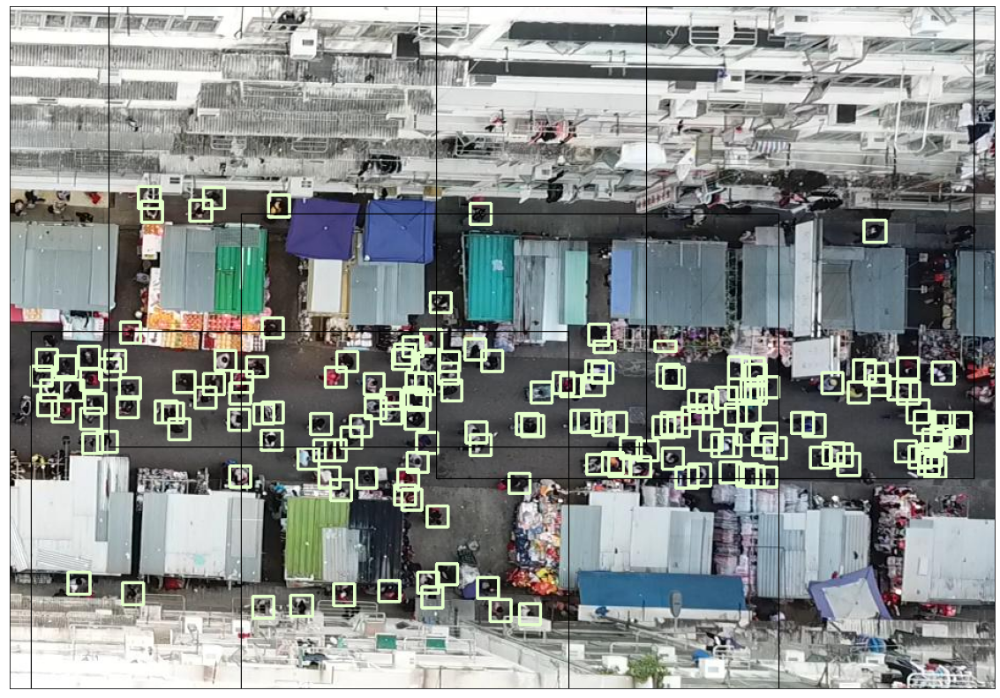

In [41]:
obs_dets = np.array(obs_dets)
obs_dets = obs_dets[obs_dets[:, -2] >= 0.1]
obs_dets = obs_dets[obs_dets[:, -2].argsort()]
for det in obs_dets.tolist():
    xmin,ymin,xmax,ymax,conf,cls = det
    if any([isInsideBbox([xmin,ymin,xmax,ymax], win) for win in wins]):
        img_obs = plot_one_box(
            list(map(int, [xmin,ymin,xmax,ymax])), 
            img_obs, 
            color=colors[int(cls)], 
            label=f'{classes[int(cls)]} {int(conf*100)}%' if show_label else '', lw=2, draw_label=show_label
        ) 


for i,det in enumerate(wins):
    xmin,ymin,xmax,ymax = map(int, det)
    # img_obs = plot_one_box(
    #     list(map(int, [xmin,ymin,xmax,ymax])), 
    #     img_obs, 
    #     color=(255,0,0), 
    #     label=f'WIN{i:02d}'
    # ) 
    img_obs = cv2.rectangle(img_obs, (xmin, ymin), (xmax,ymax), (0,0,0), 1)

# xmin = min([max(x[0]-20,0) for x in wins])
# ymin = min([x[1]-20 for x in wins])
# xmax = max([x[2]+20 for x in wins])
# ymax = max([x[3]+20 for x in wins])

img_obs = img_obs[_ymin:_ymax, _xmin:_xmax,:]

    
plt.figure(figsize=(20,20))
plt.xticks([]);plt.yticks([])
plt.imshow(img_obs)
plt.savefig('../../plots/nms-vs-obs/DC-OBS-select.png', bbox_inches='tight', pad_inches=0)

### concat vis

(1760, 1119, 3)
(1760, 1116, 3)
(1760, 1119, 3)
(1760, 1119, 3) (1760, 10, 3) (1760, 1116, 3) (1760, 1119, 3)


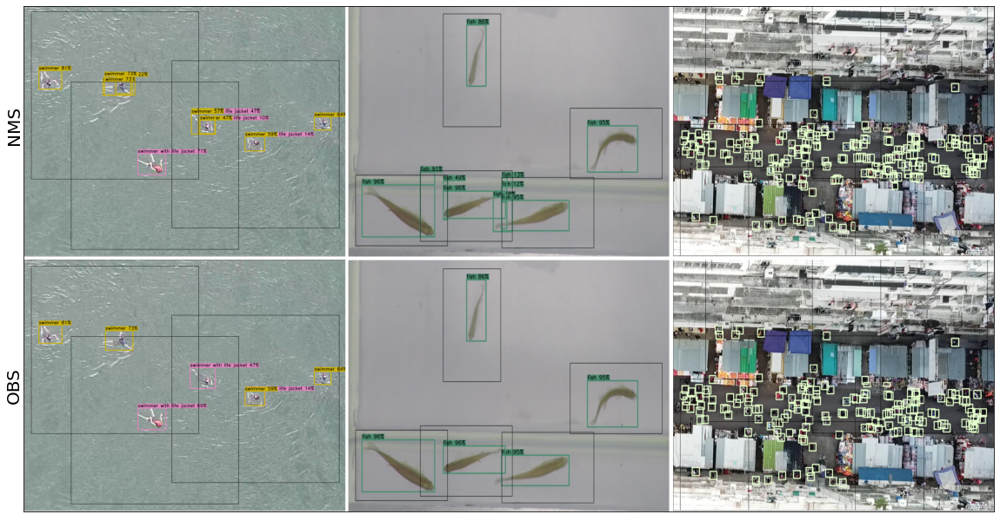

In [37]:
sds_nms, sds_obs = cv2.imread('/home/kos/projects/PhD/EAAI/plots/nms-vs-obs/SDS-NMS.png'), cv2.imread('/home/kos/projects/PhD/EAAI/plots/nms-vs-obs/SDS-OBS.png')
zebra_nms, zebra_obs = cv2.imread('/home/kos/projects/PhD/EAAI/plots/nms-vs-obs/Zebra-NMS-new.png'), cv2.imread('/home/kos/projects/PhD/EAAI/plots/nms-vs-obs/Zebra-OBS-new.png')
dc_nms, dc_obs = cv2.imread('/home/kos/projects/PhD/EAAI/plots/nms-vs-obs/DC-NMS-select.png'), cv2.imread('/home/kos/projects/PhD/EAAI/plots/nms-vs-obs/DC-OBS-select.png')


h,w,c = sds_nms.shape
ruller = np.full((10,w,3), 255)
sds = np.vstack((np.vstack((sds_nms, ruller)), sds_obs))
print(sds.shape)

h,w,c = zebra_nms.shape
ruller = np.full((10,w,3), 255)
zebra = np.vstack((np.vstack((zebra_nms, ruller)), zebra_obs))
zebra = cv2.resize(zebra.astype(np.uint8), (w, 1760))

print(zebra.shape)

h,w,c = dc_nms.shape
ruller = np.full((10,w,3), 255)
dc = np.vstack((np.vstack((dc_nms, ruller)), dc_obs))
dc = cv2.resize(dc.astype(np.uint8), (w, 1760))
print(dc.shape)

ruller = np.full((1760,10,3), 255)


print(sds.shape, ruller.shape, zebra.shape, dc.shape)
_all = np.hstack((np.hstack((sds, ruller)), zebra))
_all = np.hstack((np.hstack((_all, ruller)), dc))

plt.figure(figsize=(20,20))
plt.xticks([]);plt.yticks([])
plt.text(-60, 470, 'NMS', rotation='vertical', fontsize=20)
plt.text(-60, 1370, 'OBS', rotation='vertical', fontsize=20)
plt.imshow(_all[:,:,::-1])
plt.savefig('/home/kos/projects/PhD/EAAI/plots/nms-vs-obs/OBS-vs-NMS.eps', bbox_inches='tight', pad_inches=0)
plt.savefig('/home/kos/projects/PhD/EAAI/plots/nms-vs-obs/OBS-vs-NMS.png', bbox_inches='tight', pad_inches=0)